In [72]:
# from lfs_tree import *
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)
import pydot
import networkx as nx
from string import Template
import pandas as pd
import glob
import pydot
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
import pickle
import os
from IPython.display import Image, display
import matplotlib as mpl

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import Counter
# Configure global font size settings
mpl.rcParams.update({
    'font.size': 25,  # Default font size for titles, labels, and tick labels
    'axes.labelsize': 25,  # Font size for axis labels
    'xtick.labelsize': 20,  # Font size for x-axis tick labels
    'ytick.labelsize': 18,  # Font size for y-axis tick labels
    'legend.fontsize': 20  # Font size for the legend
})


In [73]:
rules_dict = {}
for f in glob.glob('../../chatgpt_rbbm/chatgpt_rules/*_gpt_rules.pkl'):
    with open(f, 'rb') as file:
        rules_dict[f.split('/')[-1].split('_')[0]] = pickle.load(file)


In [151]:
for k,v in rules_dict.items():
    print(f"{k}:{len(v)}")

painter:120
amazon:86
professor:110
youtube:65


In [74]:
def view_pydot(pdot):
    plt = Image(pdot.create_png())
    display(plt)

def show_trees(directory):
    print(directory)
    treefiles = glob.glob(f'{directory}*tree_*')
    print(len(treefiles))
#     print(treefiles)
    num_trees_per_strat = len(treefiles)/2
#     for i in range(0, int(num_trees_per_strat)):
    for f in glob.glob(f'{directory}*tree_*'):
        file = open(f)
        dot_string = file.read()
        print(f)
        print(dot_string)
        graph = pydot.graph_from_dot_data(dot_string)[0]
        view_pydot(graph)
        print('\n')
        
def show_stats(directory):
    f = glob.glob(f'{directory}*experiment_stats')[0]
#     print(f)
#                                 experiment_stats
#     file = open('../intro_example/experiment_stats')
    df = pd.read_csv(f)
#     print(df)
    return df

def show_user_inputs(directory):
    f = glob.glob(f'{directory}sampled*')[0]
    df = pd.read_csv(f)
    print(list(df))
    return df.sort_values(by=['text'])

def view_repair_bookkeeping_results(directory):
    print(glob.glob(f'{directory}*book_keeping_dict*'))
    f = glob.glob(f'{directory}*book_keeping_dict*')[0]
#               20230921002723fix_book_keeping_dict.pkl
    with open(f, 'rb') as file:
        # Load the object from the file
        loaded_object = pickle.load(file)
#         print("Object loaded successfully:")
#         print(loaded_object)
    return loaded_object

In [75]:
# postproecssing 
# show fix rate, confirm preserve rate, global rate
# find some reasonable repairs

In [76]:
dir4 = '../../rbbm_src/gpt_experiment_results_folders_vary_uq/'

In [77]:
import os
import re
import glob

# Path to the main directory
main_folder = dir4
# folders = [dir4]

def summarize_vector(x):
    vector=x.split(',')
    return Counter(vector)

def read_and_print_file_content(file_path):
    return pd.read_csv(file_path)

# Regular expression pattern for matching subfolder names (e.g., 'YYYY-MM-DD')
folder_pattern =  r'_20240201.*'

# File pattern to match within subfolders (e.g., all '.txt' files)
file_pattern = 'experiment_stats'

stats_dfs = []
# Iterate over all items in the main folder
for item in os.listdir(main_folder):
    # Full path of the item
    path = os.path.join(main_folder, item)
#     print(path)
    # Check if it's a folder and matches the pattern
    if os.path.isdir(path) and re.match(folder_pattern, item):
#         print(path)
        # Use glob to find files that match the file pattern in the subfolder
        for file in glob.glob(f'{path}/*experiment_stats'):
            df = read_and_print_file_content(file)
            stats_dfs.append(df)


In [78]:
stats_df = pd.concat(stats_dfs)

In [120]:
stats_df.sort_values(by='fix_rate',ascending=False)[['table_name','timestamp_str','fix_rate',
                                                     'confirm_preserve_rate','global_accuracy',
                                                     'new_global_accuracy','user_input_size'
                                                    ]]

,table_name,timestamp_str,fix_rate,confirm_preserve_rate,global_accuracy,new_global_accuracy,user_input_size
0,youtube,20240201154712,1.000,1.000,0.831,0.685,40
0,professor_teacher,20240201122700,0.650,0.950,0.828,0.844,40
0,painter_architect,20240201110938,0.600,1.000,0.953,0.949,40
0,professor_teacher,20240201130747,0.575,1.000,0.828,0.817,80
0,professor_teacher,20240201114944,0.500,0.975,0.828,0.834,80
0,professor_teacher,20240201095348,0.500,1.000,0.828,0.841,40
0,amazon,20240201103628,0.500,1.000,0.728,0.825,80
0,professor_teacher,20240201103130,0.475,1.000,0.828,0.835,80
0,painter_architect,20240201114658,0.475,0.975,0.953,0.950,80
0,amazon,20240201095836,0.450,1.000,0.728,0.803,40


In [80]:
# given a directory, show the correct fixes and the indices of the rules involved
def show_effective_tree_repairs(directory, rule_dict):
    f_before_repaired = glob.glob(directory+'*_initial_results.csv')[0]
    df_before_repaired = pd.read_csv(f_before_repaired)
    f_repaired = glob.glob(directory+'*_after_fix_results.csv')[0]
    df_repaired = pd.read_csv(f_repaired)
    user_inputs = show_user_inputs(directory)
    cols = ['cid','text','model_pred','vectors']
    df_user_after_repair = df_repaired[df_repaired['cid'].isin(list(user_inputs['cid']))][cols]
    df_user_before_repair = df_before_repaired[df_before_repaired['cid'].isin(list(user_inputs['cid']))][cols]
    df_user_after_repair['vector_summary'] = df_user_after_repair['vectors'].apply(summarize_vector)
    df_user_after_repair.rename(columns={'vector_summary': 'vector_summary_after',
                                        'model_pred':'model_pred_after',
                                        'vectors':'after_vectors'}, inplace=True)

    df_user_before_repair['vector_summary'] = df_user_before_repair['vectors'].apply(summarize_vector)
    df_user_before_repair.rename(columns={'vector_summary': 'vector_summary_before',
                                         'model_pred':'model_pred_before',
                                         'vectors':'before_vectors'}, inplace=True)
    df_user_before_and_after = pd.merge(df_before_repaired,df_repaired, on='cid')
    merged_df = pd.merge(df_user_before_repair, df_user_after_repair, on=['cid','text'])
    user_input_df= user_inputs[['expected_label','cid']]
    merged_df = pd.merge(merged_df,user_input_df,on='cid')
    summary = merged_df[['cid','model_pred_before','model_pred_after','expected_label',
                         'vector_summary_before','vector_summary_after',
                         'before_vectors','after_vectors']]
    correct_repairs= summary[(summary['model_pred_before']!=summary['expected_label']) &
       (summary['model_pred_after']==summary['expected_label'])]
#     print(correct_repairs[correct_repairs['cid']==3051])
    res = {}
    for index, row in correct_repairs.iterrows():
        before_vector_list = row['before_vectors'].split(',')
        after_vector_list = row['after_vectors'].split(',')
        mismatch_indices = [i for i, (x, y) in enumerate(zip(before_vector_list, after_vector_list)) if x != y]
        res[row['cid']] = mismatch_indices
    return res

In [122]:
correct_repairs = show_effective_tree_repairs(dir4+'_20240201114658/',
                                         rules_dict)

['old_text', 'expected_label', 'fold', 'cid', 'stems', 'text', 'model_pred', 'vectors', 'id']


In [123]:
correct_repairs

{707: [1, 3, 15, 28, 41, 56, 59],
 834: [1, 3, 4, 5, 15, 26, 28, 46],
 2433: [9],
 3692: [27],
 4659: [46],
 5473: [3, 4, 20],
 7333: [50],
 8249: [119],
 8374: [14],
 8461: [50],
 8974: [50, 83],
 9019: [50],
 9382: [83],
 9566: [14],
 9615: [100],
 10108: [50],
 10206: [14],
 10744: [50],
 11329: [50]}

In [85]:
df_user_input = show_user_inputs(dir4+'_20240201122700/')

['old_text', 'expected_label', 'fold', 'cid', 'stems', 'text', 'model_pred', 'vectors', 'id']


In [86]:
df_user_input[df_user_input['cid']==1446]

,old_text,expected_label,fold,cid,stems,text,model_pred,vectors,id
12,"_ is also the father of a child suffering from ASD. After doing extensive research on this subject, _ could not find suitable scientific answers. _, two grad assistants, and Fred Nicklaus (owner of the Nicklaus Martial Arts America Studio) set off on an 11-week study. They recruited six high-functioning children with autism spectrum disorders to participate in weekly 45 minute sessions.",1,0,1446,"['_', 'is', 'also', 'the', 'father', 'of', 'a', 'child', 'suffer', 'from', 'asd', '.', 'after', 'do', 'extens', 'research', 'on', 'thi', 'subject', ',', '_', 'could', 'not', 'find', 'suitabl', 'scientif', 'answer', '.', '_', ',', 'two', 'grad', 'assist', ',', 'and', 'fred', 'nicklau', '(', 'owner', 'of', 'the', 'nicklau', 'martial', 'art', 'america', 'studio', ')', 'set', 'off', 'on', 'an', '11-week', 'studi', '.', 'they', 'recruit', 'six', 'high-funct', 'children', 'with', 'autism', 'spectrum', 'disord', 'to', 'particip', 'in', 'weekli', '45', 'minut', 'session', '.']",is also the father of a child suffering from asd after doing extensive research on this subject could not find suitable scientific answers two grad assistants and fred nicklaus owner of the nicklaus martial arts america studio set off on an week study they recruited six high functioning children with autism spectrum disorders to participate in weekly minute sessions,0,"-1,-1,-1,-1,-1,-1,-1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1",12


../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/
110
../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_0_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(brilliant)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


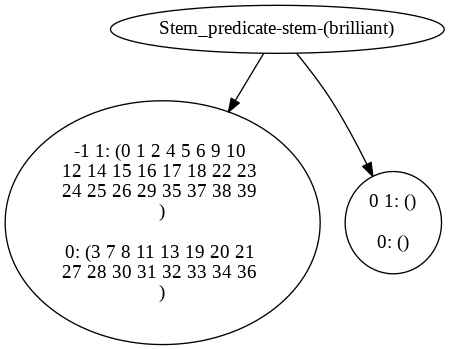



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_1_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(valuabl)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


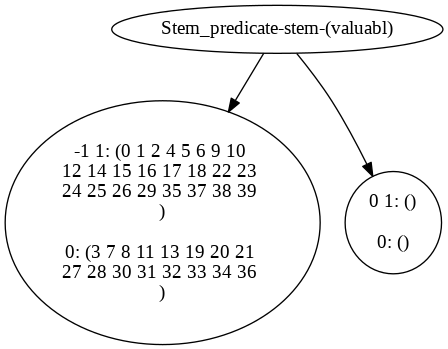



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_2_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:1
1 [label="Stem_predicate-stem-(effect)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 19 20 21 27 
28 30 31 32 33 34 36 )
"]
3 [color=yellow, label="0 1: ()

0: (13 )
"]
//
} } 


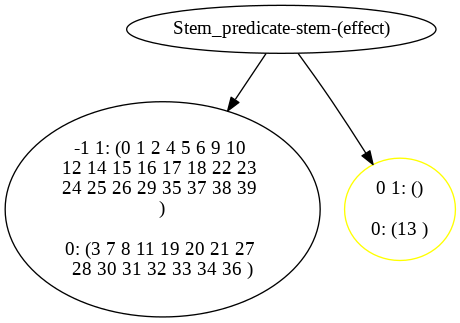



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_3_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(cheerlead)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


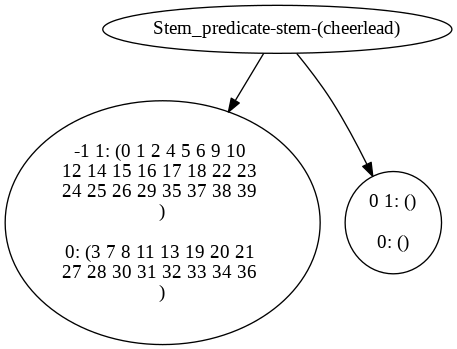



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_4_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(educ)"]
1->2
1->4
2 [label="-1 1: (5 6 9 10 12 14 15 17 
22 23 24 25 26 29 35 37 
38 )

0: (3 7 8 11 13 19 20 21 
27 28 31 32 33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(focus)"]
4->5
4->6
5 [color=blue, label="1 0: ()

1: (0 1 2 4 16 18 39 )
"]
6 [color=blue, label="0 0: (30 )

1: ()
"]
//
} } 


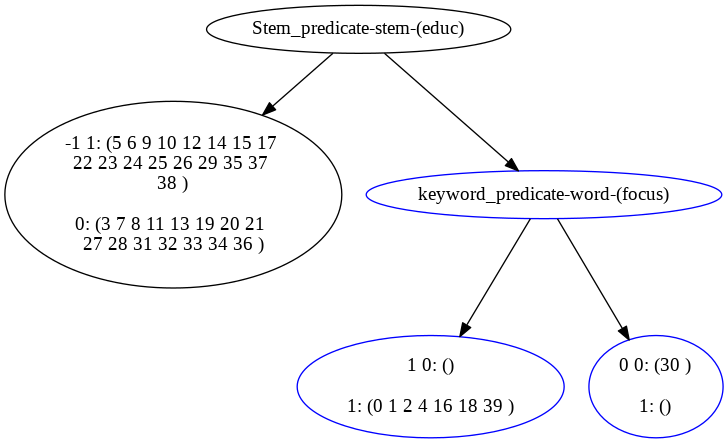



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_5_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(marri)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 32 33 34 36 )
"]
3 [label="0 1: ()

0: (31 )
"]
//
} } 


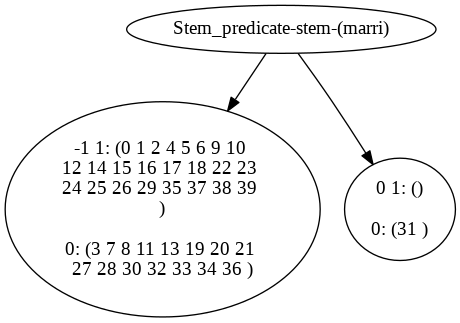



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_6_dot_file
digraph "rule" { 
// presize: 3, after_size: 7, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(teach)"]
1->2
1->4
2 [label="-1 1: (0 1 4 5 6 9 10 12 
14 15 18 22 24 25 26 29 
37 38 39 )

0: (3 8 11 20 27 28 31 32 
33 34 )
"]
4 [color=blue, label="keyword_predicate-word-(graduate)"]
4->7
4->6
7 [color=blue, label="keyword_predicate-word-(research)"]
7->8
7->9
6 [color=blue, label="1 0: ()

1: (2 16 17 )
"]
8 [color=blue, label="0 0: (7 13 19 21 30 36 )

1: ()
"]
9 [color=blue, label="1 0: ()

1: (23 35 )
"]
//
} } 


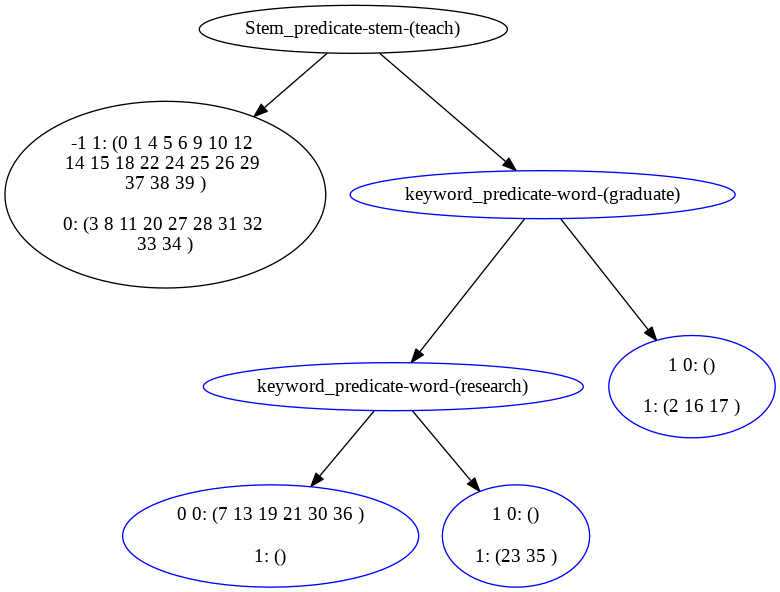



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_7_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(art)"]
1->2
1->4
2 [label="-1 1: (0 2 4 5 6 9 14 15 
16 17 18 22 23 24 25 26 
29 35 37 38 39 )

0: (3 7 8 11 13 19 20 21 
27 31 32 33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(writing)"]
4->5
4->6
5 [color=blue, label="1 0: ()

1: (1 10 12 )
"]
6 [color=blue, label="0 0: (28 30 )

1: ()
"]
//
} } 


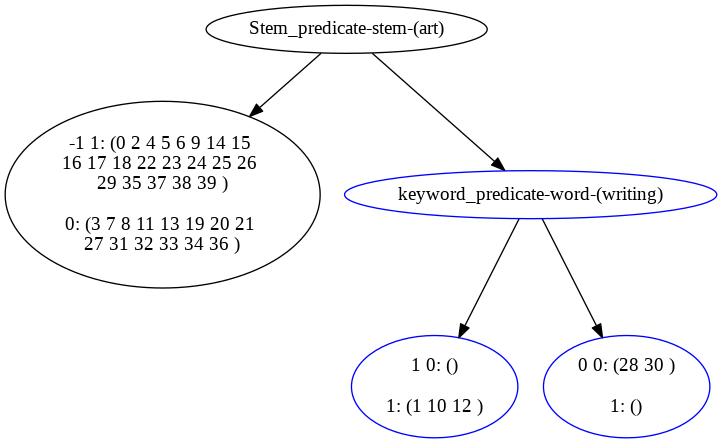



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_8_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(hike)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 8 11 13 19 20 21 27 
28 30 31 32 33 34 36 )
"]
3 [label="0 1: ()

0: (7 )
"]
//
} } 


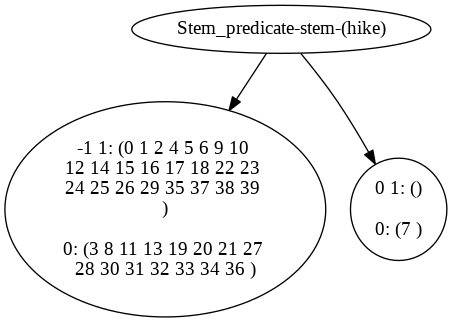



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_9_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(paint)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


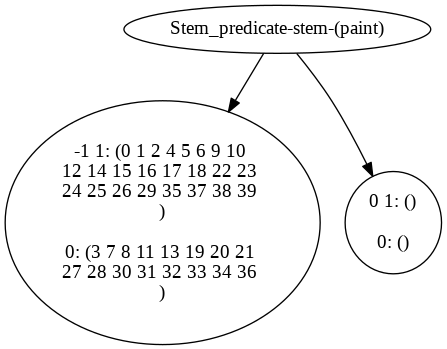



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_10_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(piano)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


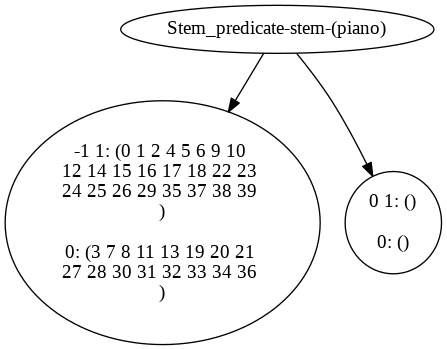



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_11_dot_file
digraph "rule" { 
// presize: 3, after_size: 9, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(publish)"]
1->2
1->4
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
25 26 37 38 )

0: (3 7 11 13 20 21 27 30 
31 32 33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(international)"]
4->7
4->6
7 [color=blue, label="keyword_predicate-word-(book)"]
7->8
7->10
6 [color=blue, label="1 0: ()

1: (24 39 )
"]
8 [color=blue, label="0 0: (8 19 )

1: ()
"]
10 [color=blue, label="keyword_predicate-word-(day)"]
10->11
10->12
11 [color=blue, label="1 0: ()

1: (29 35 )
"]
12 [color=blue, label="0 0: (28 )

1: ()
"]
//
} } 


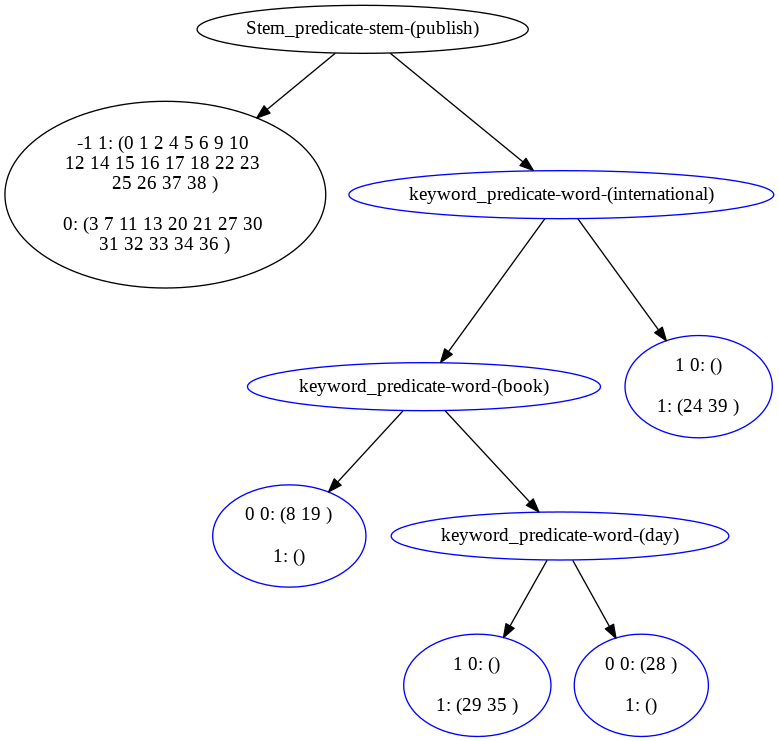



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_12_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(alli)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


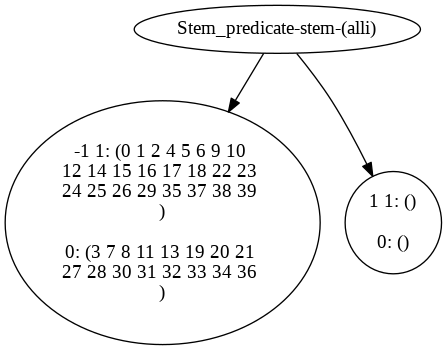



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_13_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(lgbtq)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


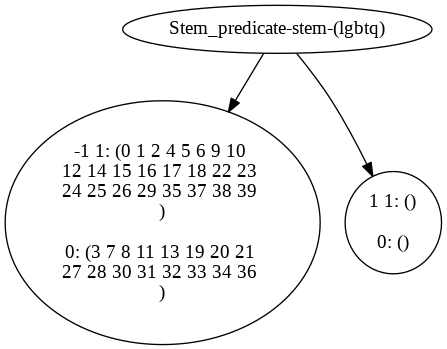



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_14_dot_file
digraph "rule" { 
// presize: 3, after_size: 9, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(school)"]
1->2
1->4
2 [label="-1 1: (0 2 4 5 6 10 12 17 
18 22 23 24 25 26 29 35 
37 38 )

0: (3 7 8 11 13 19 20 27 
32 33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(three)"]
4->7
4->6
7 [color=blue, label="keyword_predicate-word-(focus)"]
7->10
7->9
6 [color=blue, label="0 0: (21 28 )

1: ()
"]
10 [color=blue, label="keyword_predicate-word-(taught)"]
10->11
10->12
9 [color=blue, label="0 0: (30 )

1: ()
"]
11 [color=blue, label="1 0: ()

1: (1 9 14 15 16 39 )
"]
12 [color=blue, label="0 0: (31 )

1: ()
"]
//
} } 


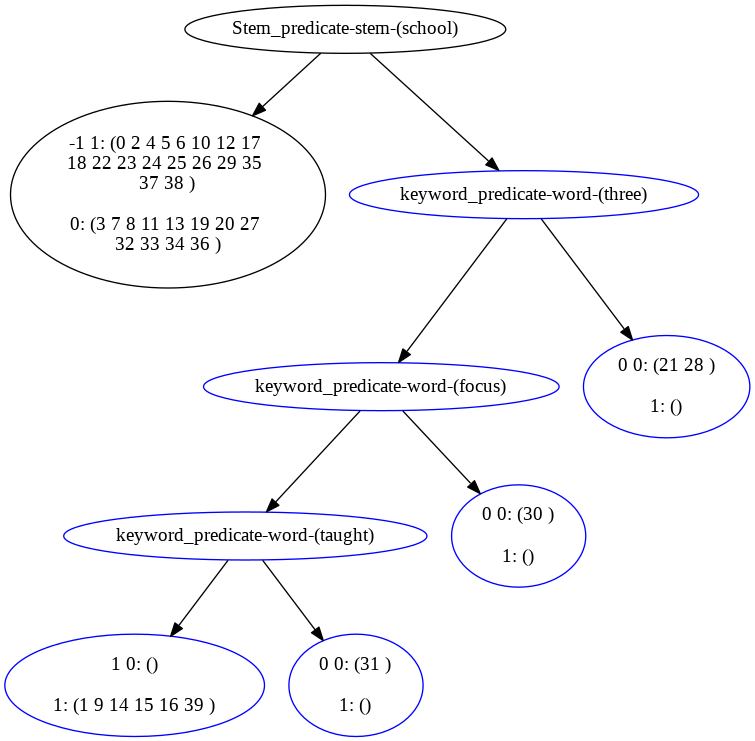



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_15_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(taught)"]
1->2
1->4
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 29 37 38 39 )

0: (3 7 8 11 13 21 28 30 
32 33 36 )
"]
4 [color=blue, label="keyword_predicate-word-(university)"]
4->5
4->6
5 [color=blue, label="0 0: (19 20 27 31 34 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (26 35 )
"]
//
} } 


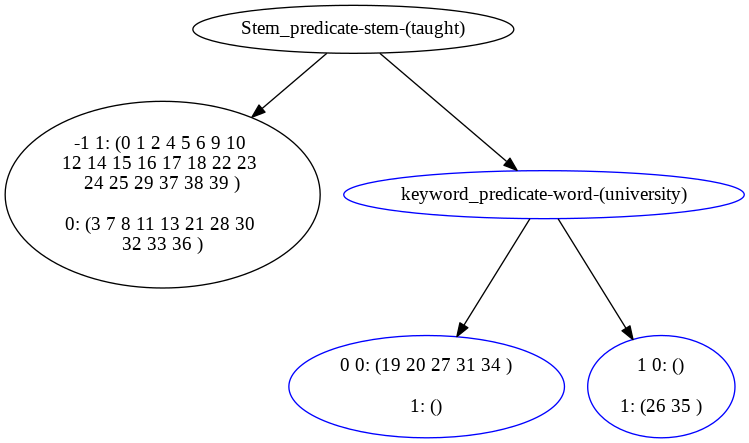



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_16_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(teacher,train)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


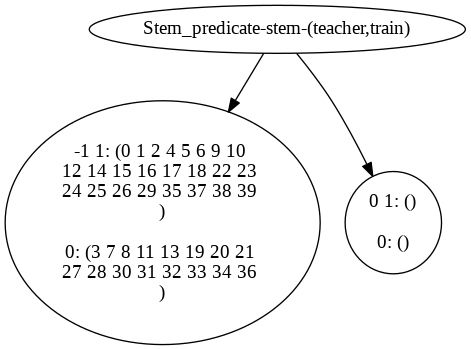



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_17_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(writer,in,resid)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


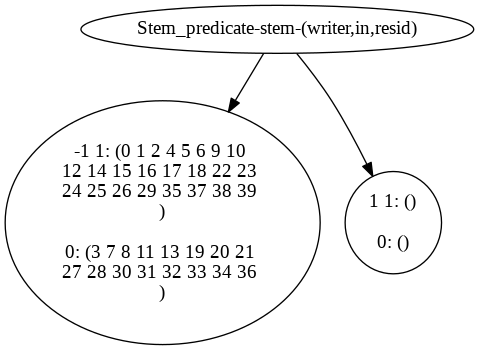



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_18_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(chines)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


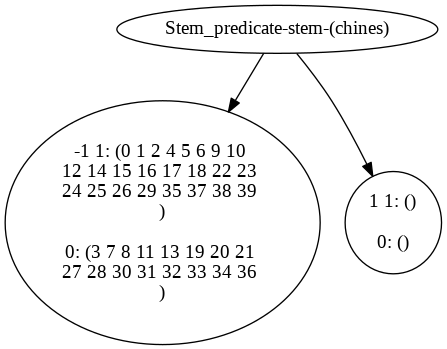



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_19_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(immigr)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


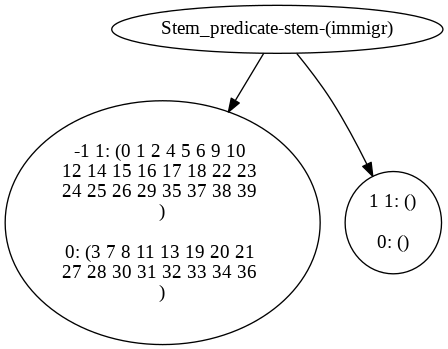



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_20_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(young,learner)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


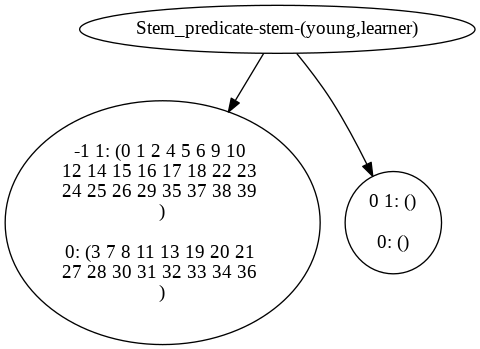



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_21_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(environment)"]
1->2
1->4
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 23 24 
25 26 29 35 37 38 39 )

0: (3 7 8 11 13 20 21 27 
28 30 31 32 33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(works)"]
4->5
4->6
5 [color=blue, label="0 0: (19 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (22 )
"]
//
} } 


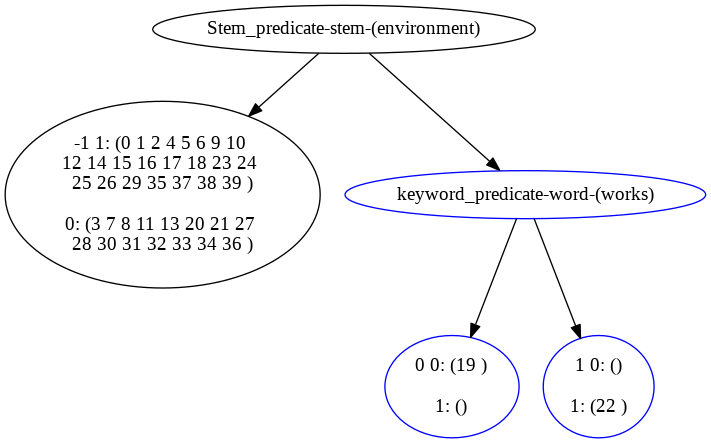



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_22_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(execut,committe)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


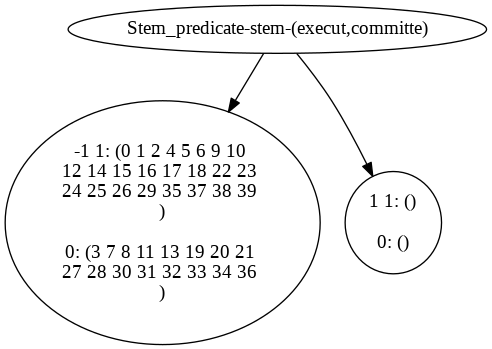



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_23_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(vocal,techniqu)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


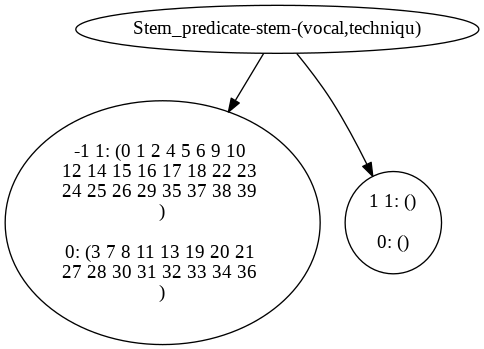



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_24_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(chemic,engin)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


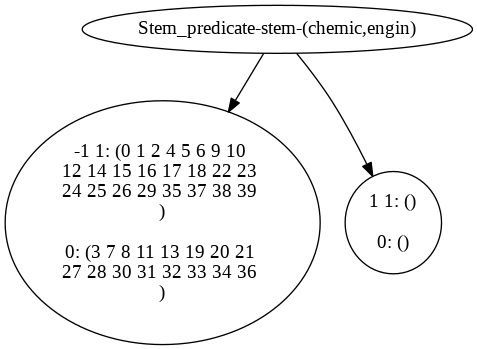



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_25_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(sleep,with)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


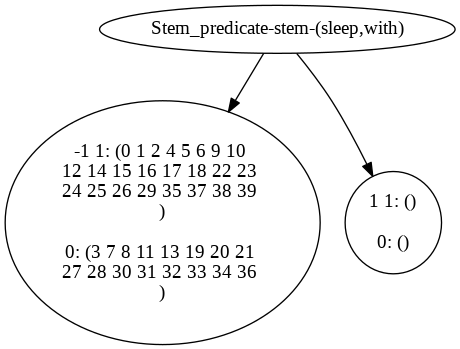



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_26_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(analysi)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


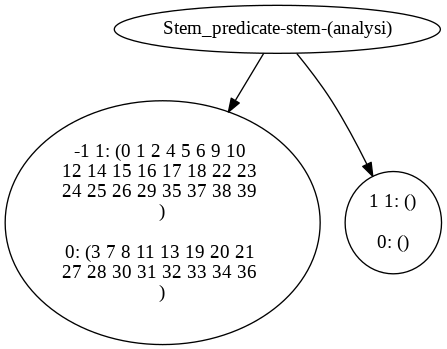



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_27_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(examin)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


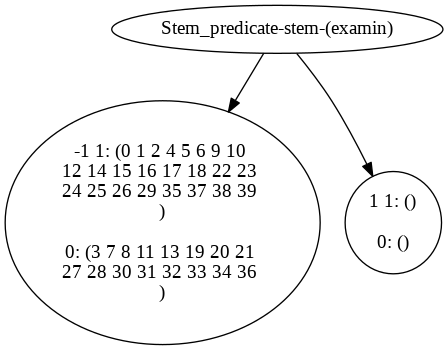



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_28_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(student)"]
1->2
1->4
2 [label="-1 1: (0 1 6 9 10 12 14 15 
16 17 18 22 23 24 25 26 
29 35 37 38 39 )

0: (3 7 8 11 13 19 20 27 
28 30 32 33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(school)"]
4->5
4->6
5 [color=blue, label="1 0: ()

1: (2 4 5 )
"]
6 [color=blue, label="0 0: (21 31 )

1: ()
"]
//
} } 


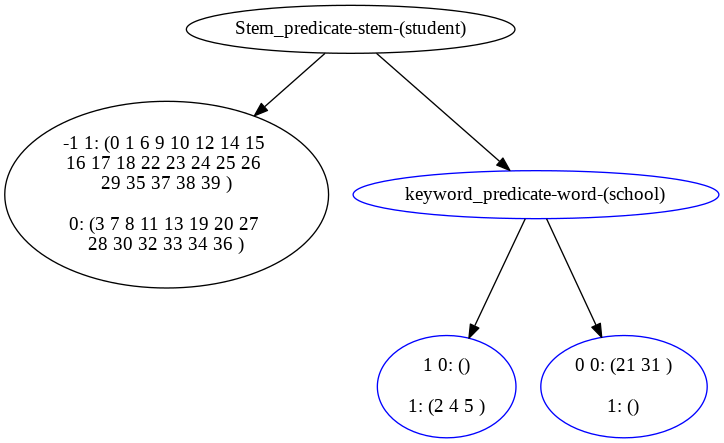



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_29_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(teacher)"]
1->2
1->4
2 [label="-1 1: (0 1 2 5 6 9 10 12 
15 16 17 18 22 23 24 25 
26 29 35 37 38 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 32 33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(taught)"]
4->5
4->6
5 [color=blue, label="1 0: ()

1: (4 14 )
"]
6 [color=blue, label="0 0: (31 )

1: ()
"]
//
} } 


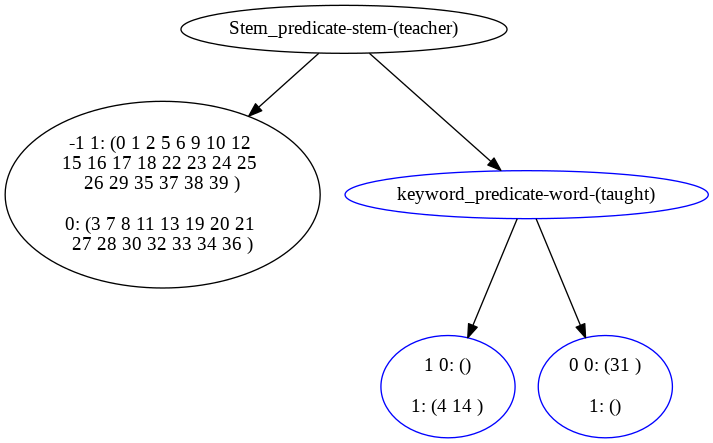



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_30_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(muskoka)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


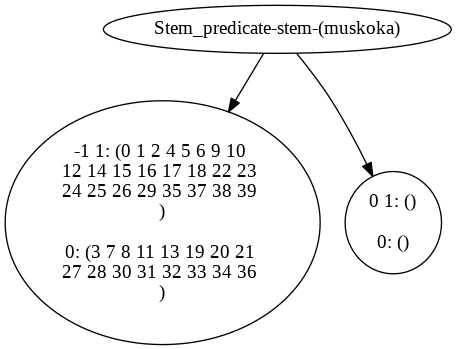



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_31_dot_file
digraph "rule" { 
// presize: 3, after_size: 7, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(children)"]
1->2
1->4
2 [label="-1 1: (0 1 2 6 9 10 14 15 
16 17 18 22 23 24 25 26 
29 35 37 38 39 )

0: (3 7 8 11 13 19 20 21 
27 30 31 32 34 )
"]
4 [color=blue, label="keyword_predicate-word-(writing)"]
4->7
4->6
7 [color=blue, label="keyword_predicate-word-(found)"]
7->8
7->9
6 [color=blue, label="0 0: (28 33 )

1: ()
"]
8 [color=blue, label="1 0: ()

1: (4 5 12 )
"]
9 [color=blue, label="0 0: (36 )

1: ()
"]
//
} } 


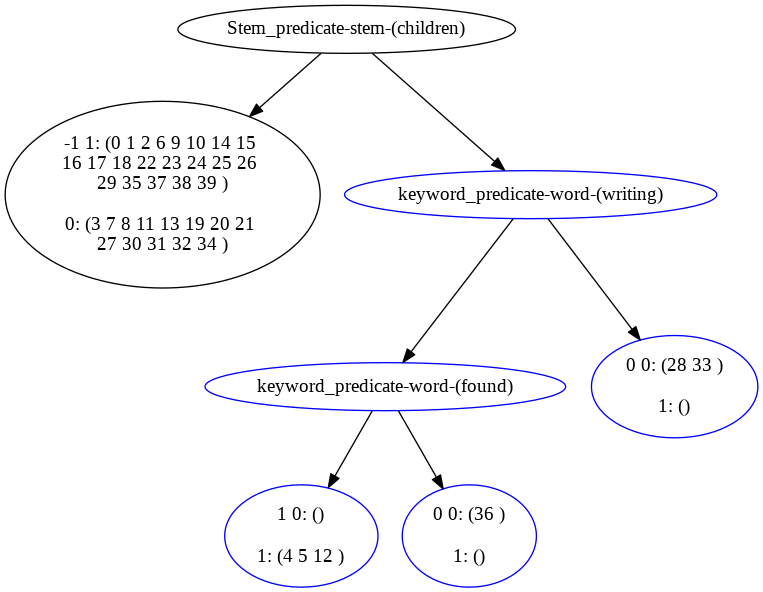



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_32_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(husband)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


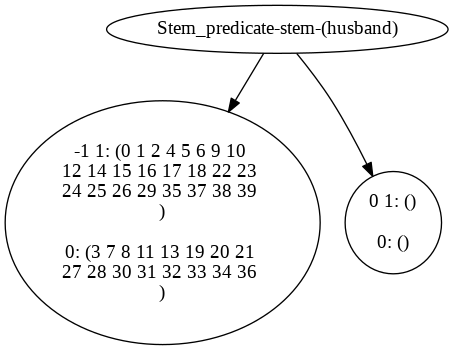



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_33_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(kayak)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


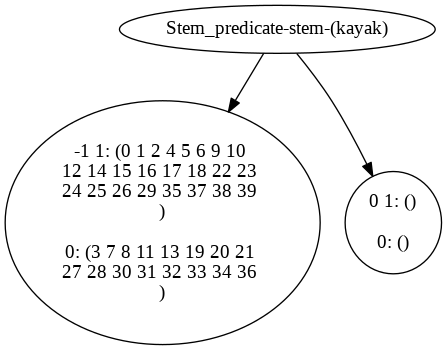



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_34_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(outdoor)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 )
"]
3 [label="0 1: ()

0: (36 )
"]
//
} } 


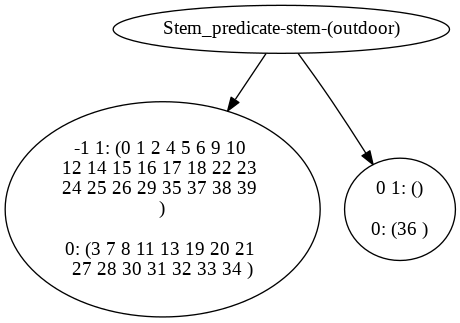



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_35_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(read)"]
1->2
1->4
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 38 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 31 33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(industrial)"]
4->5
4->6
5 [color=blue, label="0 0: (32 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (37 )
"]
//
} } 


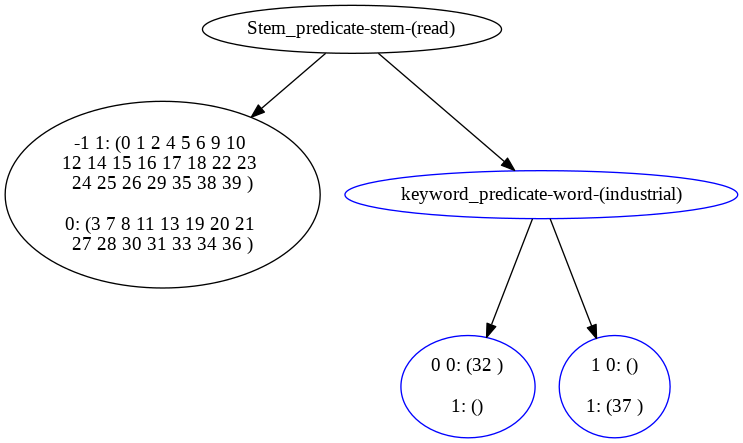



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_36_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(write)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (7 8 11 13 19 20 21 31 
34 36 )
"]
3 [label="0 1: ()

0: (3 27 28 30 32 33 )
"]
//
} } 


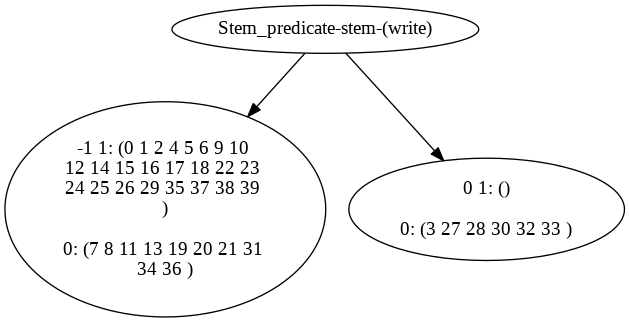



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_37_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(english)"]
1->2
1->4
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 18 22 23 24 
25 26 29 35 37 38 39 )

0: (7 11 13 19 21 27 31 32 
33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(also)"]
4->5
4->6
5 [color=blue, label="0 0: (3 8 20 28 30 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (17 )
"]
//
} } 


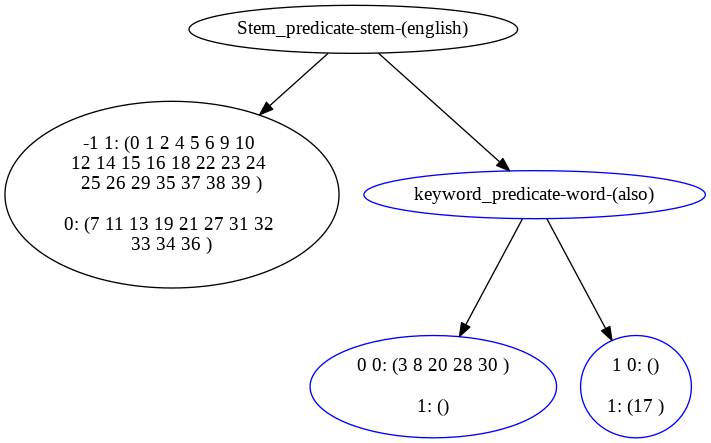



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_38_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(discuss)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


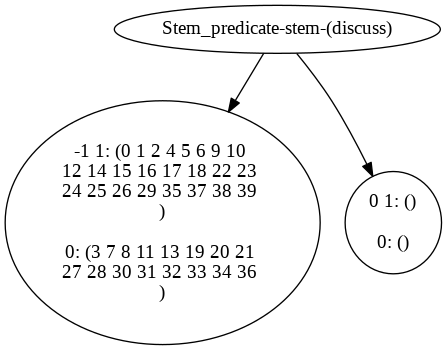



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_39_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(pedagog,section)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


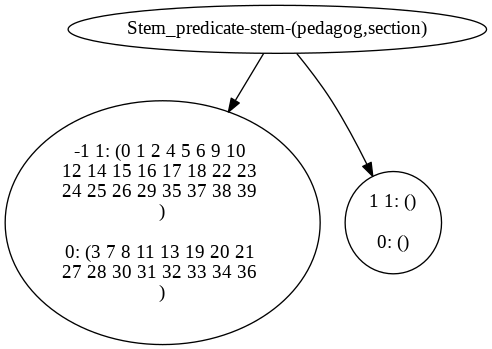



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_40_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(enrich,program)"]
1->2
1->3
2 [label="-1 1: (0 1 2 5 6 9 10 12 
14 15 16 17 18 22 23 24 
25 26 29 35 37 38 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: (4 )

0: ()
"]
//
} } 


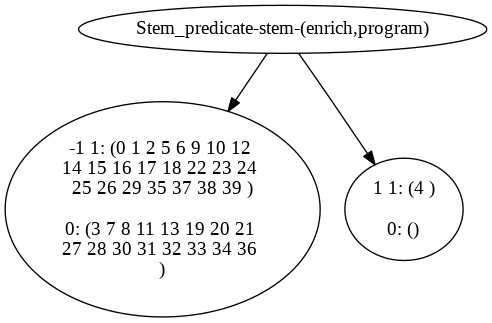



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_41_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:1
1 [label="Stem_predicate-stem-(lectur)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 13 19 20 21 27 
28 30 31 32 33 34 36 )
"]
3 [color=yellow, label="0 1: ()

0: (11 )
"]
//
} } 


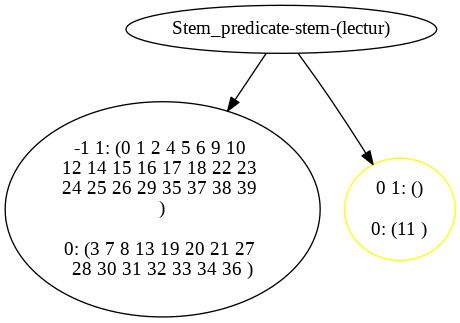



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_42_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(elt)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


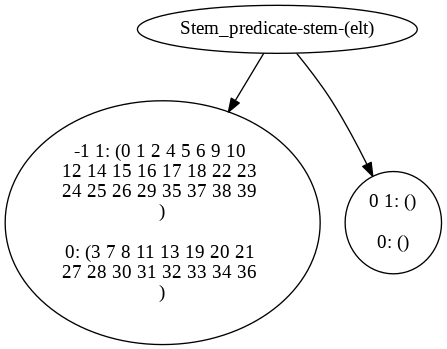



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_43_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(reflect)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


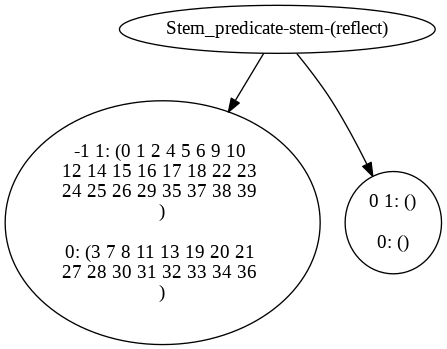



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_44_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(violin,perform)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


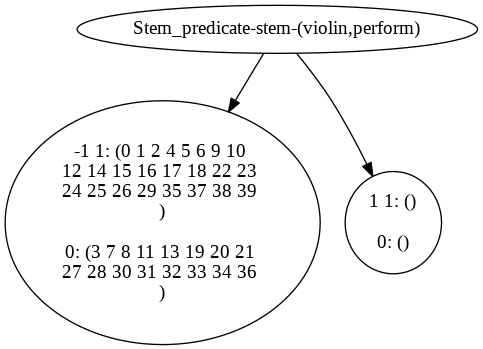



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_45_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(lab)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 26 29 35 37 38 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: (25 )

0: ()
"]
//
} } 


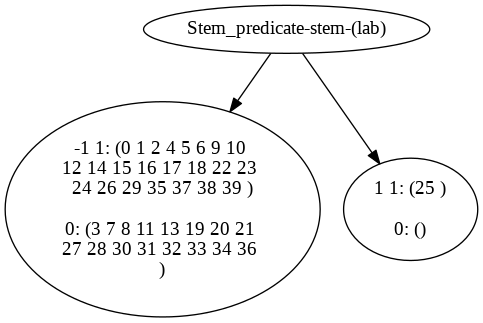



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_46_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(physic,activ)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


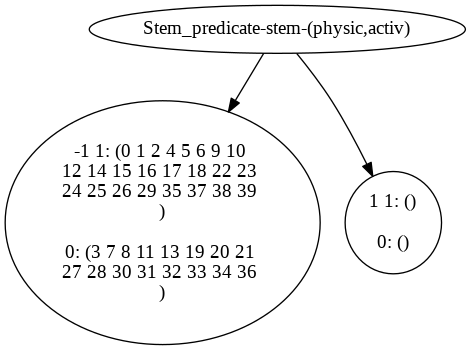



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_47_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(research)"]
1->2
1->4
2 [label="-1 1: (0 1 2 4 6 9 10 15 
17 18 24 26 29 37 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 36 )
"]
4 [color=blue, label="keyword_predicate-word-(third)"]
4->5
4->6
5 [color=blue, label="1 0: ()

1: (5 12 14 16 22 23 25 35 
38 )
"]
6 [color=blue, label="0 0: (34 )

1: ()
"]
//
} } 


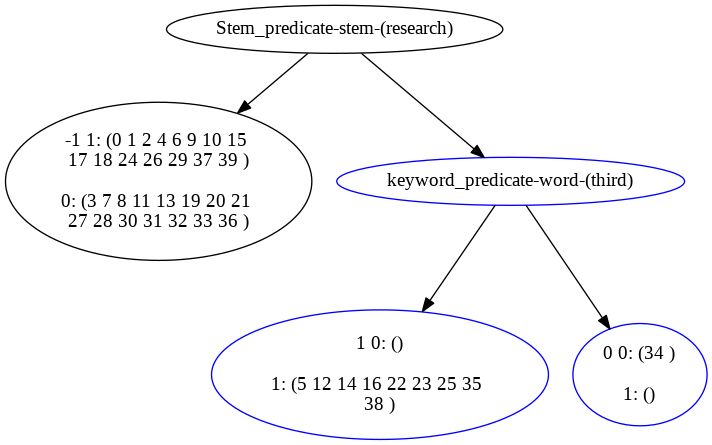



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_48_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(adob,photoshop)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


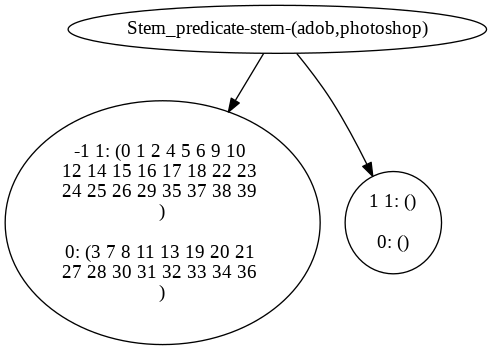



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_49_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(comput)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 29 35 37 38 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: (26 )

0: ()
"]
//
} } 


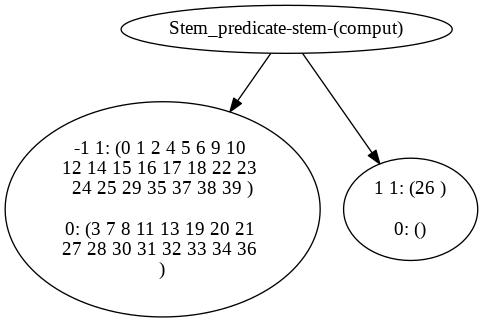



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_50_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(graphic,art)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


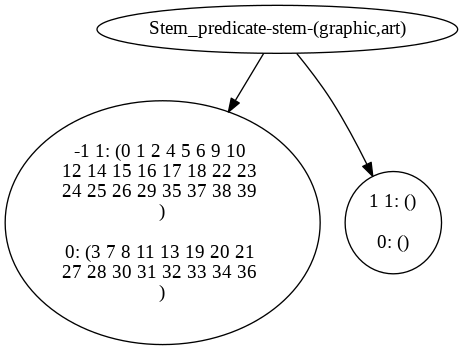



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_51_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(biotechnolog)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


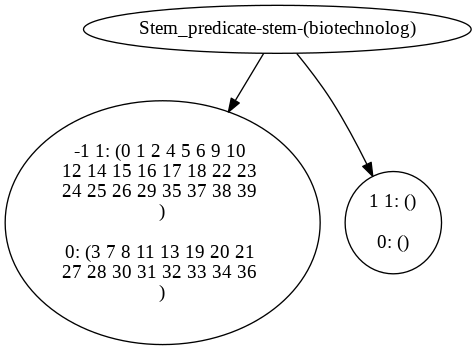



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_52_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(journal)"]
1->2
1->4
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
25 26 29 35 37 38 )

0: (3 7 8 11 13 19 20 21 
27 30 31 32 33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(international)"]
4->5
4->6
5 [color=blue, label="0 0: (28 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (24 39 )
"]
//
} } 


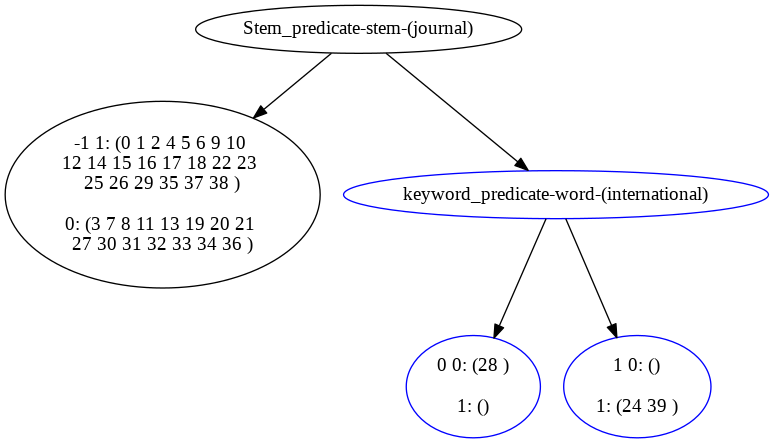



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_53_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(nanotechnolog)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


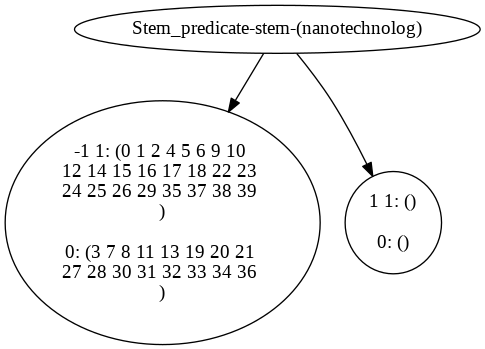



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_54_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(orthoped)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


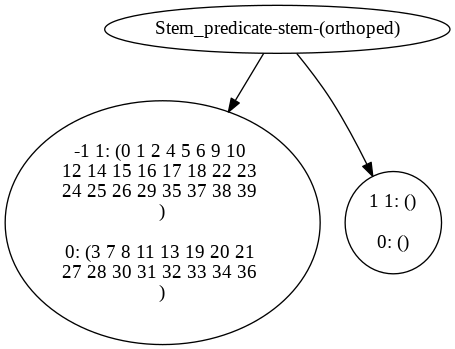



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_55_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(patellofemor)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


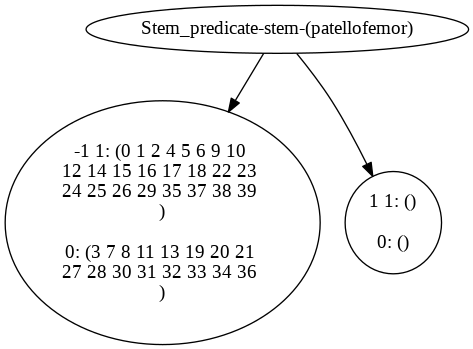



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_56_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(pediatr)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


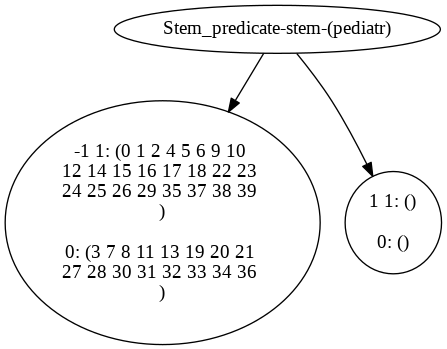



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_57_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(surgeon)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


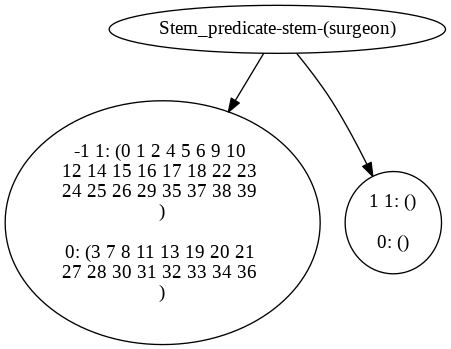



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_58_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(relationship)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


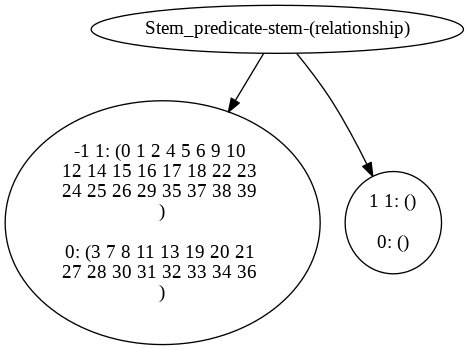



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_59_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(biographi)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


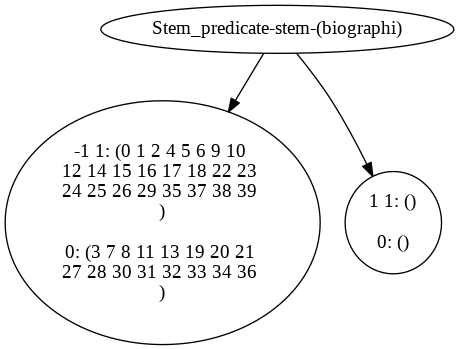



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_60_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:1
1 [label="Stem_predicate-stem-(cultur)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 19 20 21 27 
28 30 31 32 33 34 36 )
"]
3 [color=yellow, label="0 1: ()

0: (13 )
"]
//
} } 


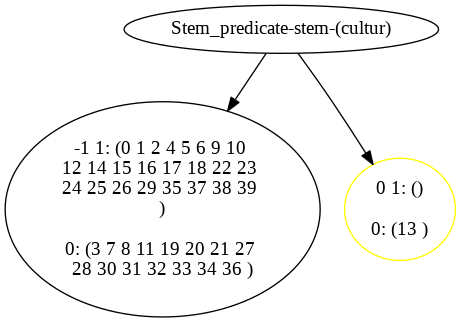



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_61_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(social)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 24 
25 26 29 35 37 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: (23 38 )

0: ()
"]
//
} } 


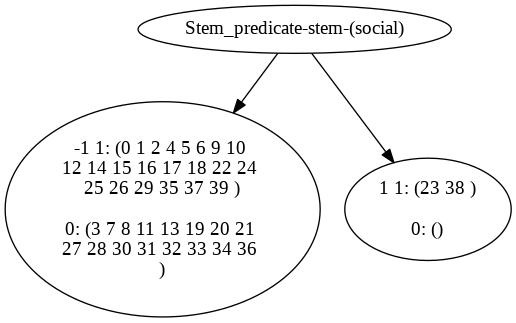



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_62_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(centr)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


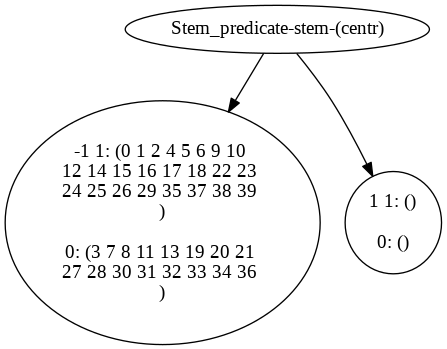



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_63_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(legal,studi)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


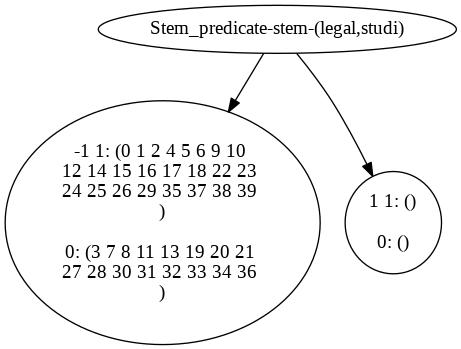



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_64_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(oxford,univers)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


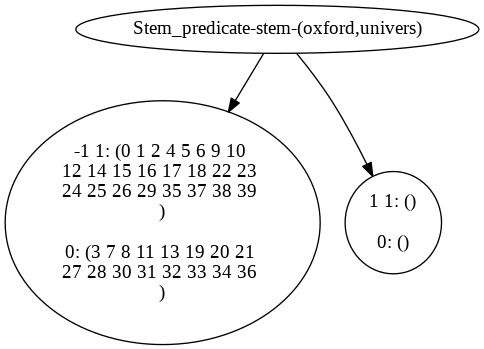



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_65_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(transnat)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


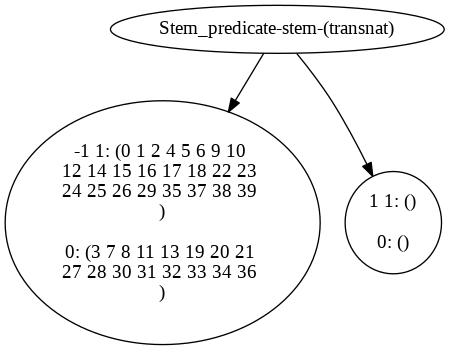



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_66_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(visit,professor)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


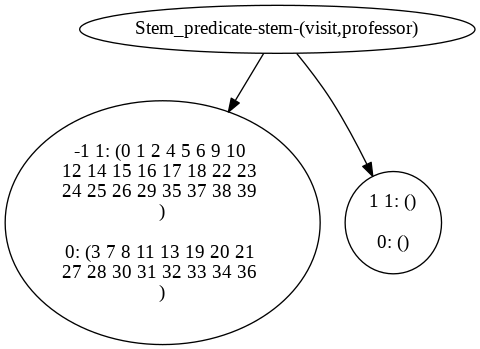



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_67_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(evolutionari)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


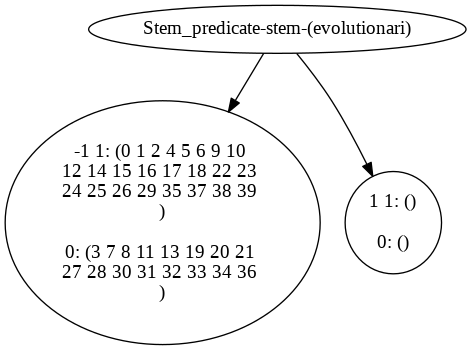



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_68_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(scientif,advisor)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


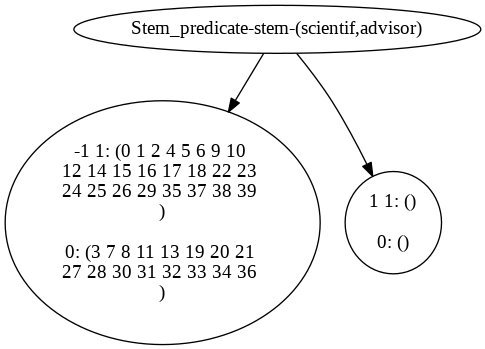



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_69_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(public)"]
1->2
1->4
2 [label="-1 1: (0 1 2 4 6 10 12 14 
15 16 17 22 23 24 25 26 
29 35 37 38 39 )

0: (3 8 11 13 19 20 21 27 
28 30 31 32 33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(health)"]
4->5
4->6
5 [color=blue, label="0 0: (7 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (5 9 18 )
"]
//
} } 


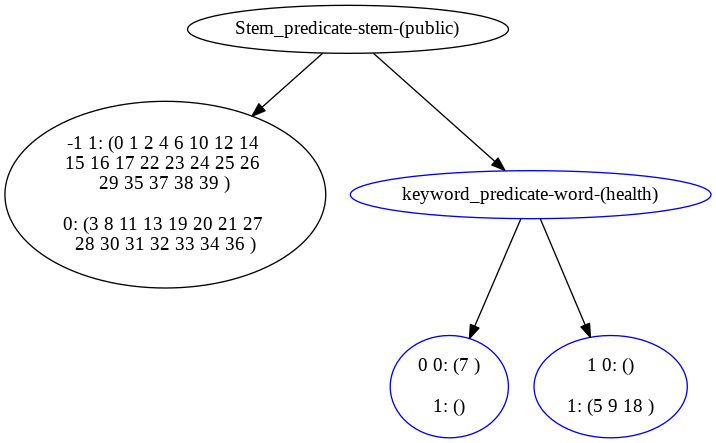



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_70_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(expertis)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


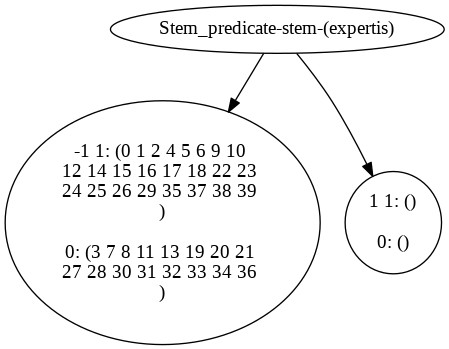



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_71_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(minim,invas,techniqu)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


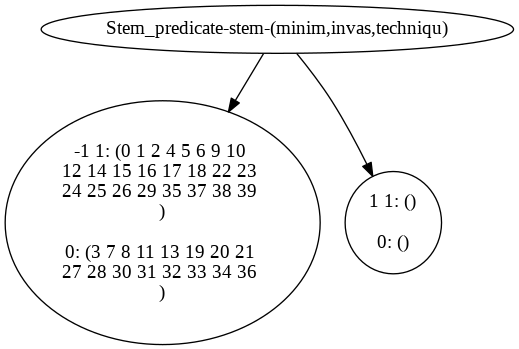



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_72_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(treat)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


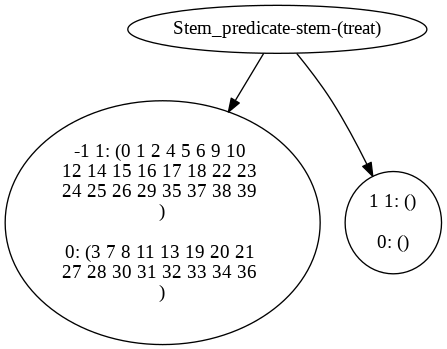



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_73_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(nation,scienc,foundat)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 29 35 37 38 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: (26 )

0: ()
"]
//
} } 


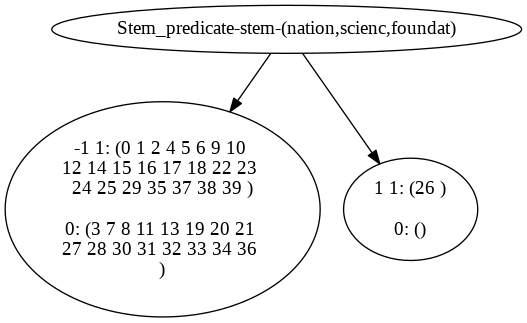



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_74_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(prestigi)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


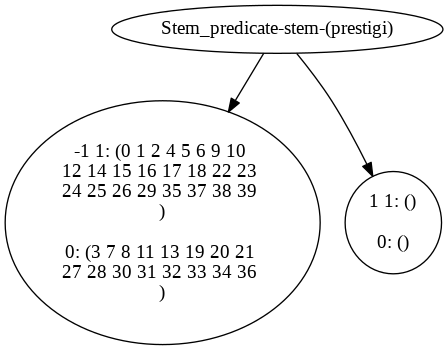



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_75_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(chair)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


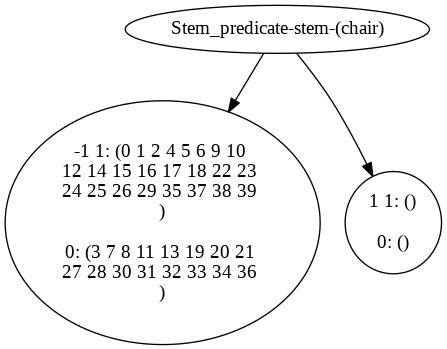



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_76_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(committe)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


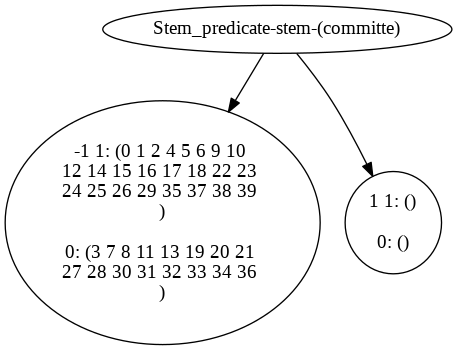



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_77_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(fellowship)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 26 29 35 37 38 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: (25 )

0: ()
"]
//
} } 


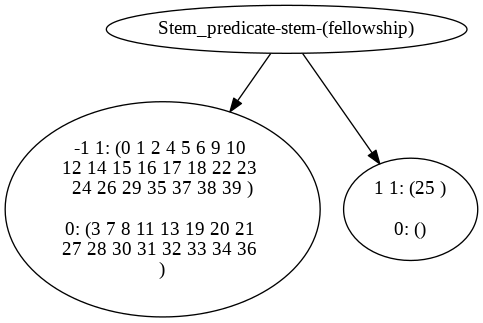



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_78_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(sound,design)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


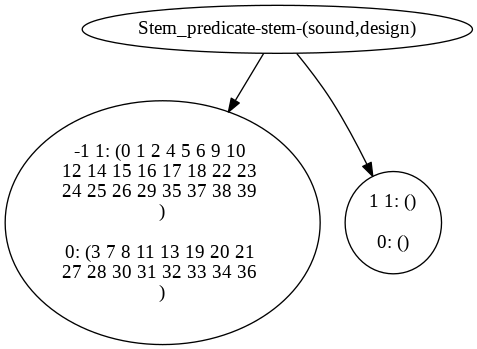



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_79_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(award)"]
1->2
1->4
2 [label="-1 1: (0 1 2 4 6 9 10 12 
14 15 16 17 22 23 24 25 
26 29 35 37 38 39 )

0: (3 8 11 13 19 20 21 27 
28 30 31 32 33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(health)"]
4->5
4->6
5 [color=blue, label="0 0: (7 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (5 18 )
"]
//
} } 


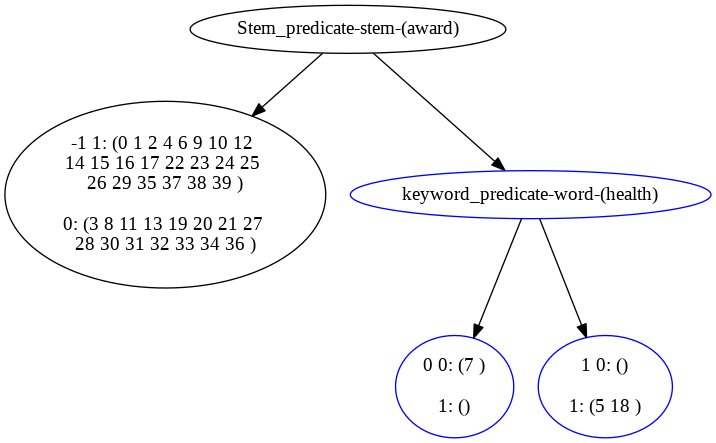



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_80_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(gmo,label)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


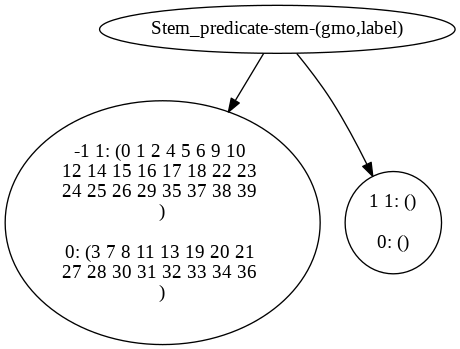



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_81_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(advertis)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


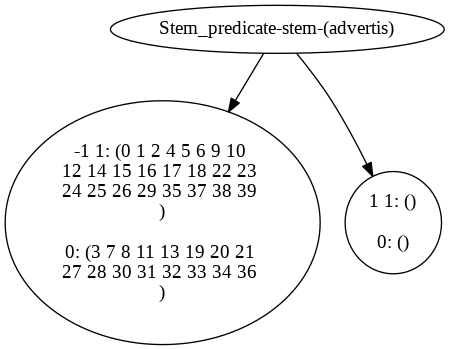



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_82_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(attitud)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


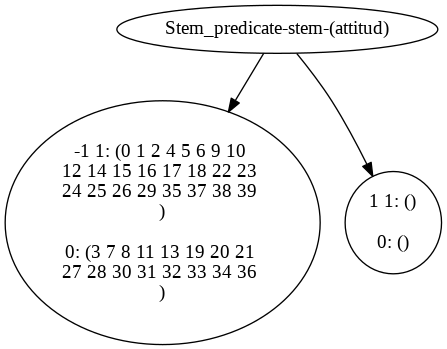



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_83_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(consum,behavior)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 24 
25 26 29 35 37 38 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: (23 )

0: ()
"]
//
} } 


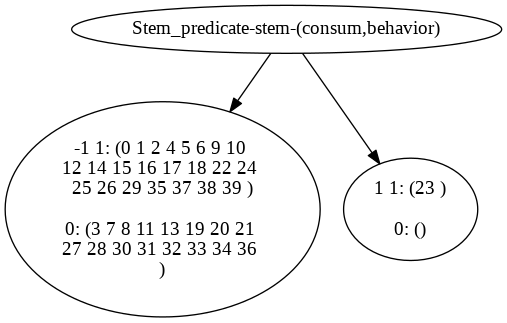



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_84_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(violenc)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


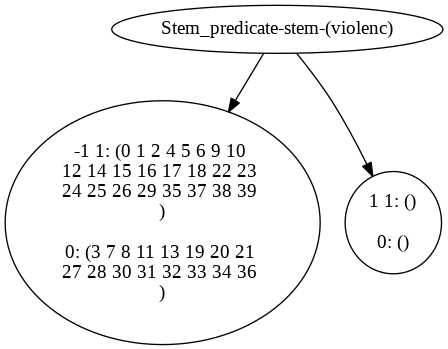



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_85_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(gender,natur)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


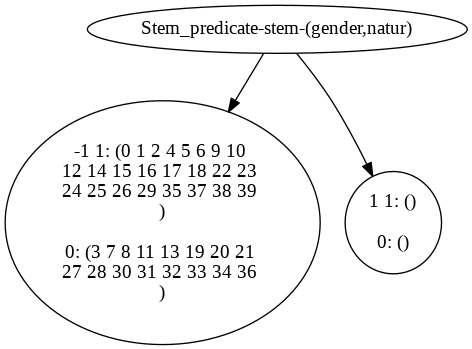



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_86_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(introduct,to,design)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


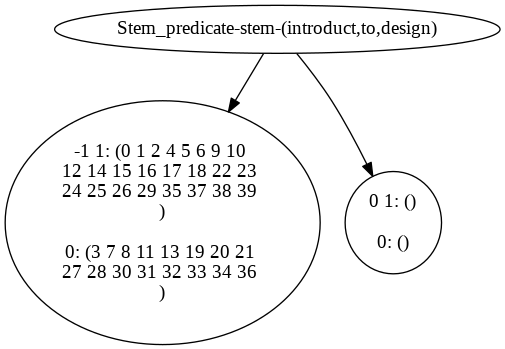



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_87_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(critic)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


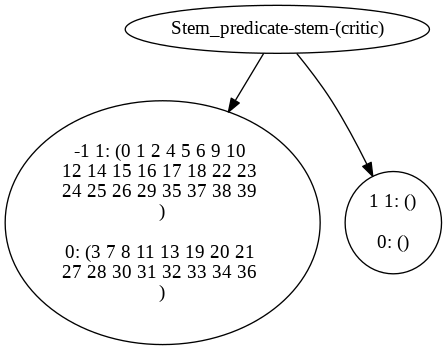



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_88_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(hegemon,system)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


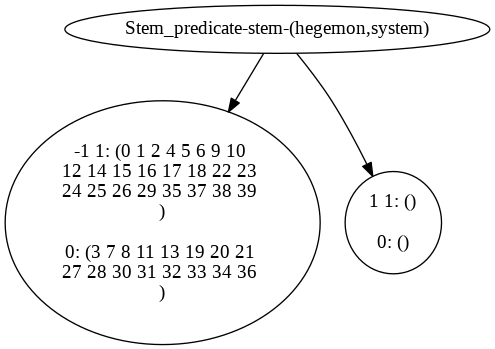



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_89_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(ident)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: (38 )

0: ()
"]
//
} } 


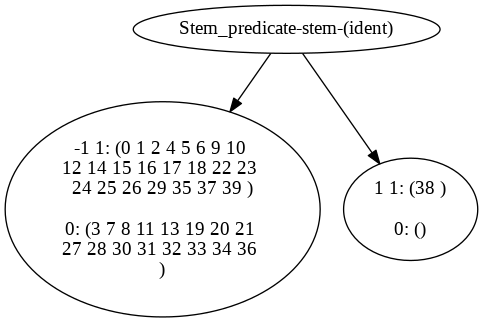



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_90_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(ideolog)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: (38 )

0: ()
"]
//
} } 


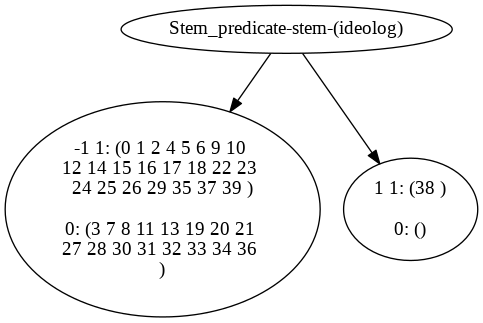



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_91_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(intercultur,commun)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


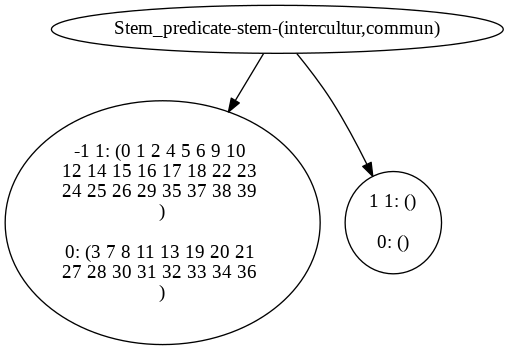



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_92_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(nonprofit,organ)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


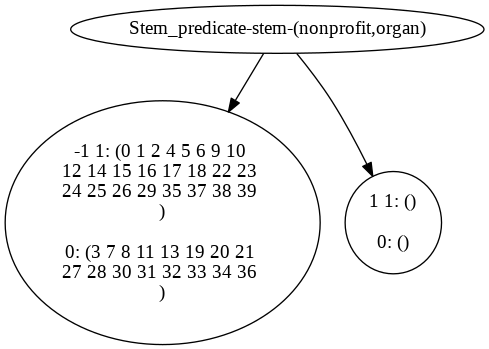



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_93_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(poverti)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


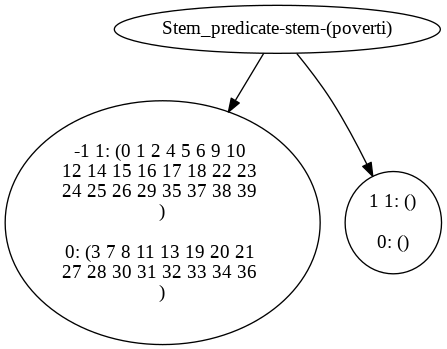



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_94_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(race)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


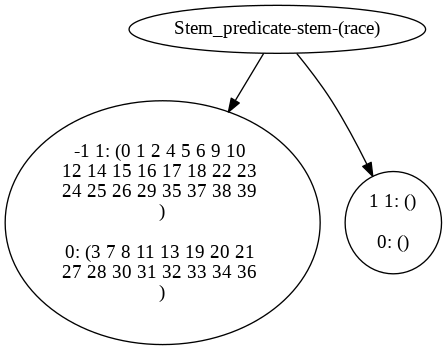



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_95_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(phd)"]
1->2
1->4
2 [label="-1 1: (0 1 4 5 6 9 10 12 
15 16 17 18 22 23 25 26 
29 35 38 39 )

0: (7 8 11 13 19 20 21 27 
28 30 31 32 33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(linguistics)"]
4->5
4->6
5 [color=blue, label="1 0: ()

1: (2 14 24 37 )
"]
6 [color=blue, label="0 0: (3 )

1: ()
"]
//
} } 


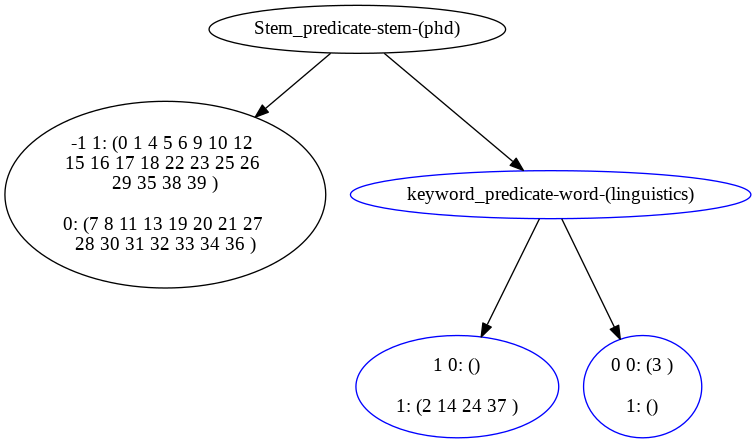



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_96_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(bioinformat)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


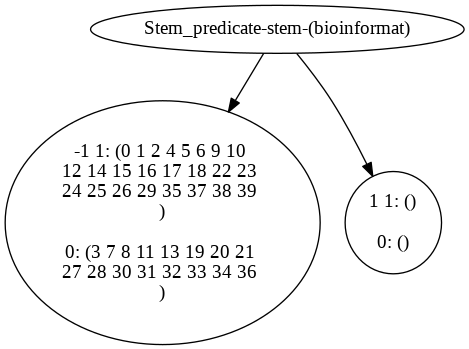



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_97_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(data,analysi)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


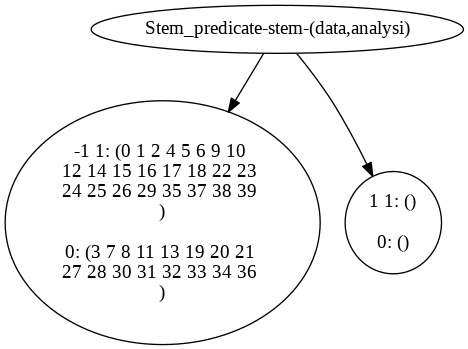



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_98_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(craftsmanship)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


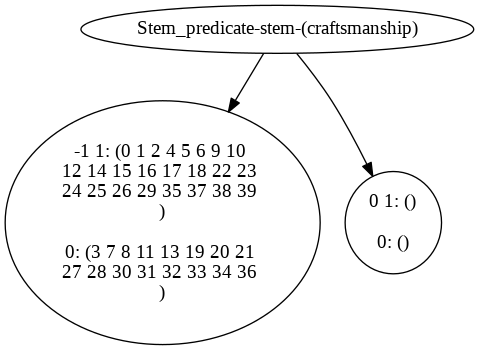



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_99_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(appoint)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


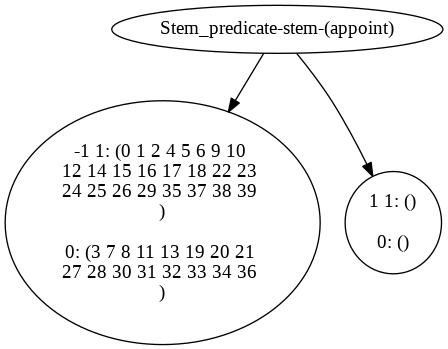



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_100_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(demographi)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


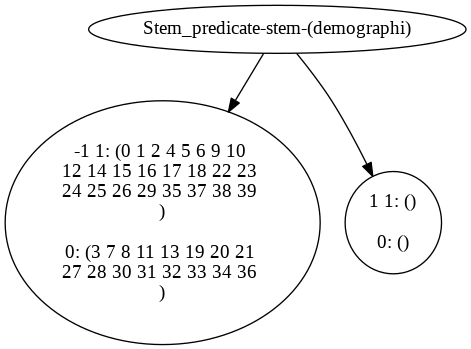



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_101_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(post,doctor)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


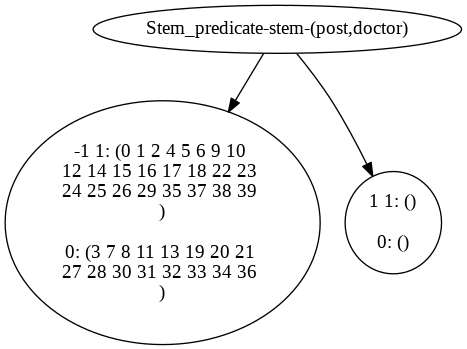



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_102_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:1
1 [label="Stem_predicate-stem-(princeton,univers)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 8 11 13 19 20 21 27 
28 30 31 32 33 34 36 )
"]
3 [color=yellow, label="0 1: ()

0: (7 )
"]
//
} } 


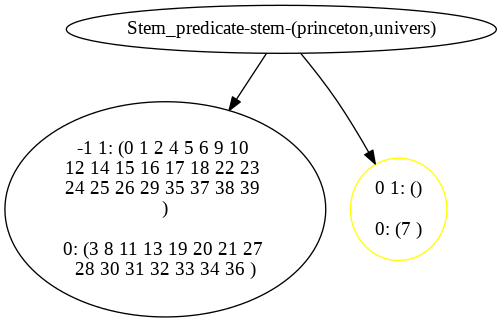



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_103_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(intervent)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


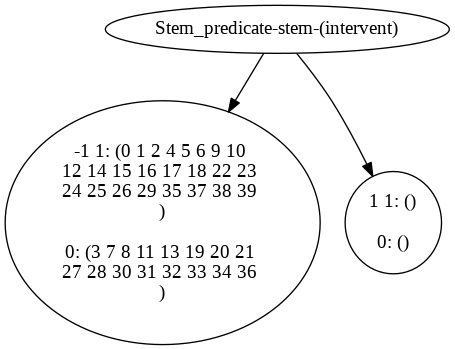



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_104_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(polici,advisor)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


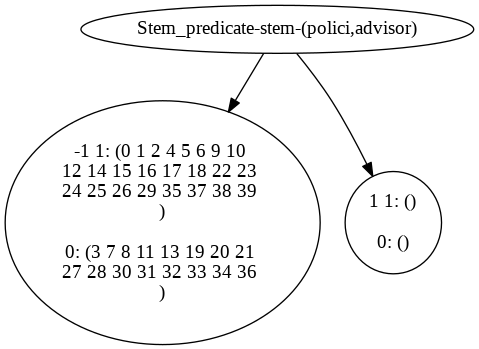



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_105_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(director)"]
1->2
1->3
2 [label="-1 1: (0 2 4 5 10 12 14 15 
16 17 18 22 23 24 25 26 
29 35 37 38 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: (1 6 9 )

0: ()
"]
//
} } 


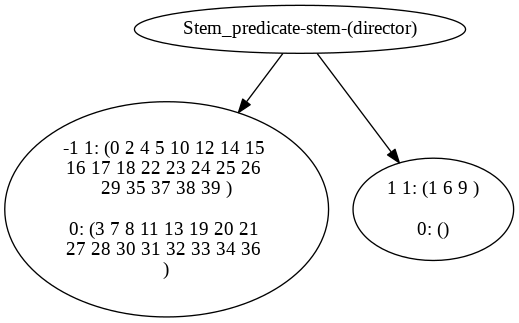



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_106_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(scottish,ident)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


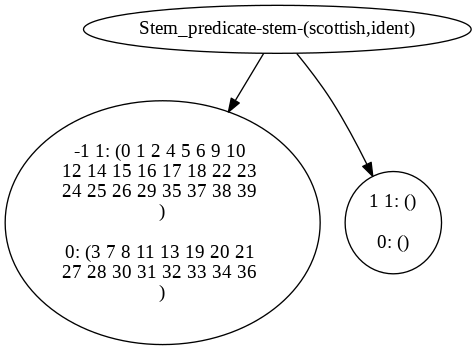



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_107_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(faculti)"]
1->2
1->4
2 [label="-1 1: (0 1 2 4 5 6 10 12 
14 15 16 17 18 22 23 24 
25 26 29 35 37 38 39 )

0: (7 8 13 19 20 21 27 28 
30 31 32 33 34 36 )
"]
4 [color=blue, label="keyword_predicate-word-(graduated)"]
4->5
4->6
5 [color=blue, label="0 0: (3 11 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (9 )
"]
//
} } 


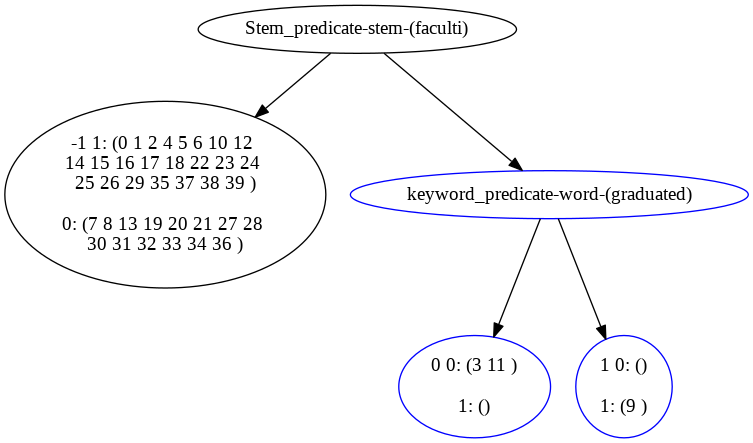



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_108_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:1
1 [label="Stem_predicate-stem-(academ)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 29 35 37 38 39 
)

0: (7 8 11 13 19 20 21 27 
28 30 31 32 33 34 36 )
"]
3 [color=yellow, label="0 1: ()

0: (3 )
"]
//
} } 


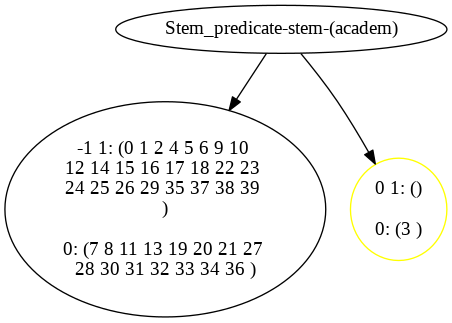



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201122700/20240201122700_tree_information_gain_109_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(treatment)"]
1->2
1->3
2 [label="-1 1: (0 1 2 4 5 6 9 10 
12 14 15 16 17 18 22 23 
24 25 26 35 37 38 39 )

0: (3 7 8 11 13 19 20 21 
27 28 30 31 32 33 34 36 
)
"]
3 [label="1 1: (29 )

0: ()
"]
//
} } 


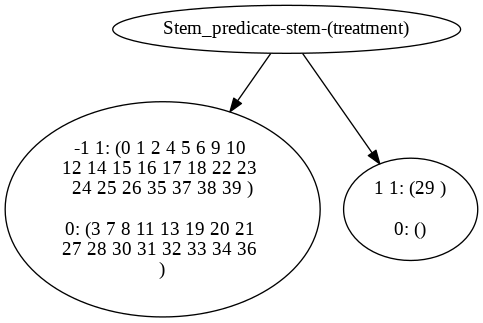

In [87]:
df_user_input = show_trees(dir4+'_20240201122700/')

In [139]:
correct_repairs_pa = show_effective_tree_repairs(dir4+'_20240201114658/',
                                         rules_dict)

['old_text', 'expected_label', 'fold', 'cid', 'stems', 'text', 'model_pred', 'vectors', 'id']


In [140]:
correct_repairs_pa

{707: [1, 3, 15, 28, 41, 56, 59],
 834: [1, 3, 4, 5, 15, 26, 28, 46],
 2433: [9],
 3692: [27],
 4659: [46],
 5473: [3, 4, 20],
 7333: [50],
 8249: [119],
 8374: [14],
 8461: [50],
 8974: [50, 83],
 9019: [50],
 9382: [83],
 9566: [14],
 9615: [100],
 10108: [50],
 10206: [14],
 10744: [50],
 11329: [50]}

In [137]:
df_user_input_pa = show_user_inputs(dir4+'_20240201114658/')

['old_text', 'expected_label', 'fold', 'cid', 'stems', 'text', 'model_pred', 'vectors', 'id']


In [144]:
df_user_input_pa[df_user_input_pa['cid']==834][['expected_label','model_pred','text', 'id']]


,expected_label,model_pred,text,id
8,1,0,is based in ahmedabad and is currently teaching in cept university in the faculty of planning and urban design work is particularly driven towards raising awareness on environmental issues and importance of biodiversity in cities and disseminates it through initiatives such as ahmedabad mapping project city water walks pocket garden and through the art works is inspired by the works of traditional gond and madhubani artists and has been fervently painting to adapt the technique and create contemporary works co project feral city was a part of the exhibition tales and fables from india and japan and was recently displayed in nid ahmedabad japan foundation new delhi and in yokohama civic art gallery in japan,8


In [149]:
df_user_input_pa[df_user_input_pa['id'].isin([76,17])][['expected_label','model_pred','text', 'id']]


,expected_label,model_pred,text,id
76,1,1,is certified as oracle certified professional ocp and is awarded as oracle ace in and oracle ace director in for continuous contributions to the oracle users community,76
17,0,1,as part of art residency in the printing museum in tartu will hold a public workshop on the less well known technique of linoleum etching on august th starting at the workshop is suitable for professionals as well as beginners as the number of participants is limited please register at lemmit trykimuuseum ee participation fee includes materials and can be paid in cash on sunday,17


In [141]:
for pi in [100]:
    print(rules_dict['painter'][pi])

pred:Stem_predicate-stem-(profession), id:1
parent_id: NaN


	label:-1, id: 2
parent_id: 1
1:[]
0:[]


	label:1, id: 3
parent_id: 1
1:[]
0:[]




In [143]:
# certified
for rr,vv in enumerate(rules_dict['painter']):
    if('inspir' in vv.root.pred.stems):
        print(rr)

15


../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/
120
../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_0_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(chicago)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 49 53 59 62 63 65 66 
71 72 73 )
"]
3 [label="0 1: ()

0: (48 50 57 74 )
"]
//
} } 


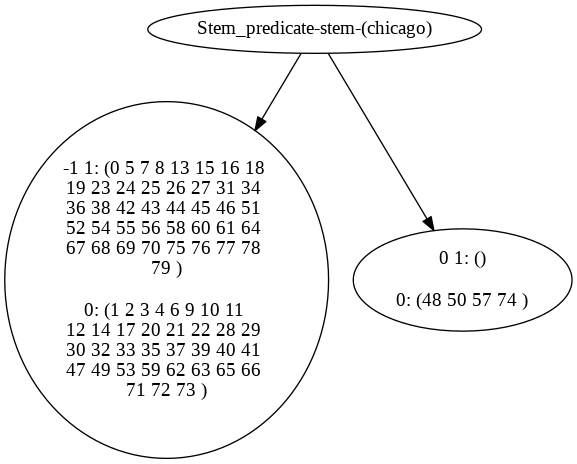



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_1_dot_file
digraph "rule" { 
// presize: 3, after_size: 15, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(art)"]
1->2
1->4
2 [label="-1 1: (0 5 7 15 16 18 25 26 
27 31 38 42 43 44 45 46 
51 54 56 58 60 61 64 67 
68 69 70 75 76 78 79 )

0: (2 3 9 12 14 21 30 33 
35 39 41 47 53 65 71 73 
74 )
"]
4 [color=blue, label="keyword_predicate-word-(since)"]
4->7
4->6
7 [color=blue, label="keyword_predicate-word-(faculty)"]
7->10
7->9
6 [color=blue, label="1 0: ()

1: (34 52 55 )
"]
10 [color=blue, label="keyword_predicate-word-(director)"]
10->13
10->12
9 [color=blue, label="1 0: ()

1: (8 36 )
"]
13 [color=blue, label="keyword_predicate-word-(fused)"]
13->16
13->15
12 [color=blue, label="1 0: ()

1: (23 77 )
"]
16 [color=blue, label="keyword_predicate-word-(best)"]
16->19
16->18
15 [color=blue, label="1 0: ()

1: (13 )
"]
19 [color=blue, label="keyword_predicate

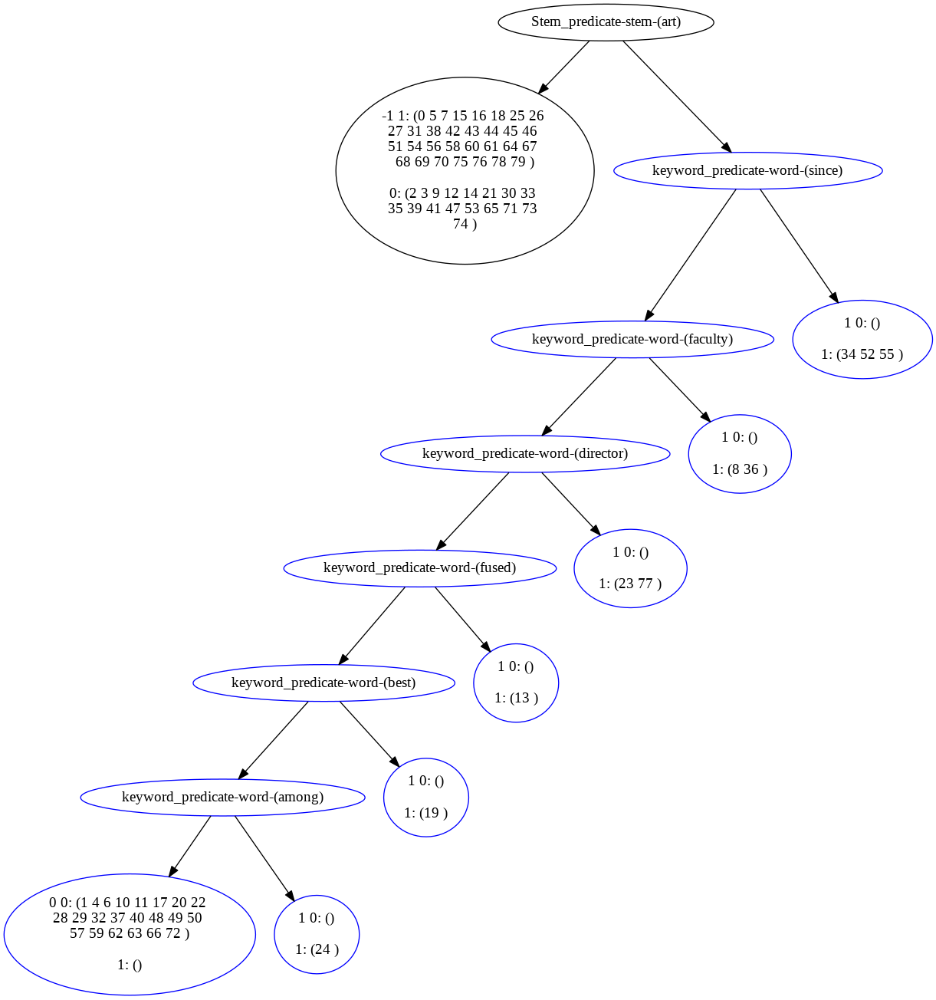



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_2_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(draw)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 50 53 57 59 62 63 
65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: (49 )
"]
//
} } 


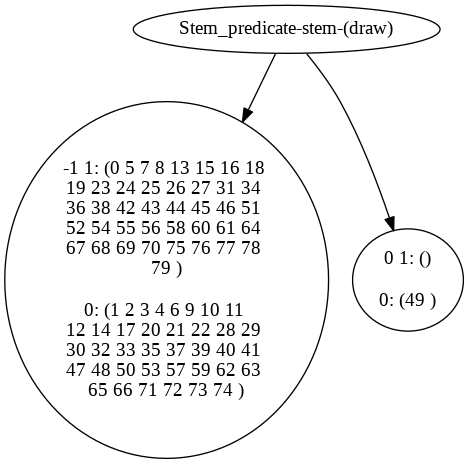



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_3_dot_file
digraph "rule" { 
// presize: 3, after_size: 7, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(exhibit)"]
1->2
1->4
2 [label="-1 1: (0 5 7 13 15 16 18 19 
23 24 26 27 31 34 38 42 
43 44 45 46 51 52 54 55 
56 58 60 61 64 67 68 69 
70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 37 39 40 41 47 
49 50 53 63 65 66 71 72 
73 )
"]
4 [color=blue, label="keyword_predicate-word-(faculty)"]
4->5
4->7
5 [color=blue, label="0 0: (35 48 57 59 62 )

1: ()
"]
7 [color=blue, label="keyword_predicate-word-(studio)"]
7->8
7->9
8 [color=blue, label="1 0: ()

1: (8 25 36 )
"]
9 [color=blue, label="0 0: (74 )

1: ()
"]
//
} } 


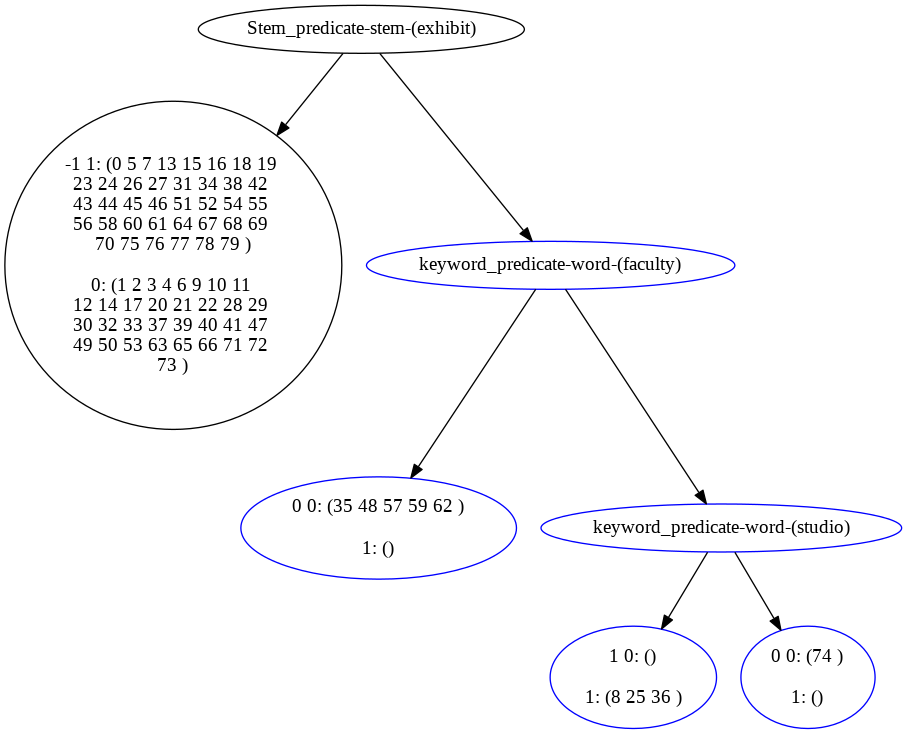



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_4_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(paint)"]
1->2
1->4
2 [label="-1 1: (0 5 7 13 15 16 18 19 
23 24 26 27 31 34 36 38 
42 43 44 45 46 51 52 54 
55 56 58 60 61 64 67 68 
69 70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 12 
17 20 21 22 28 29 30 32 
37 39 41 48 49 50 57 62 
63 72 )
"]
4 [color=blue, label="keyword_predicate-word-(based)"]
4->5
4->6
5 [color=blue, label="0 0: (11 14 33 35 40 47 53 59 
65 66 71 73 74 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (8 25 )
"]
//
} } 


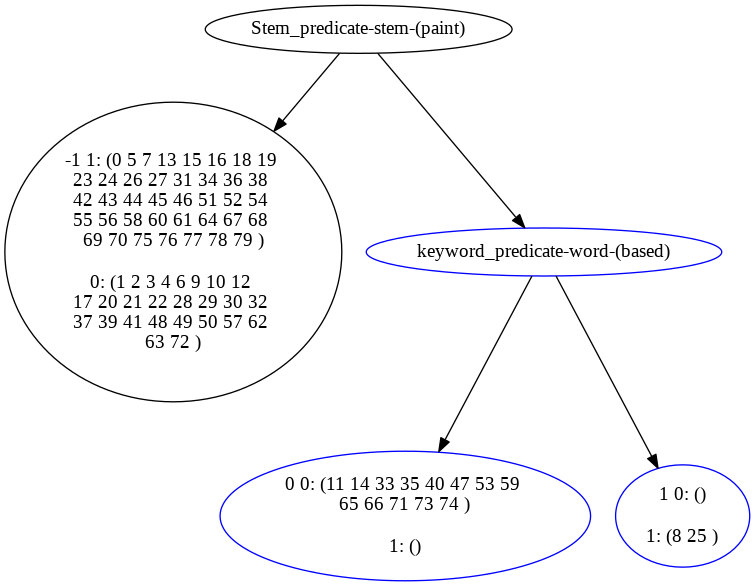



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_5_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(galleri)"]
1->2
1->4
2 [label="-1 1: (0 5 7 13 15 16 18 19 
23 25 26 27 31 34 36 38 
42 43 44 45 46 51 52 54 
55 56 58 60 61 64 67 68 
69 70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 49 50 53 57 62 63 65 
71 72 73 )
"]
4 [color=blue, label="keyword_predicate-word-(garden)"]
4->5
4->6
5 [color=blue, label="0 0: (48 59 66 74 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (8 24 )
"]
//
} } 


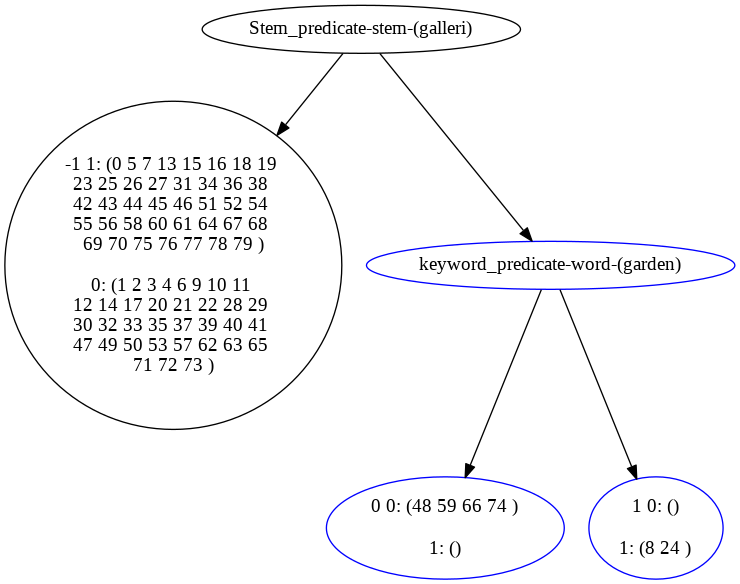



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_6_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(abstract,expression)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


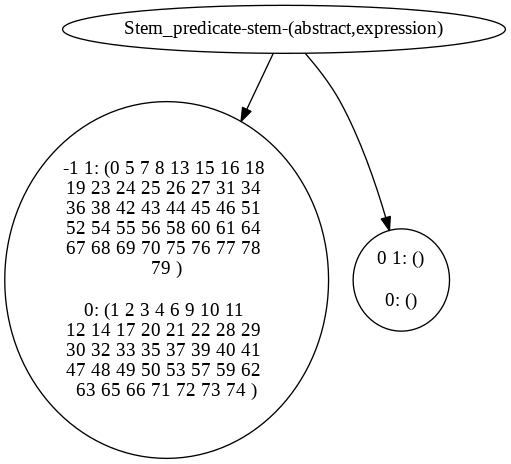



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_7_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(colour,field)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


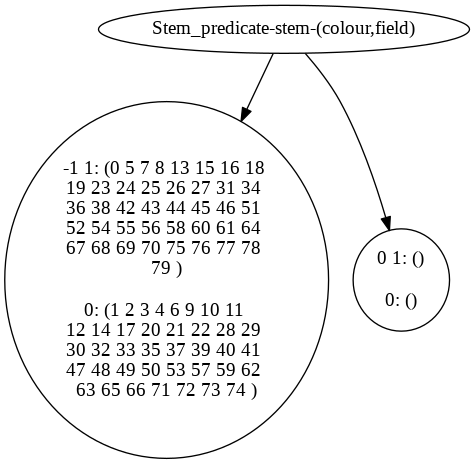



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_8_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(surreal)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


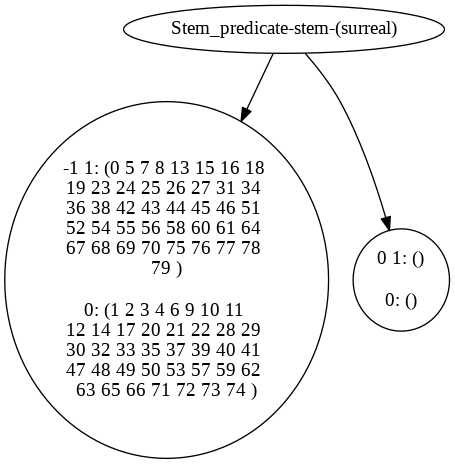



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_9_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(explor)"]
1->2
1->4
2 [label="-1 1: (0 5 8 13 15 16 18 19 
23 24 25 26 27 31 34 36 
38 42 43 44 45 46 51 52 
54 55 56 58 60 61 64 67 
68 70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 17 20 21 22 28 29 30 
32 33 35 37 39 40 41 47 
49 50 53 57 59 63 66 71 
72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(working)"]
4->5
4->6
5 [color=blue, label="0 0: (14 48 62 65 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (7 69 )
"]
//
} } 


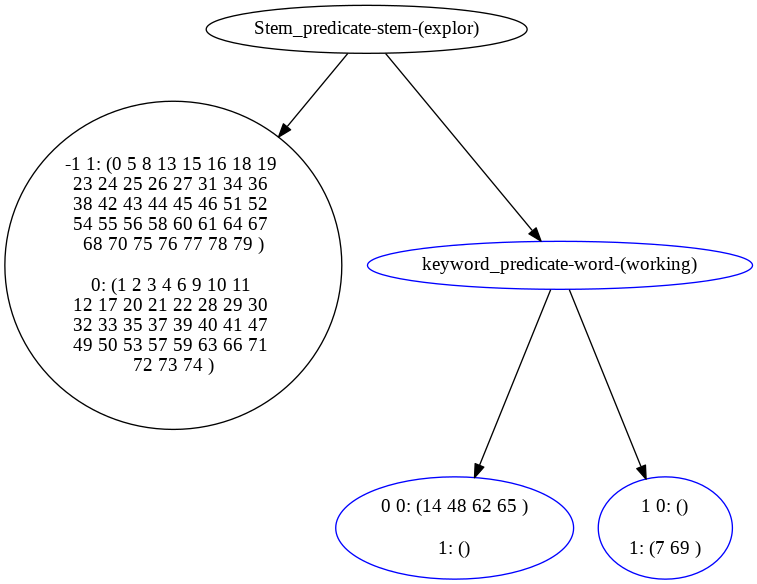



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_10_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(dichotomi)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


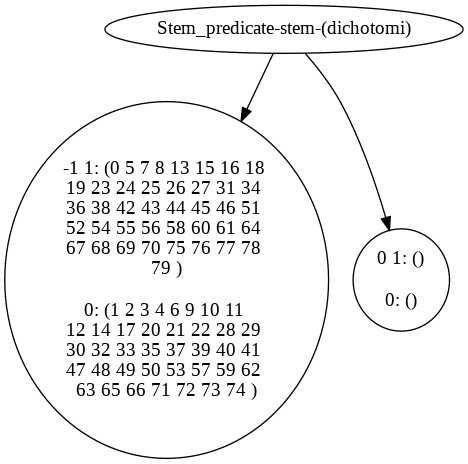



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_11_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(humor)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


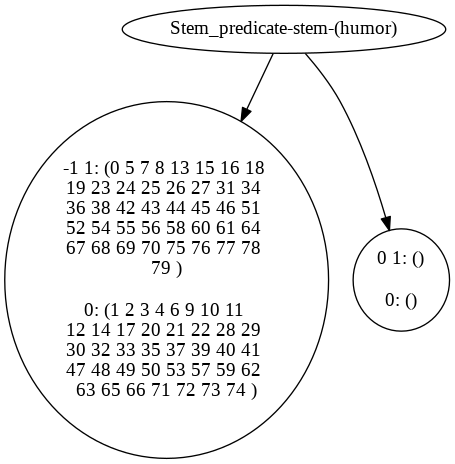



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_12_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(person,studi)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


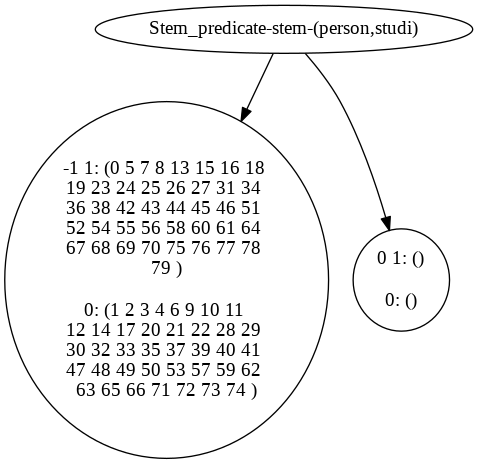



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_13_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(architect)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
54 58 60 61 64 67 68 69 
70 75 76 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (52 55 56 77 78 )

0: ()
"]
//
} } 


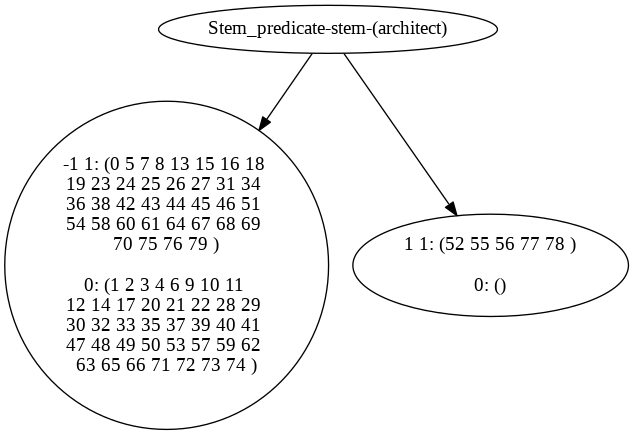



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_14_dot_file
digraph "rule" { 
// presize: 3, after_size: 9, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(architectur)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 26 27 31 34 38 
42 43 44 45 46 51 56 58 
61 64 67 76 79 )

0: (2 3 6 9 10 11 12 14 
17 20 21 22 28 30 32 33 
37 39 40 41 47 49 50 53 
57 59 62 63 65 66 71 72 
73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(fine)"]
4->7
4->6
7 [color=blue, label="keyword_predicate-word-(recipient)"]
7->10
7->9
6 [color=blue, label="0 0: (4 29 48 )

1: ()
"]
10 [color=blue, label="keyword_predicate-word-(born)"]
10->11
10->12
9 [color=blue, label="0 0: (1 )

1: ()
"]
11 [color=blue, label="1 0: ()

1: (25 36 52 54 55 60 68 69 
70 75 77 78 )
"]
12 [color=blue, label="0 0: (35 )

1: ()
"]
//
} } 


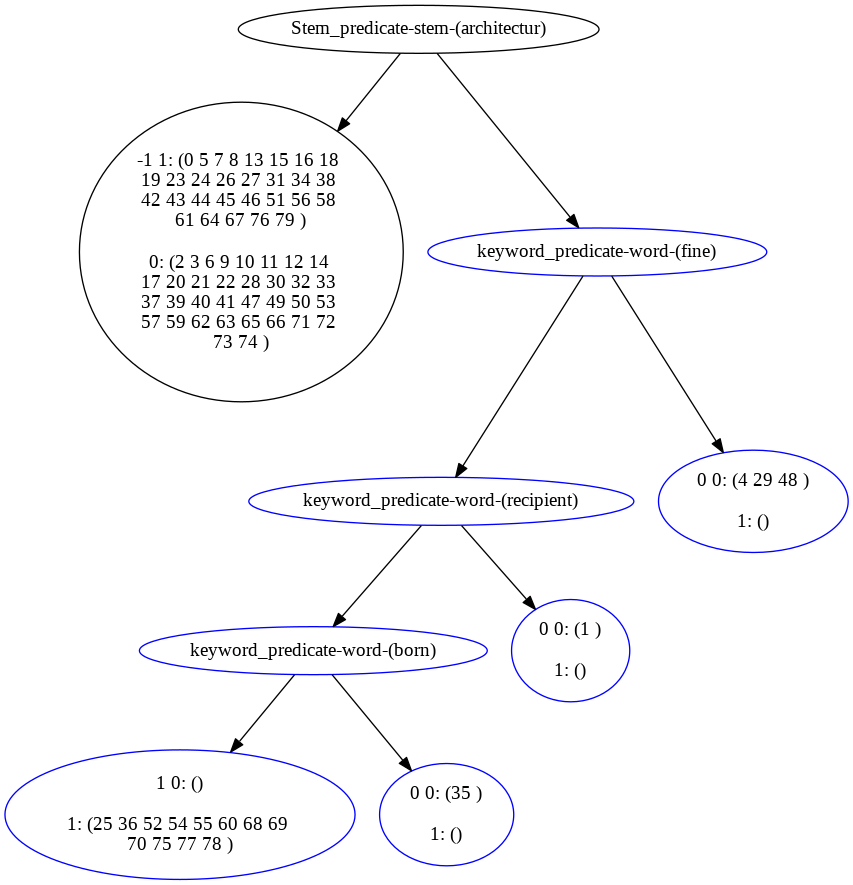



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_15_dot_file
digraph "rule" { 
// presize: 3, after_size: 7, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(inspir)"]
1->2
1->4
2 [label="-1 1: (0 5 7 13 15 16 18 19 
23 24 25 26 27 31 34 42 
43 44 45 46 51 52 54 55 
56 58 60 61 64 67 68 69 
70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
48 50 57 59 62 65 66 71 
72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(inspired)"]
4->5
4->7
5 [color=blue, label="0 0: (47 49 53 )

1: ()
"]
7 [color=blue, label="keyword_predicate-word-(limited)"]
7->8
7->9
8 [color=blue, label="1 0: ()

1: (8 36 38 )
"]
9 [color=blue, label="0 0: (63 )

1: ()
"]
//
} } 


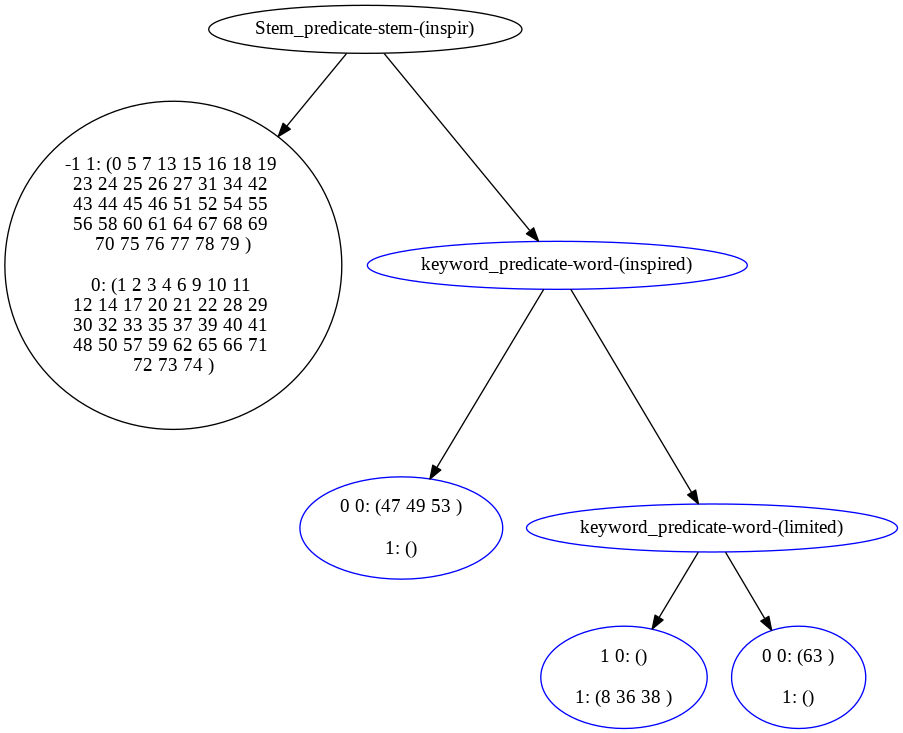



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_16_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(memori)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 31 34 36 
38 42 43 44 45 46 51 52 
54 55 56 58 60 61 64 67 
68 69 70 75 76 78 79 )

0: (1 2 3 4 6 9 10 11 
12 17 20 21 22 28 29 30 
32 33 35 37 39 41 47 48 
49 50 53 57 59 62 63 65 
66 71 72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(personal)"]
4->5
4->6
5 [color=blue, label="1 0: ()

1: (27 77 )
"]
6 [color=blue, label="0 0: (14 40 )

1: ()
"]
//
} } 


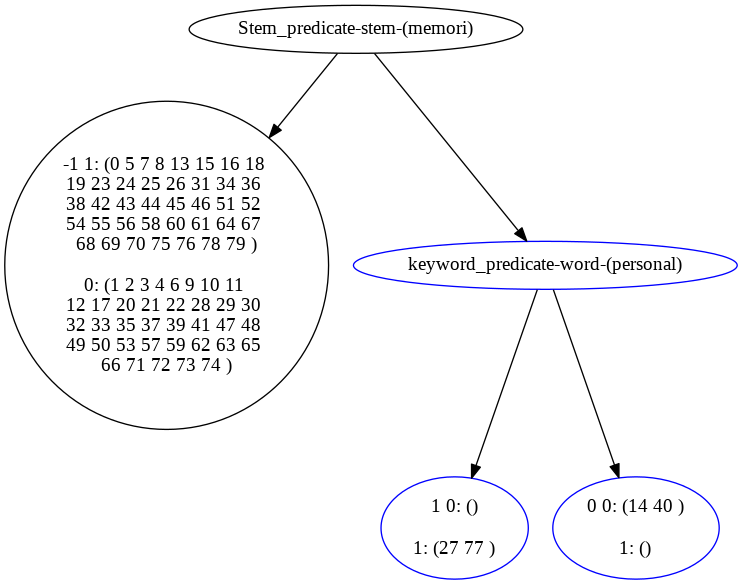



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_17_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(observ)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


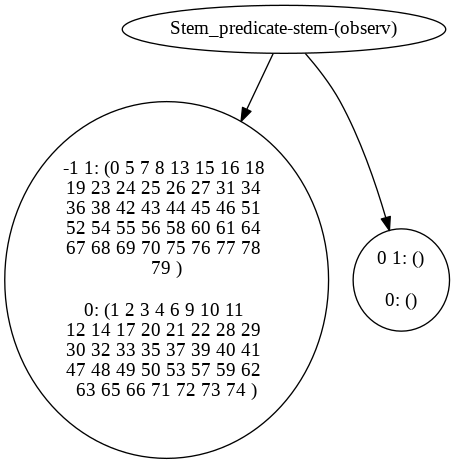



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_18_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(art,institut)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 78 79 
)

0: (2 3 4 6 9 10 11 12 
14 17 20 21 22 28 29 30 
32 33 35 37 39 40 41 47 
49 50 53 59 62 63 65 66 
71 72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(company)"]
4->5
4->6
5 [color=blue, label="0 0: (1 48 57 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (77 )
"]
//
} } 


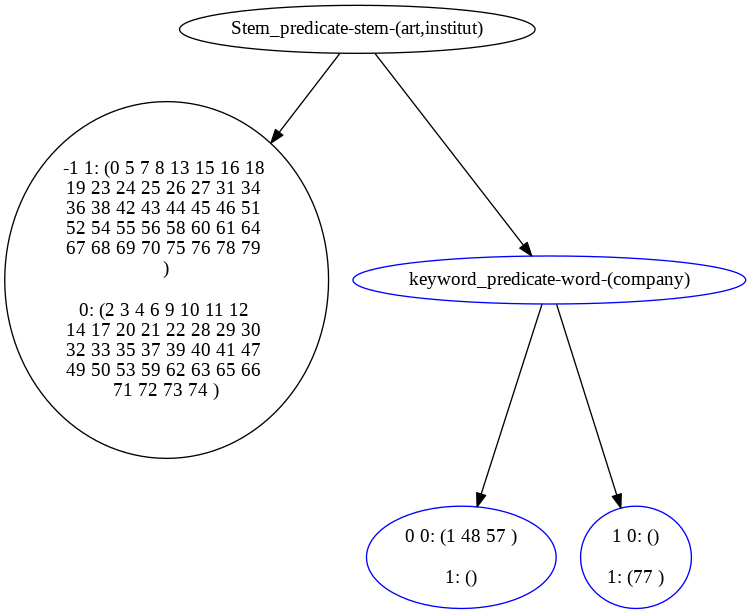



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_19_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(show)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 49 50 53 57 62 63 65 
66 72 73 )
"]
3 [label="0 1: ()

0: (48 59 71 74 )
"]
//
} } 


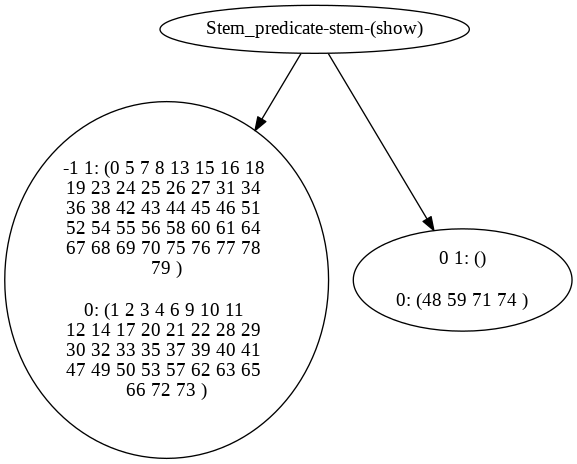



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_20_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(solo)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 26 27 31 34 36 
38 42 43 44 45 46 51 52 
54 55 56 58 60 61 64 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 49 50 53 62 63 65 66 
71 72 73 )
"]
4 [color=blue, label="keyword_predicate-word-(involved)"]
4->5
4->6
5 [color=blue, label="0 0: (48 57 59 74 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (25 )
"]
//
} } 


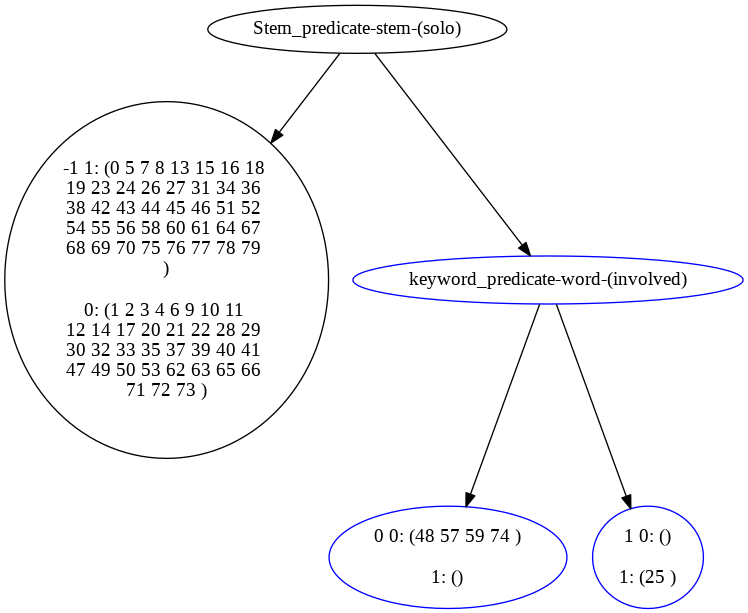



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_21_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(fauvism)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


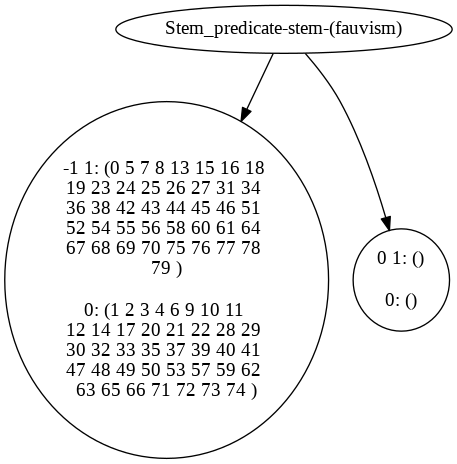



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_22_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(impression)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


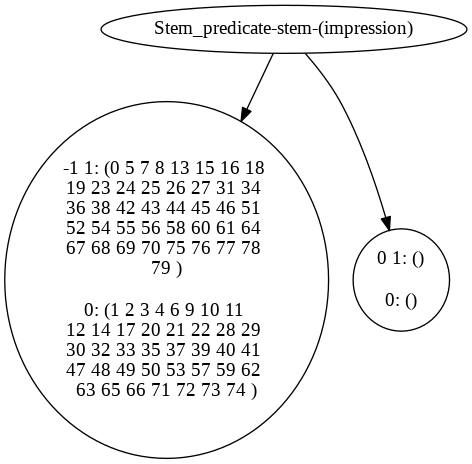



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_23_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(influenc)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 12 14 
17 20 21 22 28 29 30 32 
33 35 37 39 40 41 47 48 
49 50 53 57 59 62 63 65 
66 71 72 73 74 )
"]
3 [label="0 1: ()

0: (10 11 )
"]
//
} } 


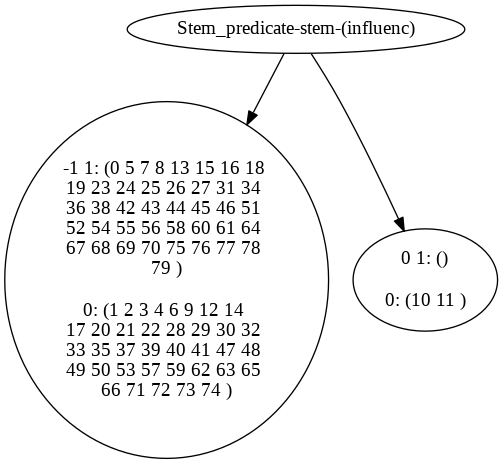



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_24_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(landscap)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 27 31 34 36 
38 42 43 44 45 46 51 52 
54 55 56 58 60 61 64 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 30 
32 33 35 37 39 41 48 49 
50 53 57 62 63 65 66 72 
73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(approach)"]
4->5
4->6
5 [color=blue, label="0 0: (29 40 47 59 71 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (26 )
"]
//
} } 


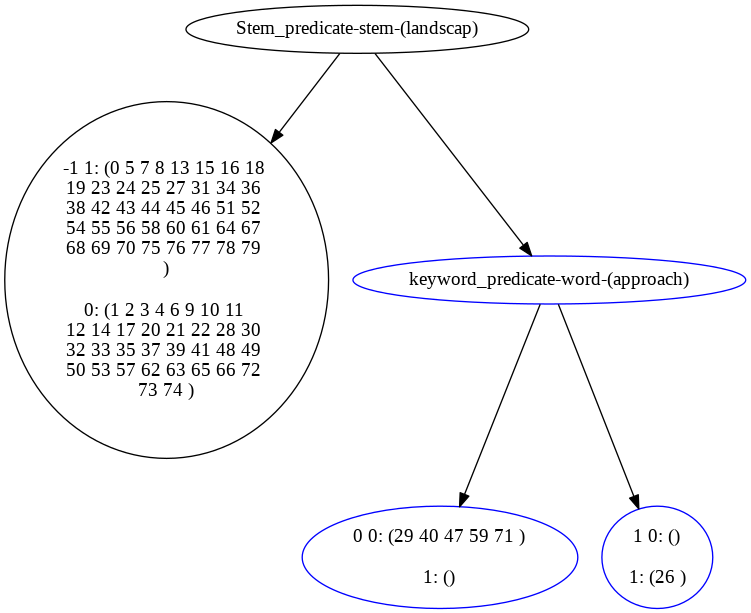



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_25_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(oil)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 41 47 
48 49 50 53 57 59 62 63 
65 66 71 72 74 )
"]
3 [label="0 1: ()

0: (40 73 )
"]
//
} } 


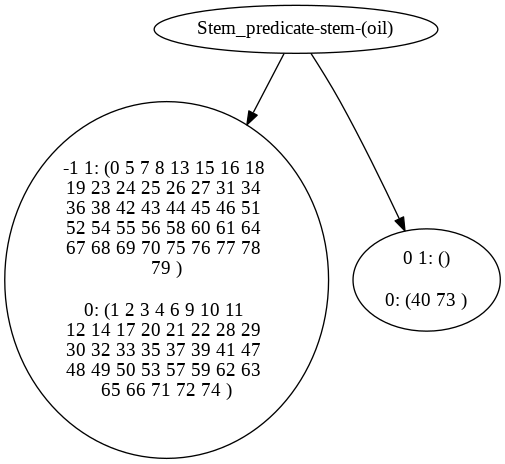



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_26_dot_file
digraph "rule" { 
// presize: 3, after_size: 7, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(tradit)"]
1->2
1->4
2 [label="-1 1: (0 5 7 13 15 19 23 24 
25 26 27 31 34 36 38 42 
43 44 45 46 51 52 54 55 
56 58 60 61 64 67 68 69 
70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 29 30 
32 33 35 37 39 40 41 47 
48 50 53 57 59 62 63 65 
66 71 72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(work)"]
4->5
4->7
5 [color=blue, label="1 0: ()

1: (16 18 )
"]
7 [color=blue, label="keyword_predicate-word-(based)"]
7->8
7->9
8 [color=blue, label="0 0: (28 49 )

1: ()
"]
9 [color=blue, label="1 0: ()

1: (8 )
"]
//
} } 


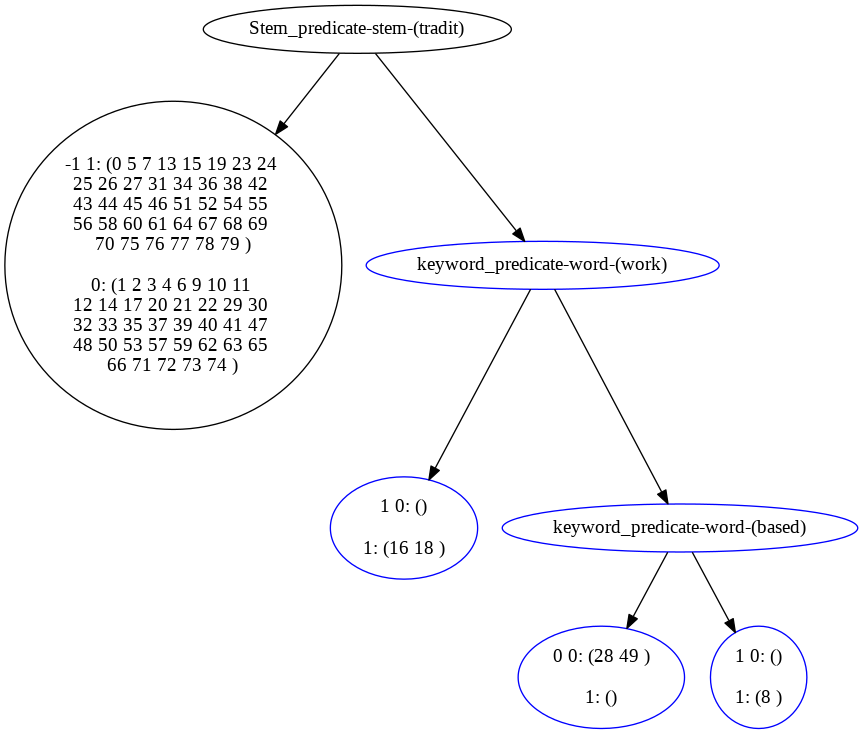



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_27_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(appreci)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 34 36 
38 42 43 44 45 46 51 52 
54 55 56 58 60 61 64 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
65 66 71 72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(face)"]
4->5
4->6
5 [color=blue, label="0 0: (63 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (31 )
"]
//
} } 


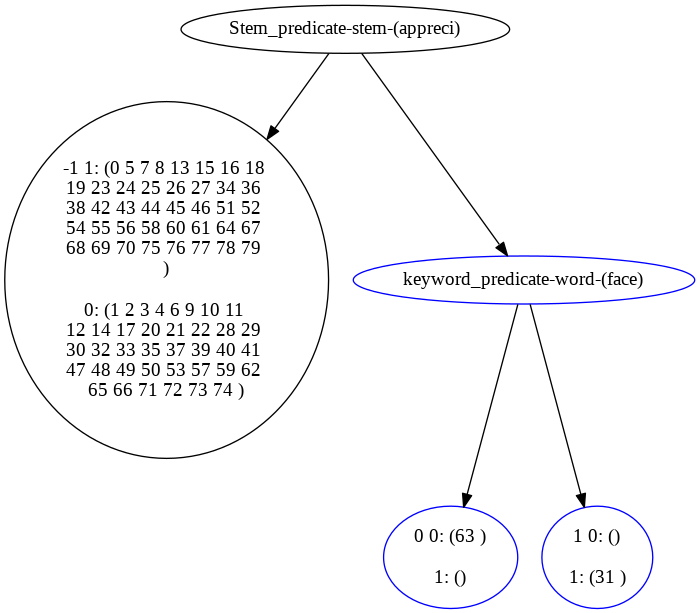



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_28_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(art,exhibit)"]
1->2
1->4
2 [label="-1 1: (0 5 7 13 15 16 18 19 
23 24 25 26 27 31 34 38 
42 43 44 45 46 51 52 54 
55 56 58 60 61 64 67 68 
69 70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 49 50 53 63 65 66 71 
72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(currently)"]
4->5
4->6
5 [color=blue, label="0 0: (48 57 59 62 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (8 36 )
"]
//
} } 


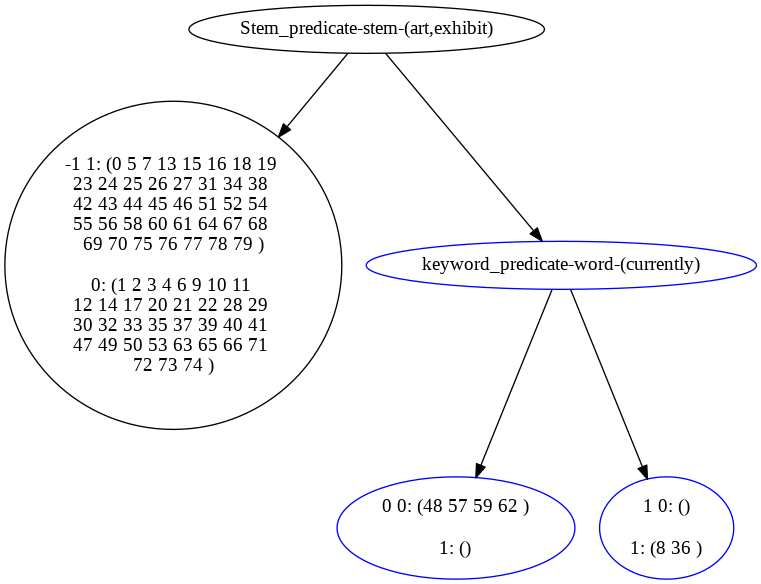



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_29_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(oil,paint)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 41 47 
48 49 50 53 57 59 62 63 
65 66 71 72 74 )
"]
3 [label="0 1: ()

0: (40 73 )
"]
//
} } 


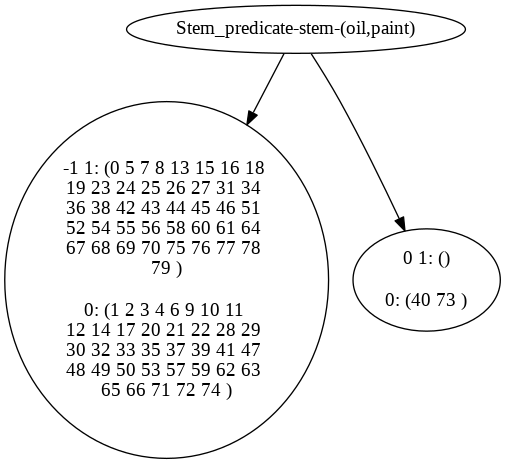



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_30_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(sculpt)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


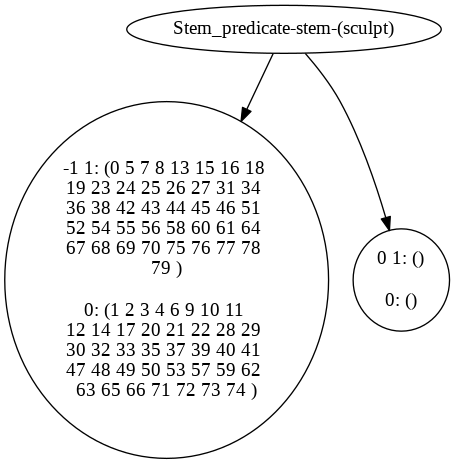



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_31_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(portraitur)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: (65 )
"]
//
} } 


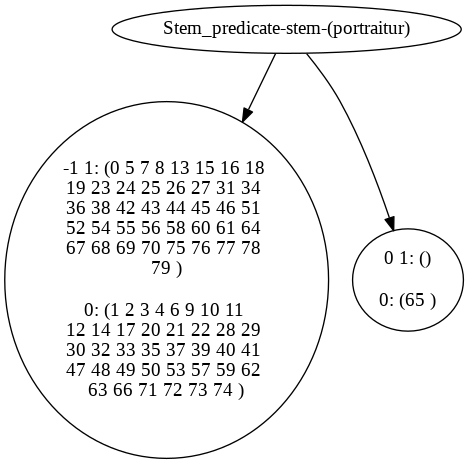



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_32_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:1
1 [label="Stem_predicate-stem-(privat,collect)"]
1->2
1->3
2 [label="-1 1: (0 7 8 13 15 16 18 19 
23 24 25 26 27 31 34 36 
38 42 43 44 45 46 51 52 
54 55 56 58 60 61 64 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [color=yellow, label="1 1: (5 )

0: ()
"]
//
} } 


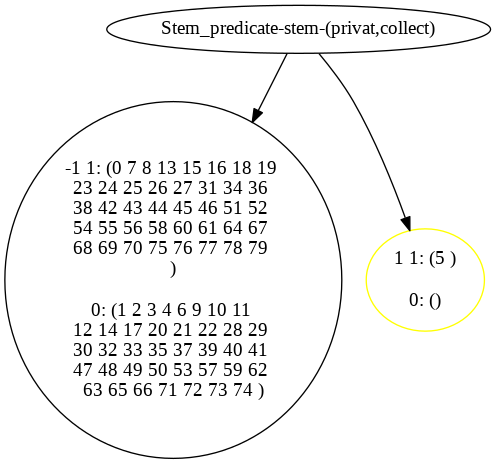



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_33_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(artist,resid)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


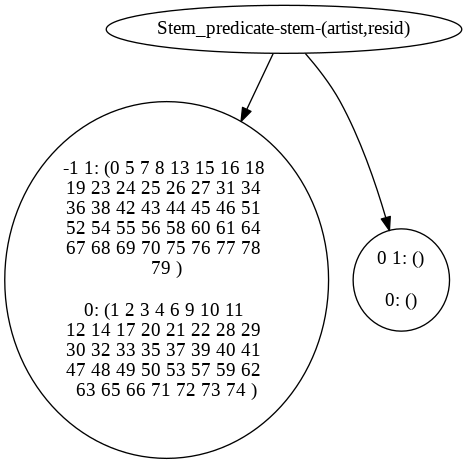



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_34_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(acryl,paint)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 74 )
"]
3 [label="0 1: ()

0: (73 )
"]
//
} } 


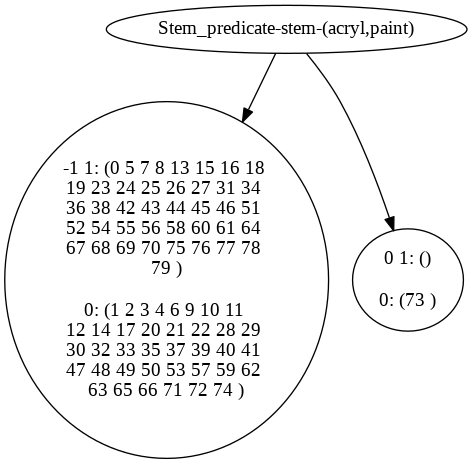



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_35_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(canva)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 57 59 62 63 
65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: (53 )
"]
//
} } 


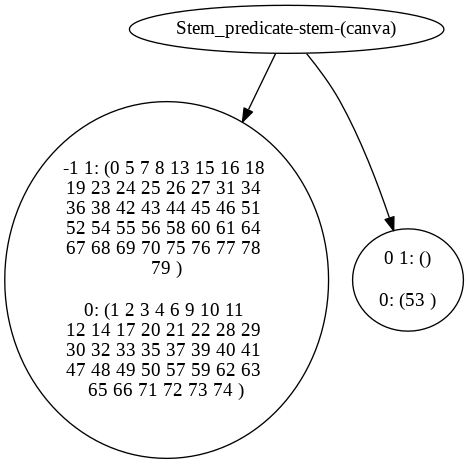



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_36_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(group,show)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 62 63 
65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: (59 )
"]
//
} } 


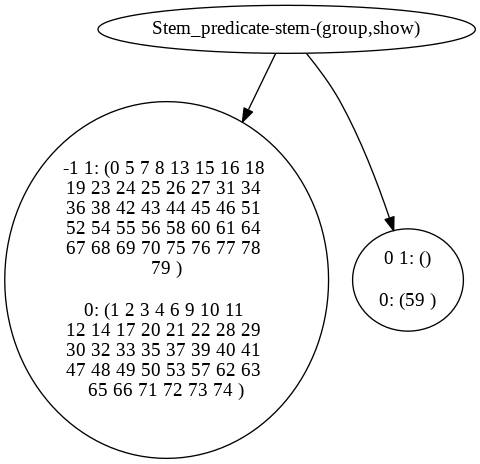



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_37_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(solo,show)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 49 50 53 57 62 63 65 
66 71 72 73 )
"]
3 [label="0 1: ()

0: (48 59 74 )
"]
//
} } 


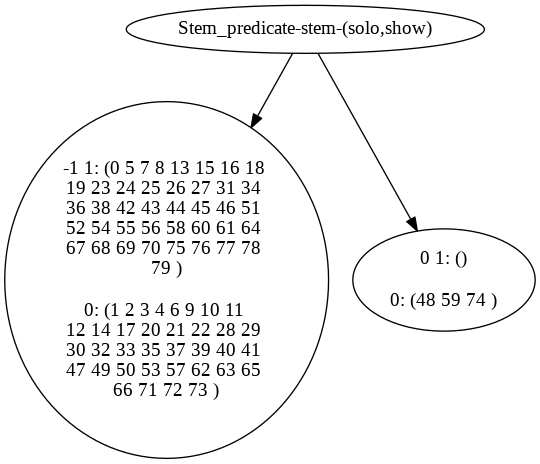



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_38_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(art,histori)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


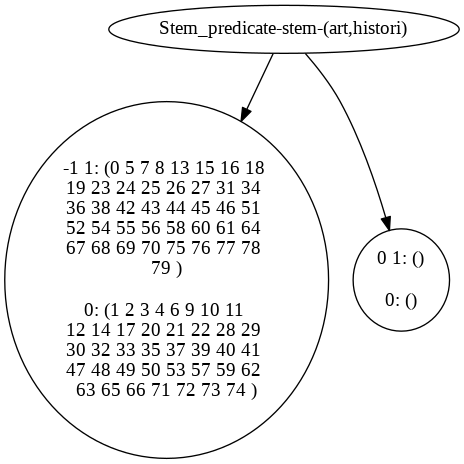



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_39_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(gay,cultur)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


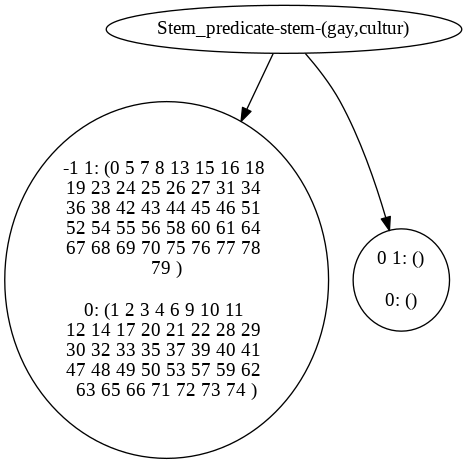



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_40_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(painterli)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


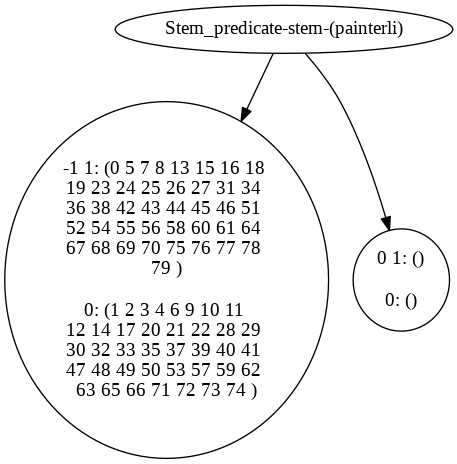



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_41_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:1
1 [label="Stem_predicate-stem-(geometr)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
38 42 43 44 45 46 51 52 
54 55 56 58 60 61 64 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [color=yellow, label="1 1: (36 )

0: ()
"]
//
} } 


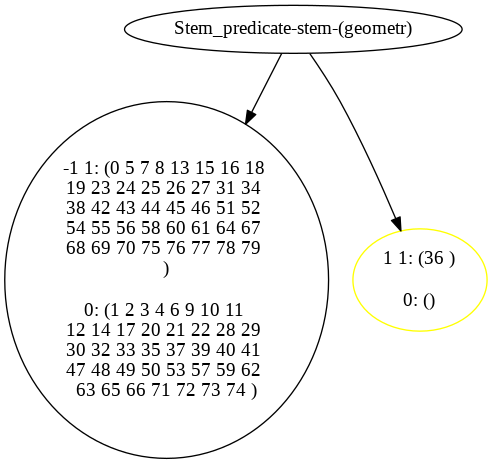



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_42_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(spontan)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


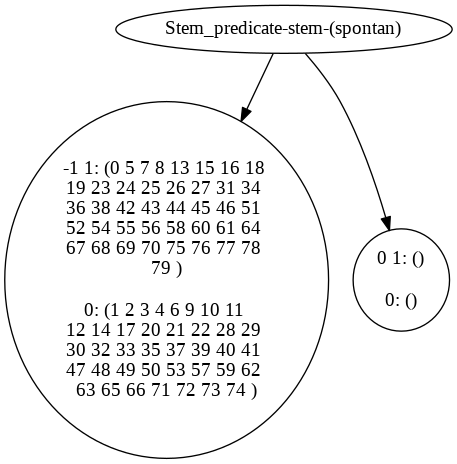



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_43_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(color)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 30 
32 33 35 37 39 40 41 47 
48 50 53 57 59 63 65 66 
73 74 )
"]
3 [label="0 1: ()

0: (29 49 62 71 72 )
"]
//
} } 


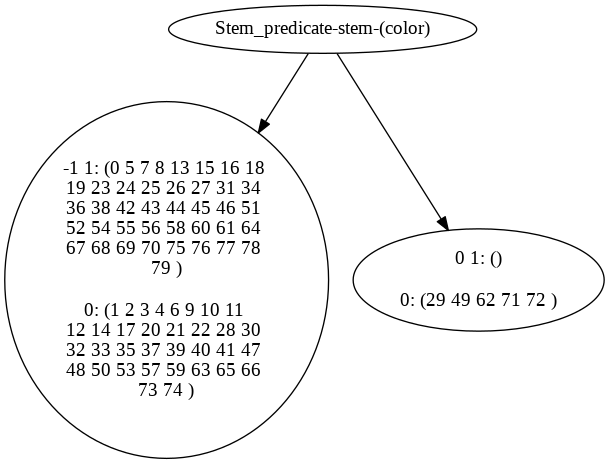



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_44_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(realist)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


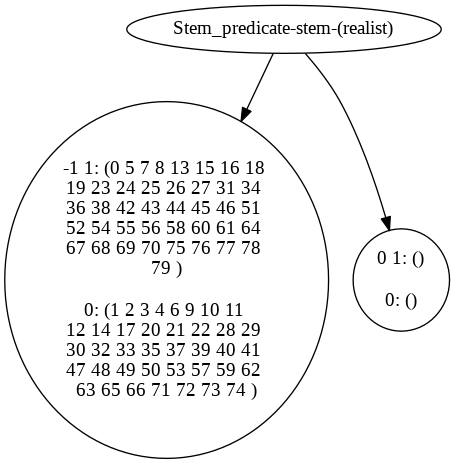



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_45_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(scene)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 51 52 
54 55 56 58 60 61 64 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 30 
32 33 35 37 39 40 41 47 
48 49 50 53 57 59 62 63 
65 66 71 72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(integration)"]
4->5
4->6
5 [color=blue, label="0 0: (29 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (46 )
"]
//
} } 


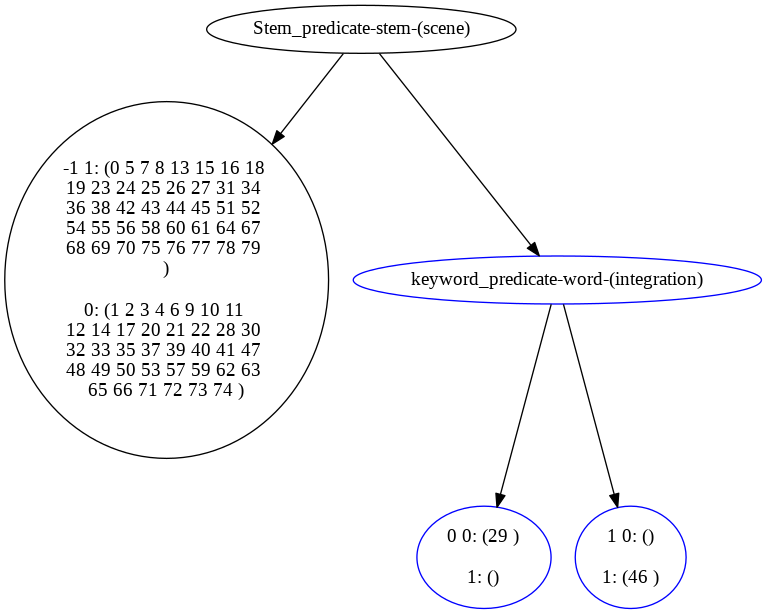



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_46_dot_file
digraph "rule" { 
// presize: 3, after_size: 7, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(artist)"]
1->2
1->4
2 [label="-1 1: (5 7 13 15 16 18 19 23 
24 25 26 27 31 34 36 38 
42 43 44 45 46 51 52 54 
55 56 58 60 61 64 67 68 
69 70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 12 
14 17 20 21 22 28 30 32 
33 35 37 39 40 47 48 49 
50 53 57 62 63 65 71 73 
74 )
"]
4 [color=blue, label="keyword_predicate-word-(urban)"]
4->5
4->7
5 [color=blue, label="0 0: (29 41 59 66 72 )

1: ()
"]
7 [color=blue, label="keyword_predicate-word-(working)"]
7->8
7->9
8 [color=blue, label="1 0: ()

1: (0 8 )
"]
9 [color=blue, label="0 0: (11 )

1: ()
"]
//
} } 


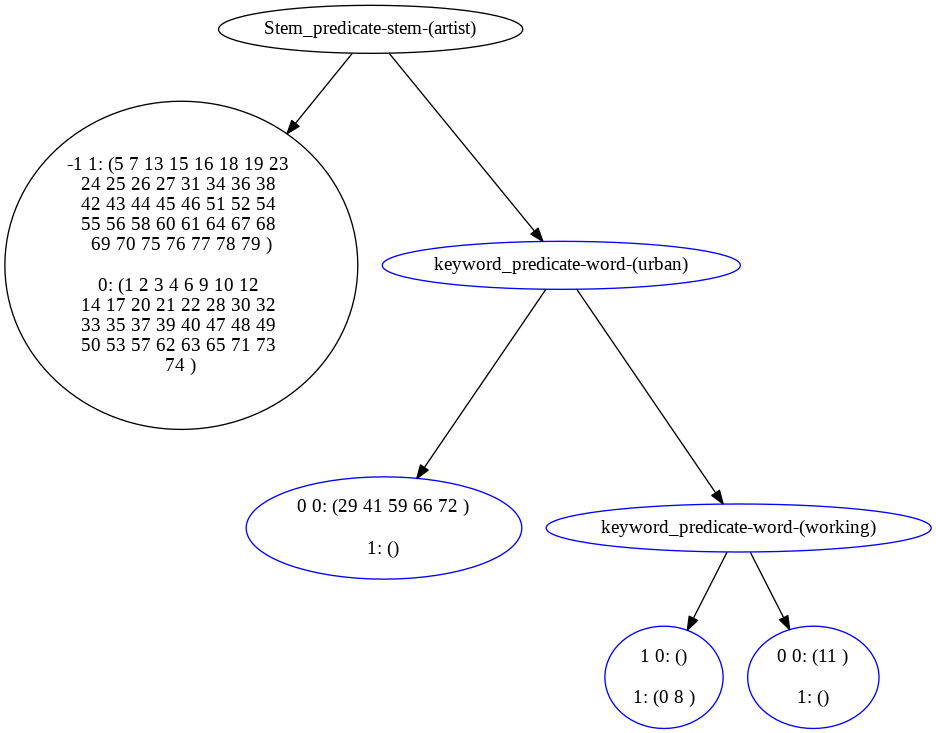



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_47_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:1
1 [label="Stem_predicate-stem-(charact)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 16 18 19 
23 24 25 26 27 31 34 36 
42 43 44 45 46 51 52 54 
55 56 58 60 61 64 67 68 
69 70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [color=yellow, label="1 1: (15 38 )

0: ()
"]
//
} } 


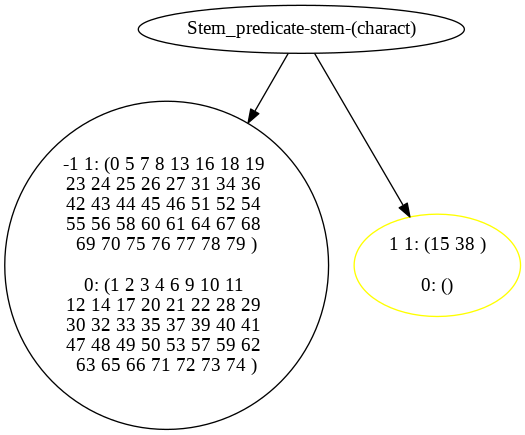



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_48_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(express)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


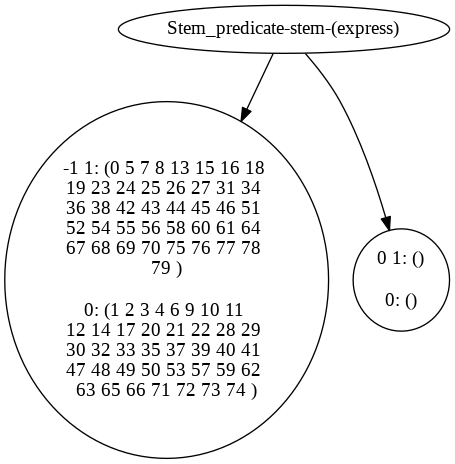



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_49_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(uniqu)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
32 33 35 37 39 40 41 47 
48 49 50 53 57 59 62 63 
65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: (30 )
"]
//
} } 


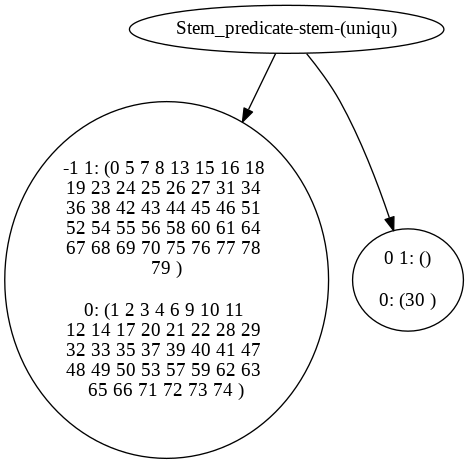



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_50_dot_file
digraph "rule" { 
// presize: 3, after_size: 13, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(design)"]
1->2
1->4
2 [label="-1 1: (0 7 13 15 16 18 19 23 
24 25 26 27 31 34 38 42 
43 45 46 51 52 58 67 70 
75 76 77 78 79 )

0: (1 2 4 9 10 12 14 17 
21 28 33 35 39 40 41 48 
49 50 53 57 59 63 65 66 
71 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(art)"]
4->7
4->10
7 [color=blue, label="keyword_predicate-word-(design)"]
7->8
7->13
10 [color=blue, label="keyword_predicate-word-(currently)"]
10->16
10->12
8 [color=blue, label="0 0: (3 47 )

1: ()
"]
13 [color=blue, label="keyword_predicate-word-(run)"]
13->14
13->15
16 [color=blue, label="keyword_predicate-word-(department)"]
16->17
16->18
12 [color=blue, label="1 0: ()

1: (8 36 )
"]
14 [color=blue, label="1 0: ()

1: (5 44 54 56 60 61 64 68 
69 )
"]
15 [color=blue, label="0 0: (30 )


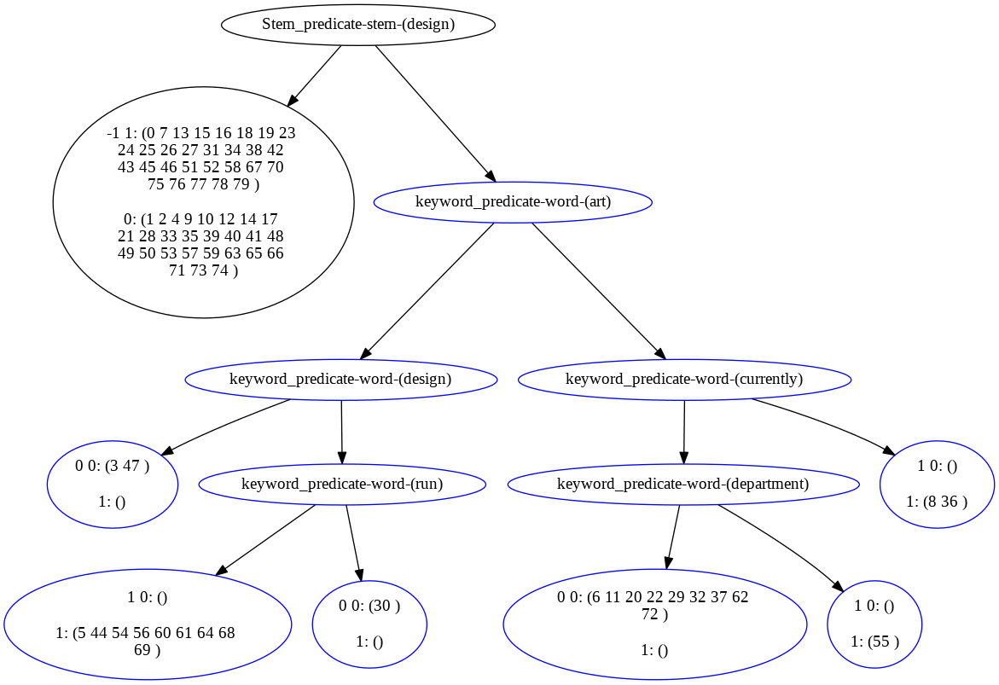



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_51_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(softwar,interfac)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


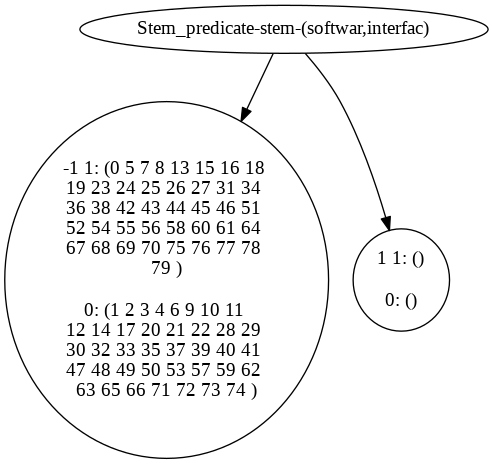



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_52_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(art,teacher)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


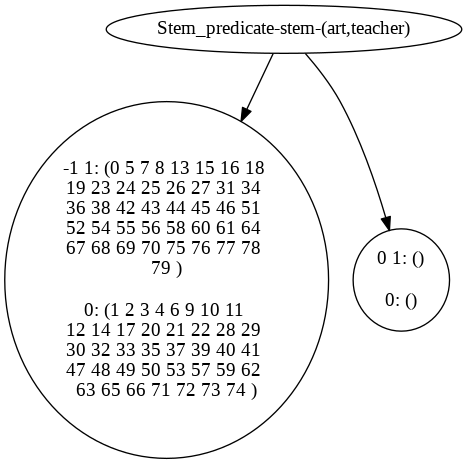



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_53_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(brushstrok)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


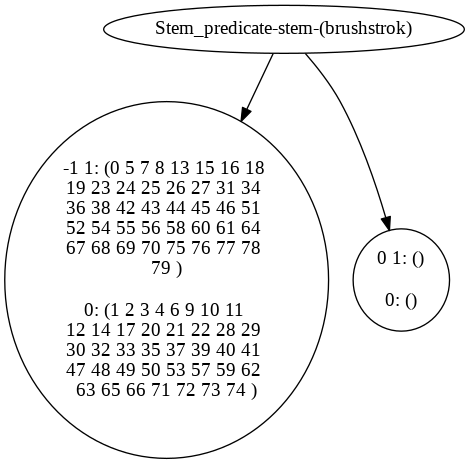



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_54_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(figur)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 41 47 
48 49 50 53 57 59 63 66 
71 72 73 74 )
"]
3 [label="0 1: ()

0: (40 62 65 )
"]
//
} } 


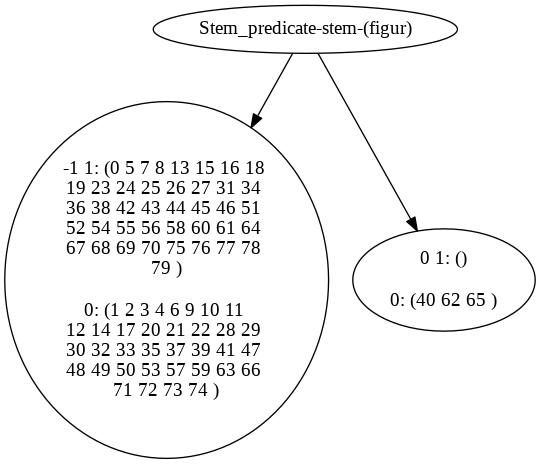



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_55_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(represent)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 10 11 12 
14 17 20 21 22 28 30 32 
33 35 37 39 40 41 47 48 
49 50 53 57 59 62 63 65 
71 72 73 74 )
"]
3 [label="0 1: ()

0: (9 29 66 )
"]
//
} } 


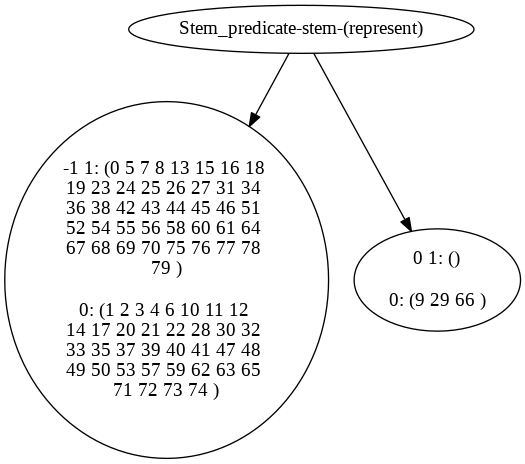



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_56_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(painter)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
38 42 43 44 45 46 51 52 
54 55 56 58 60 61 64 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 4 6 9 10 11 12 
14 17 20 21 22 28 29 30 
32 33 35 37 39 41 48 49 
50 53 57 59 62 63 65 66 
71 72 73 )
"]
4 [color=blue, label="keyword_predicate-word-(currently)"]
4->5
4->6
5 [color=blue, label="0 0: (3 40 47 74 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (36 )
"]
//
} } 


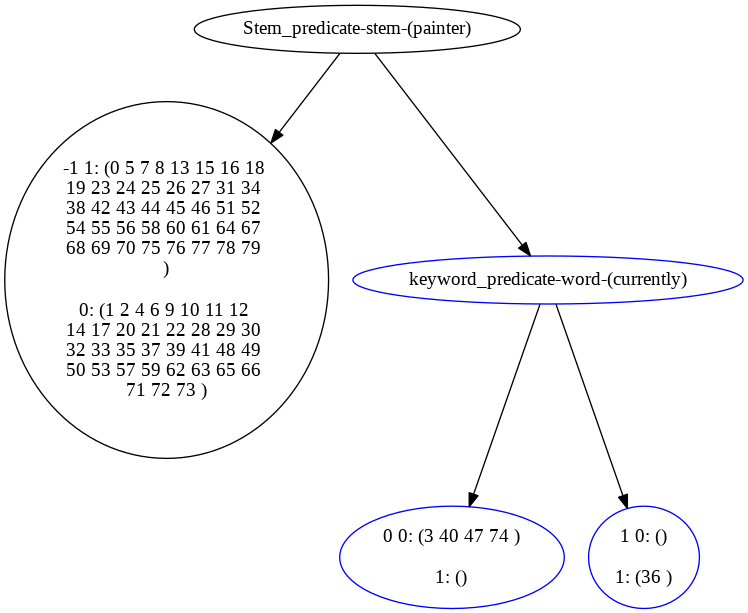



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_57_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(repres)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 12 
14 17 20 21 22 28 29 30 
32 33 35 37 39 40 41 47 
49 50 53 57 59 62 63 65 
66 71 72 73 74 )
"]
3 [label="0 1: ()

0: (11 48 )
"]
//
} } 


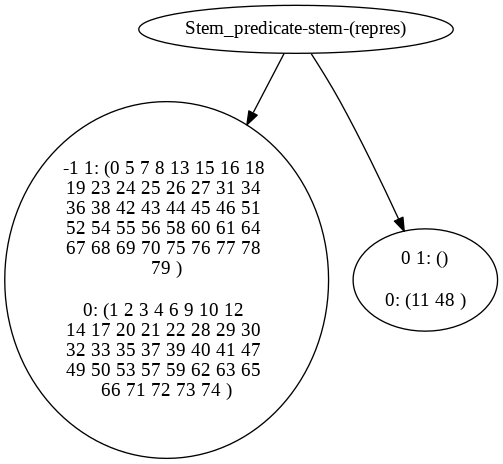



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_58_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(sceneri)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


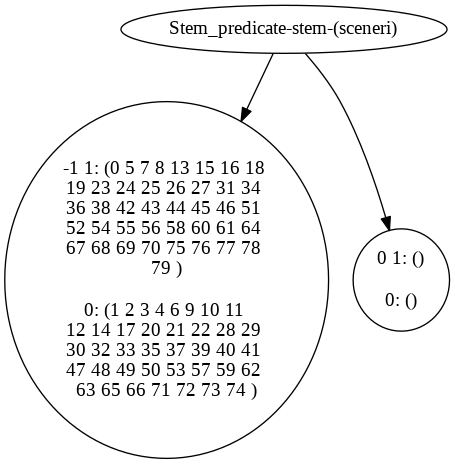



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_59_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(watercolor)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
38 42 43 44 45 46 51 52 
54 55 56 58 60 61 64 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
48 49 50 53 57 59 62 63 
65 66 72 74 )
"]
4 [color=blue, label="keyword_predicate-word-(currently)"]
4->5
4->6
5 [color=blue, label="0 0: (47 71 73 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (36 )
"]
//
} } 


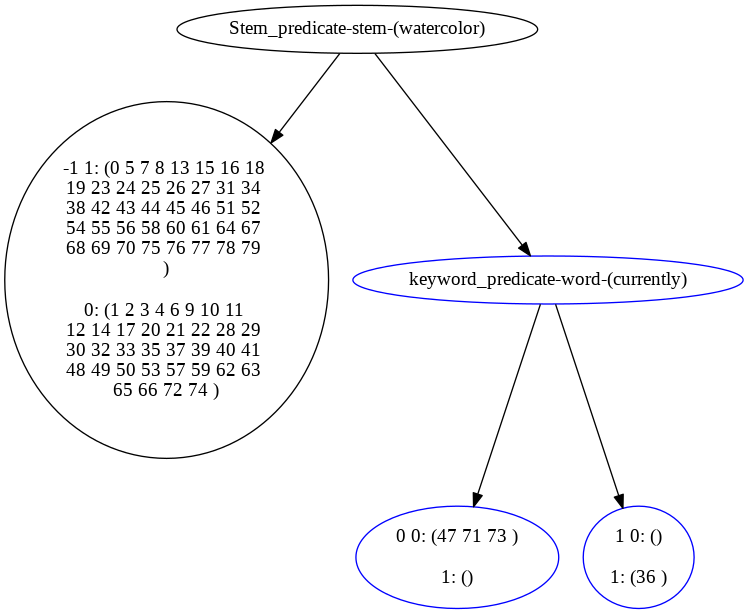



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_60_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(human,relationship)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


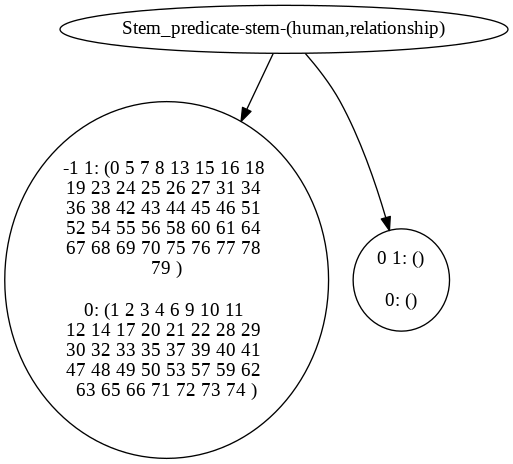



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_61_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(spiritu)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


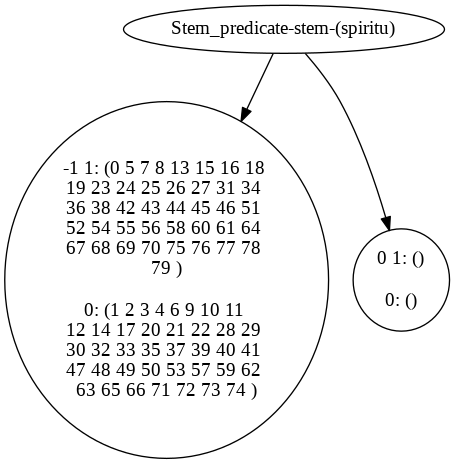



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_62_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:1
1 [label="Stem_predicate-stem-(visual,art)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 56 58 60 61 64 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [color=yellow, label="1 1: (55 )

0: ()
"]
//
} } 


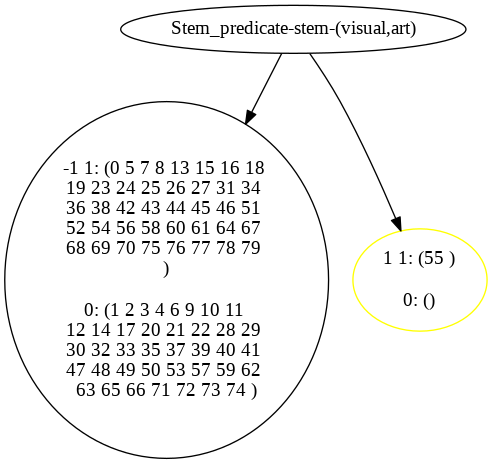



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_63_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(studio,practic)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="0 1: ()

0: ()
"]
//
} } 


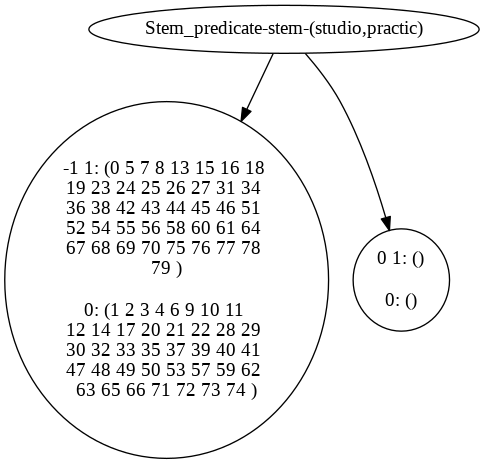



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_64_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(plan)"]
1->2
1->3
2 [label="-1 1: (0 5 7 13 15 16 18 19 
23 24 25 26 27 31 34 36 
38 42 43 44 45 46 51 52 
55 58 60 61 67 68 69 70 
75 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (8 54 56 64 )

0: ()
"]
//
} } 


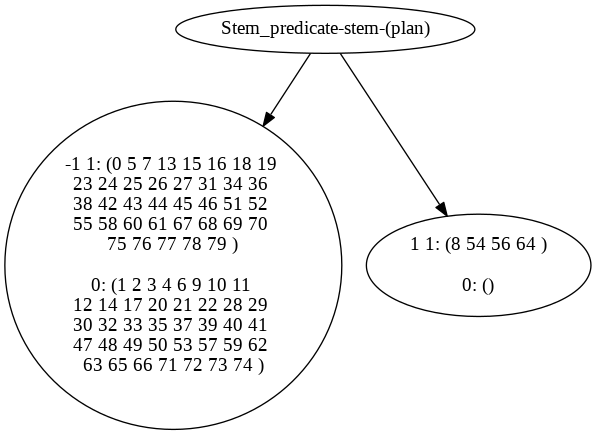



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_65_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(revit)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


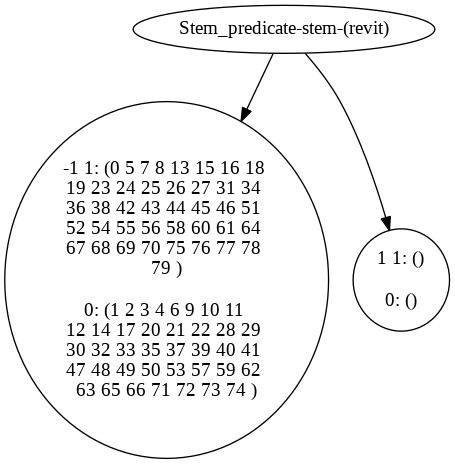



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_66_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(urban,design)"]
1->2
1->4
2 [label="-1 1: (0 5 7 13 15 16 18 19 
23 24 25 26 27 31 34 36 
38 42 43 44 45 46 51 52 
54 56 58 61 64 67 68 69 
70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 12 
14 17 20 21 22 28 29 30 
32 33 35 37 39 40 41 47 
48 49 50 53 57 59 62 63 
65 66 71 72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(designer)"]
4->5
4->6
5 [color=blue, label="1 0: ()

1: (8 55 60 )
"]
6 [color=blue, label="0 0: (11 )

1: ()
"]
//
} } 


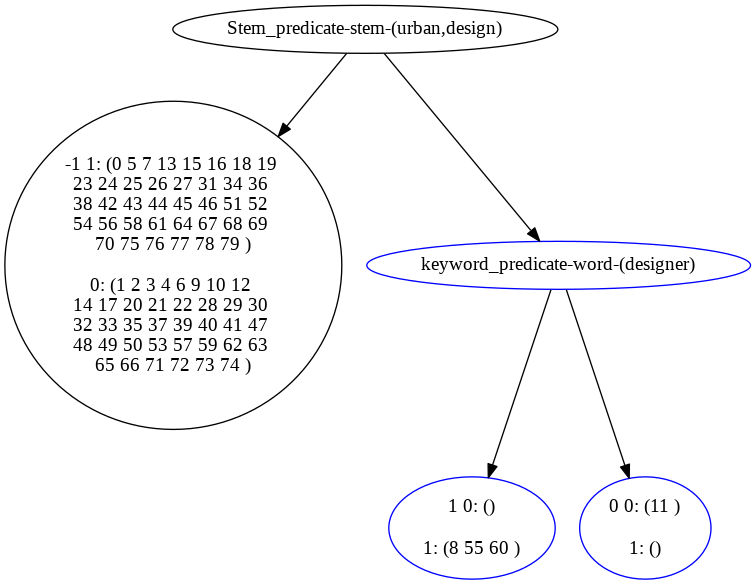



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_67_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(bachelor,of,scienc)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (67 )

0: ()
"]
//
} } 


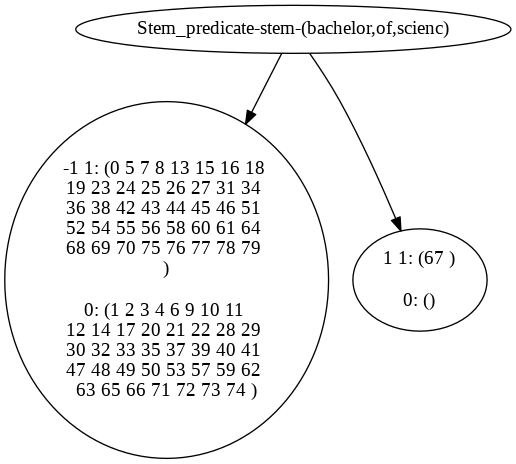



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_68_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(engin)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 46 52 54 
55 56 58 60 61 64 68 69 
70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 12 
14 17 20 21 22 28 29 30 
32 33 35 37 39 40 41 47 
48 49 50 53 57 59 62 63 
65 66 71 72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(working)"]
4->5
4->6
5 [color=blue, label="1 0: ()

1: (45 51 67 )
"]
6 [color=blue, label="0 0: (11 )

1: ()
"]
//
} } 


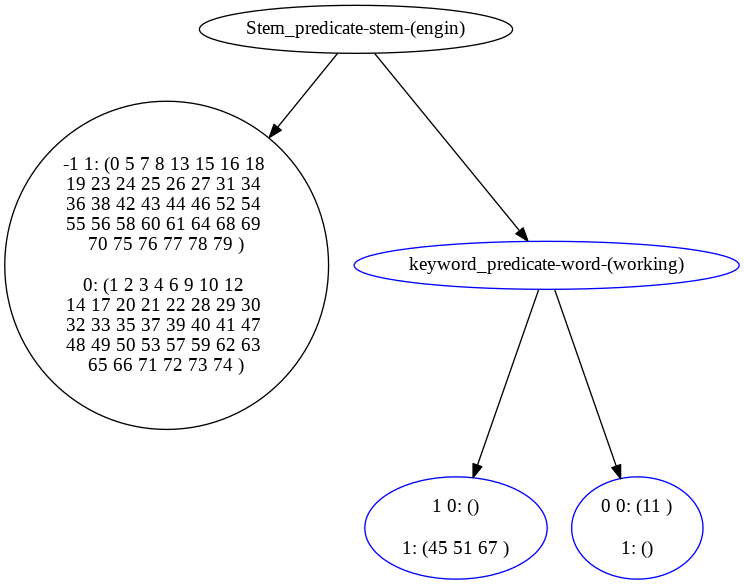



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_69_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(yale,colleg)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


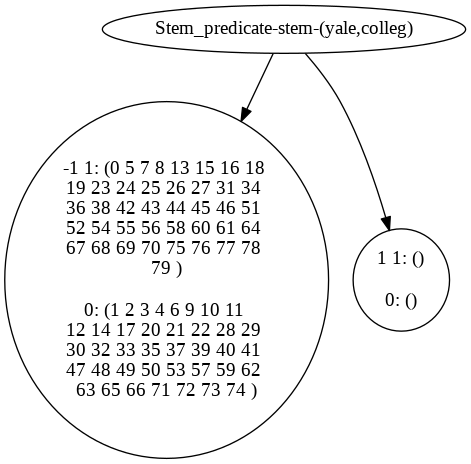



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_70_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(architectur,design)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
38 42 43 44 45 46 51 52 
56 58 61 64 67 70 75 76 
77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 30 
32 33 35 37 39 40 41 47 
48 49 50 53 57 59 62 63 
65 66 71 72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(work)"]
4->5
4->6
5 [color=blue, label="1 0: ()

1: (36 54 55 60 68 69 )
"]
6 [color=blue, label="0 0: (29 )

1: ()
"]
//
} } 


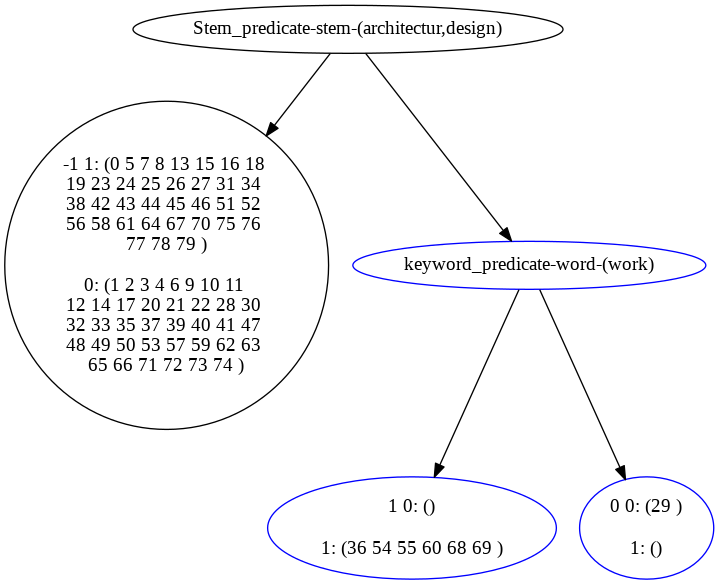



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_71_dot_file
digraph "rule" { 
// presize: 3, after_size: 7, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(project)"]
1->2
1->4
2 [label="-1 1: (5 7 13 15 16 18 19 23 
24 25 26 27 31 34 36 38 
42 43 44 45 46 52 55 58 
60 61 67 68 70 75 76 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 35 37 39 40 41 47 
48 49 50 53 57 62 63 66 
71 72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(research)"]
4->7
4->6
7 [color=blue, label="keyword_predicate-word-(henry)"]
7->8
7->9
6 [color=blue, label="0 0: (33 59 )

1: ()
"]
8 [color=blue, label="1 0: ()

1: (0 8 51 54 56 64 69 77 
)
"]
9 [color=blue, label="0 0: (65 )

1: ()
"]
//
} } 


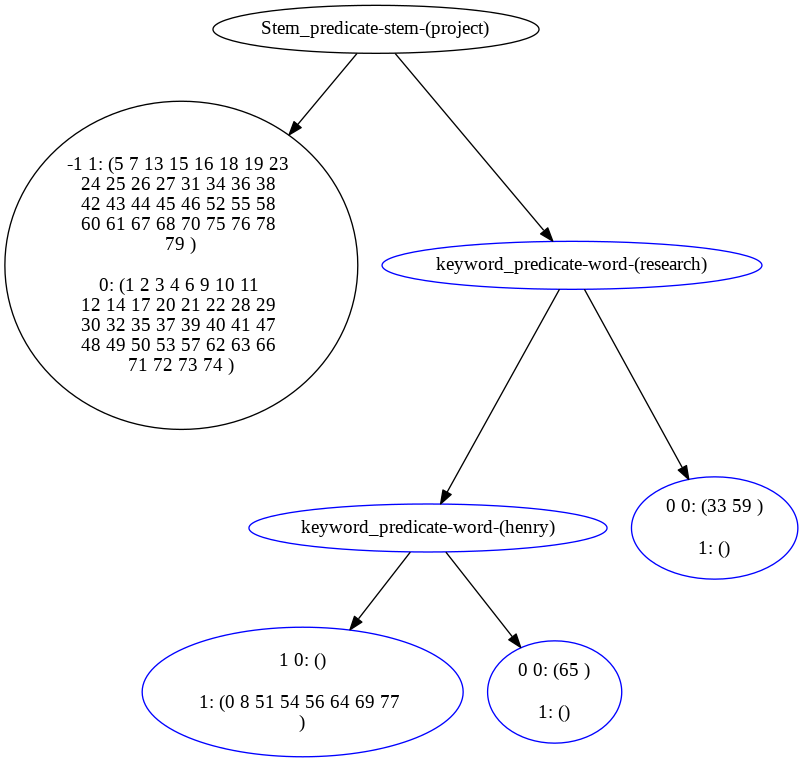



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_72_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(taught)"]
1->2
1->4
2 [label="-1 1: (5 7 8 13 15 16 18 19 
23 24 25 26 27 31 34 36 
38 42 43 44 45 46 51 54 
55 56 58 60 61 64 67 68 
69 70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 30 
32 33 35 37 40 41 47 48 
49 50 53 57 59 62 63 65 
66 71 72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(since)"]
4->5
4->6
5 [color=blue, label="0 0: (29 39 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (0 52 )
"]
//
} } 


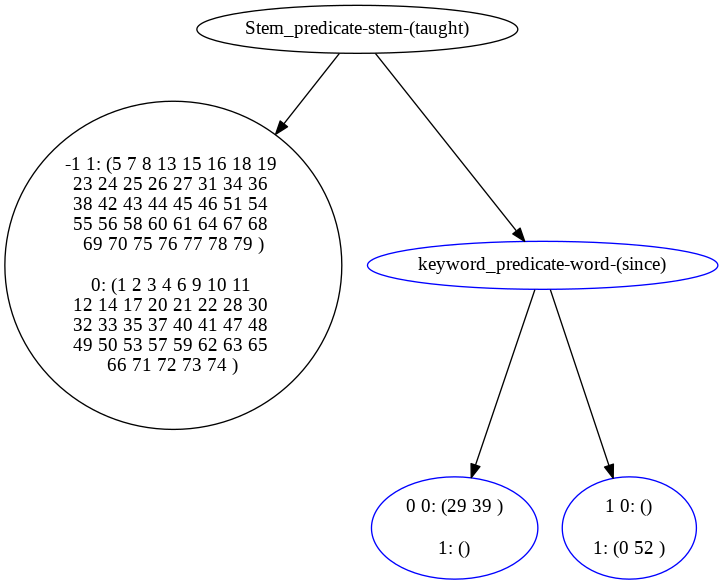



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_73_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:1
1 [label="Stem_predicate-stem-(construct)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 17 20 21 22 29 30 32 
33 35 37 39 40 41 47 48 
49 50 53 57 59 62 63 65 
66 71 72 73 74 )
"]
3 [color=yellow, label="0 1: ()

0: (14 28 )
"]
//
} } 


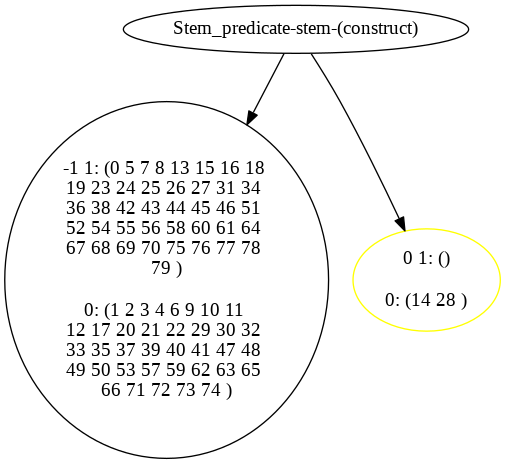



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_74_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(home,plan)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


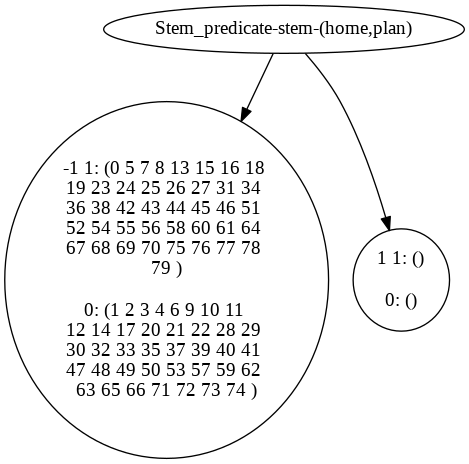



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_75_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(remodel)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


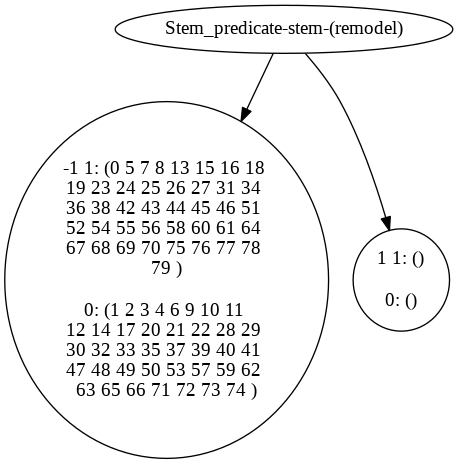



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_76_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(architectur,practic)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


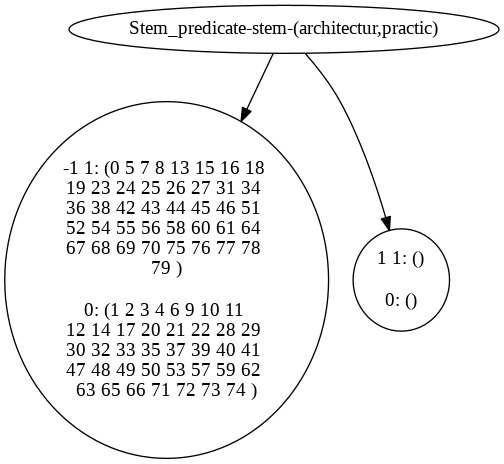



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_77_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(educ)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 26 27 31 34 36 
38 42 43 44 45 46 51 52 
54 55 56 58 60 61 64 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (25 )

0: ()
"]
//
} } 


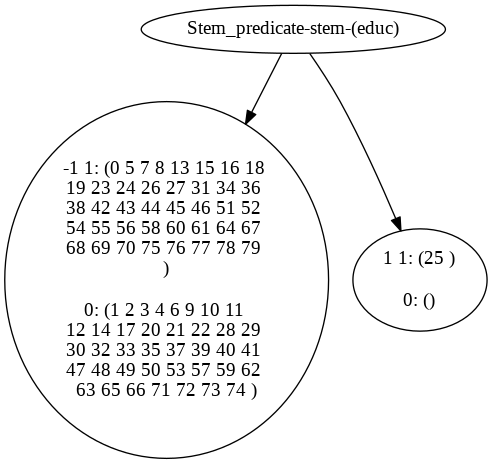



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_78_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(interdisciplinari)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


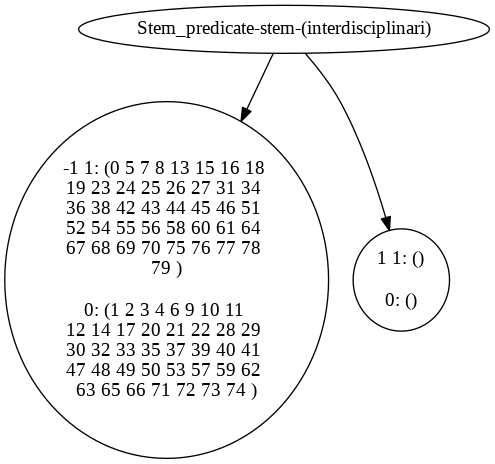



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_79_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(committe)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


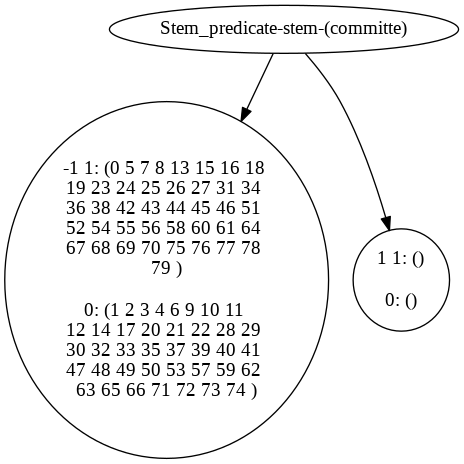



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_80_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:1
1 [label="Stem_predicate-stem-(serv)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 30 
32 33 35 37 39 40 41 47 
48 49 50 53 57 59 62 63 
65 66 71 72 73 74 )
"]
3 [color=yellow, label="0 1: ()

0: (29 )
"]
//
} } 


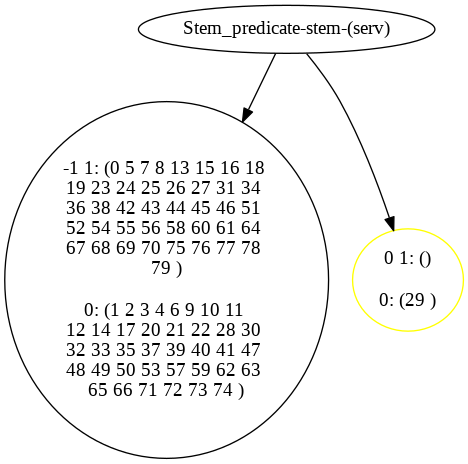



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_81_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(comput,scienc)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 44 45 46 51 52 
54 55 56 58 60 61 64 68 
69 70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (43 67 )

0: ()
"]
//
} } 


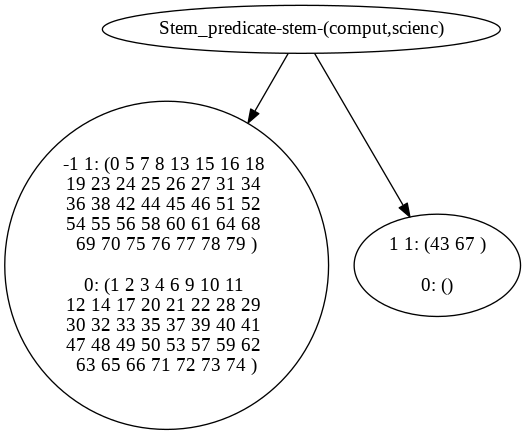



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_82_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(data,wareh)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


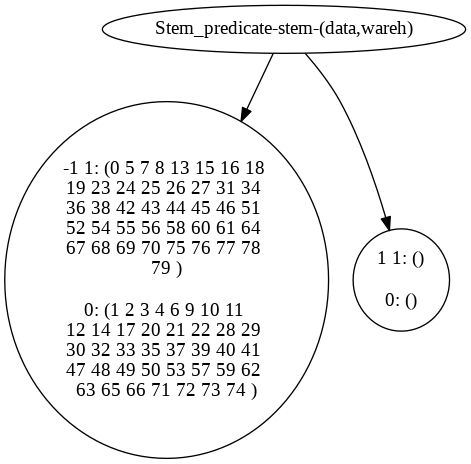



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_83_dot_file
digraph "rule" { 
// presize: 3, after_size: 7, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(develop)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 44 46 51 52 54 55 
56 60 61 67 68 69 70 75 
76 77 78 )

0: (1 2 4 6 10 11 12 14 
17 20 21 22 28 29 30 32 
33 35 37 39 40 41 47 48 
49 50 53 57 59 62 63 66 
71 72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(work)"]
4->7
4->6
7 [color=blue, label="keyword_predicate-word-(foundation)"]
7->8
7->9
6 [color=blue, label="0 0: (3 65 )

1: ()
"]
8 [color=blue, label="1 0: ()

1: (42 43 45 58 64 79 )
"]
9 [color=blue, label="0 0: (9 )

1: ()
"]
//
} } 


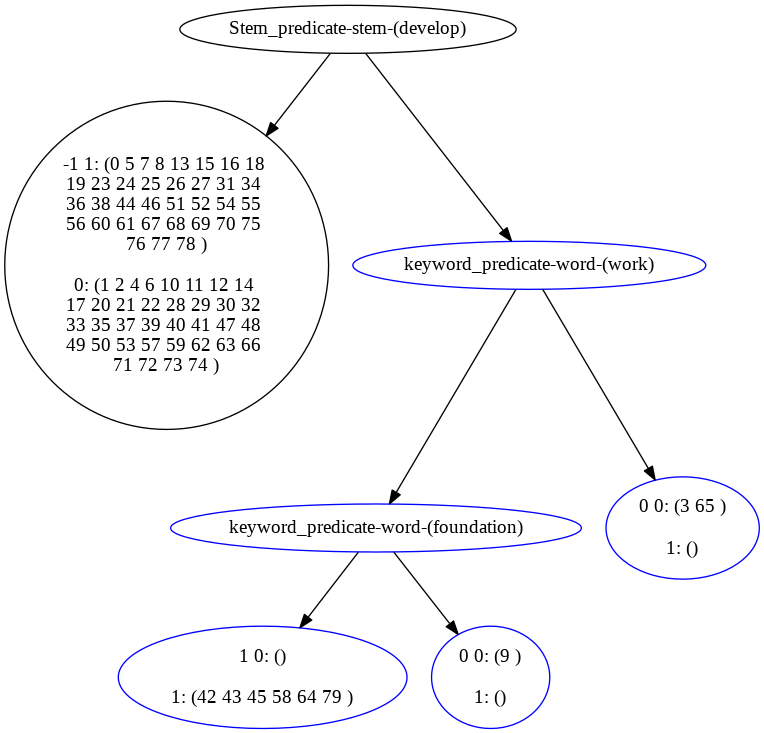



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_84_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(parallel,process)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


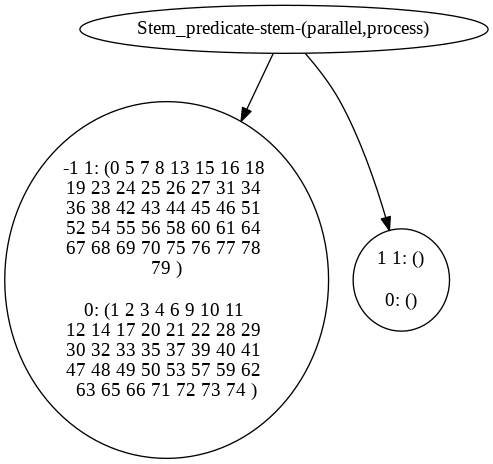



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_85_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(research)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
69 70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 22 28 29 30 
32 35 37 39 40 41 47 48 
49 50 53 57 62 63 65 66 
71 72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(university)"]
4->5
4->6
5 [color=blue, label="0 0: (21 33 59 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (67 68 )
"]
//
} } 


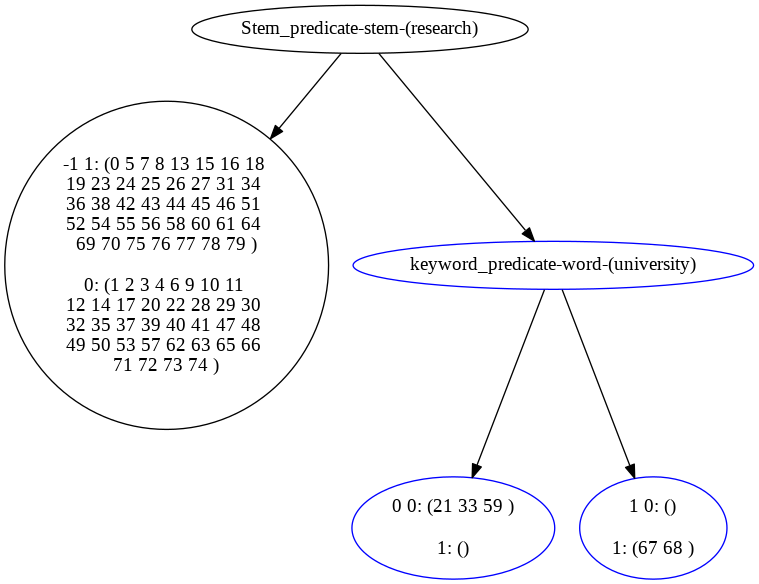



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_86_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(architectur,review)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


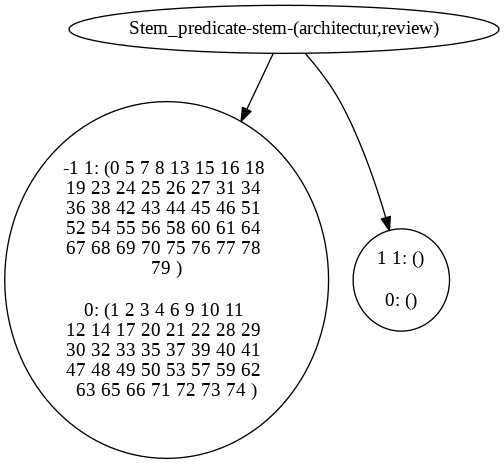



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_87_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(it,consult)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 52 
54 55 56 58 60 61 64 68 
69 70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (51 67 )

0: ()
"]
//
} } 


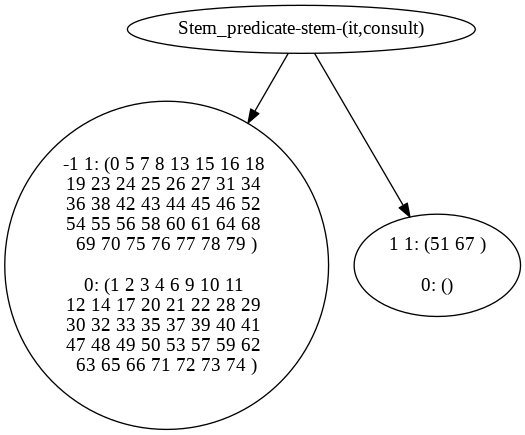



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_88_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(it,strategi)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


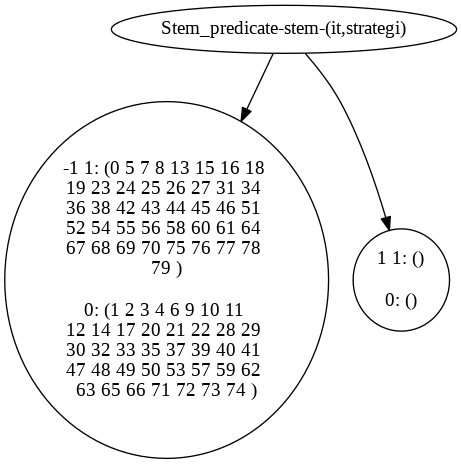



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_89_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(solut,architectur)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


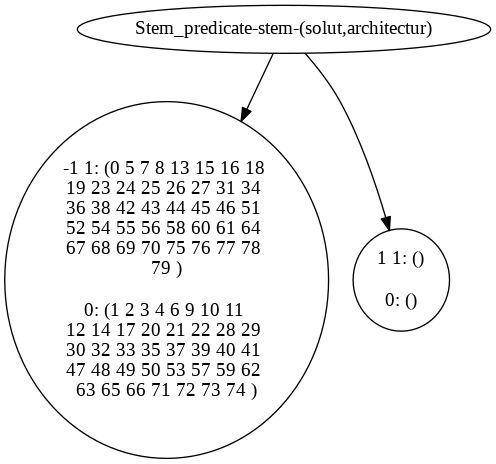



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_90_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(open,sourc)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 60 61 64 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (58 )

0: ()
"]
//
} } 


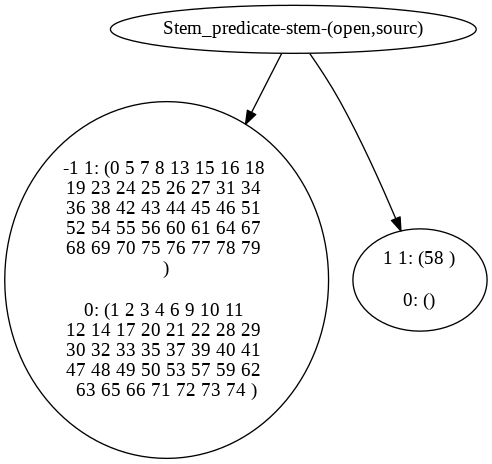



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_91_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(softwar)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 44 46 51 52 54 
55 56 58 60 61 67 68 69 
70 75 76 77 78 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (43 45 64 79 )

0: ()
"]
//
} } 


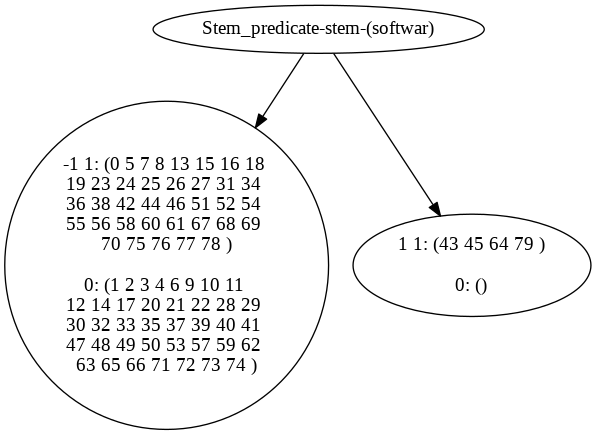



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_92_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(motorola)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


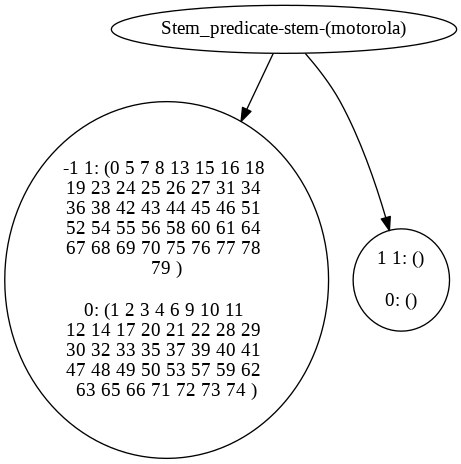



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_93_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(ciso)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


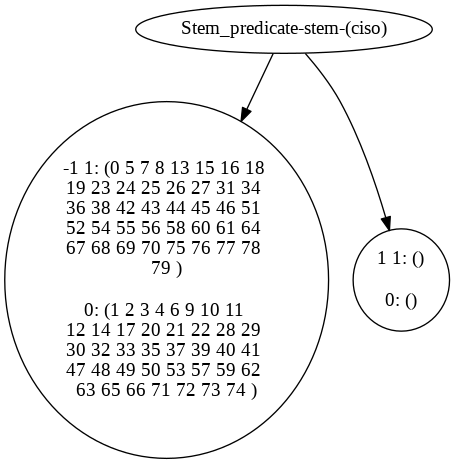



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_94_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(implement)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 51 52 
54 55 56 58 60 61 64 67 
68 69 70 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (46 75 )

0: ()
"]
//
} } 


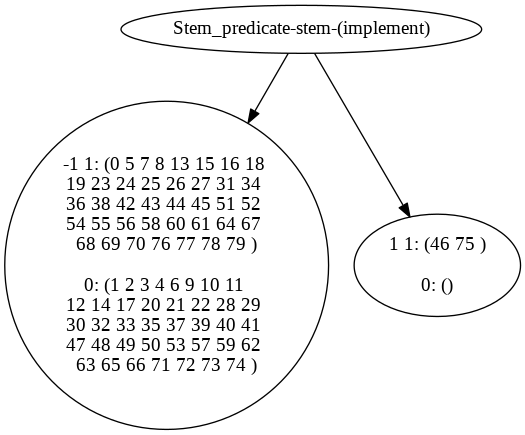



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_95_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(secur)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 52 
54 55 56 58 60 61 67 68 
69 70 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (51 64 75 )

0: ()
"]
//
} } 


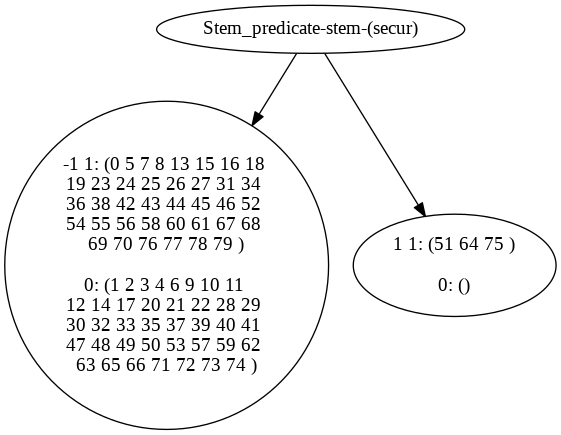



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_96_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(solut)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 51 52 
54 55 56 58 60 61 64 67 
68 69 70 75 76 77 78 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (46 79 )

0: ()
"]
//
} } 


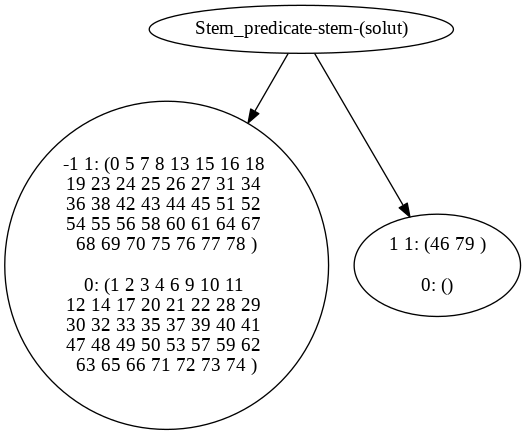



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_97_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(sustain,victoria)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


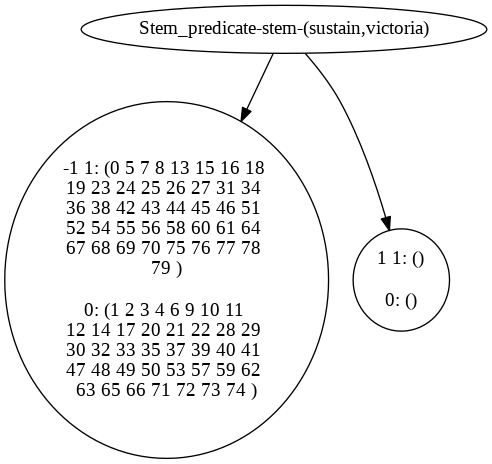



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_98_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(unit,arab,emir)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


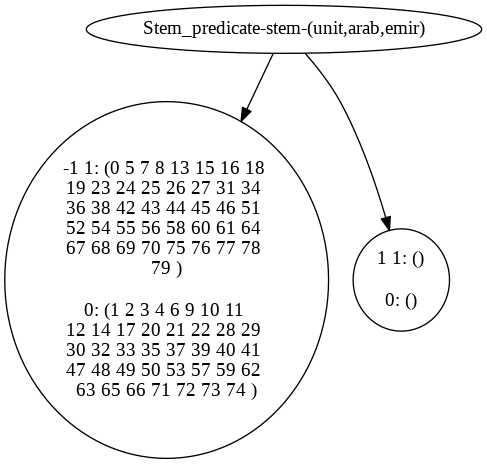



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_99_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(partnership)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


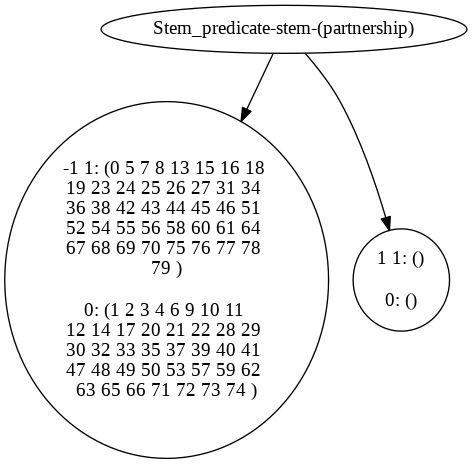



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_100_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(profession)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 20 21 22 28 29 30 
32 33 35 37 39 40 41 47 
48 49 50 53 57 59 62 63 
65 66 71 72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(certified)"]
4->5
4->6
5 [color=blue, label="0 0: (17 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (76 )
"]
//
} } 


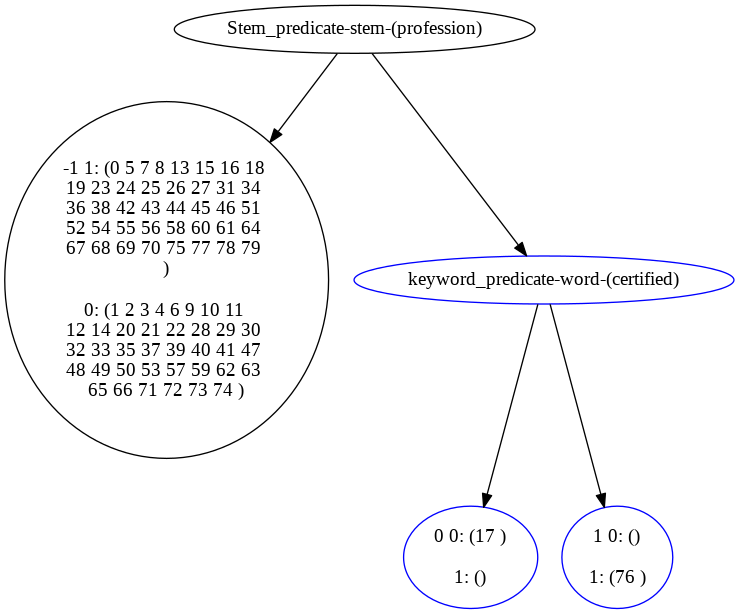



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_101_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(architectur,competit)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 61 64 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (60 )

0: ()
"]
//
} } 


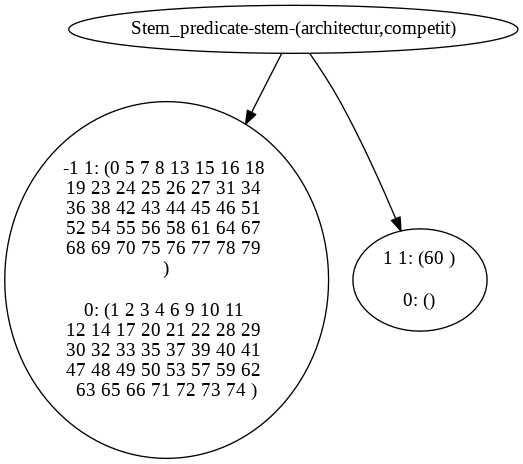



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_102_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(architectur,firm)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


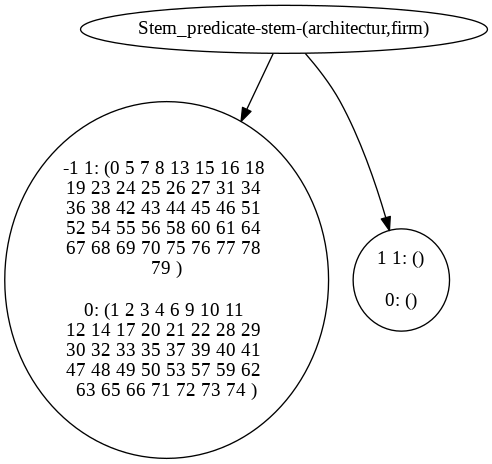



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_103_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(design,softwar)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (64 )

0: ()
"]
//
} } 


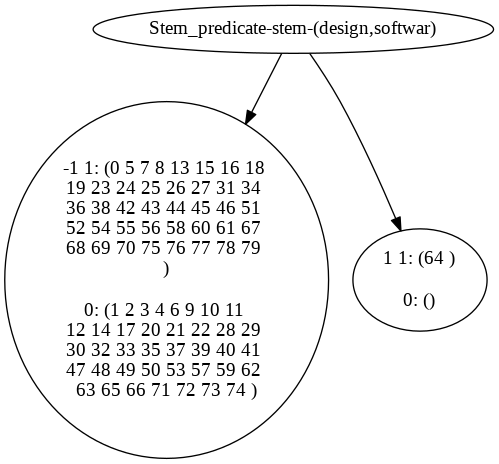



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_104_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(board,of,director)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


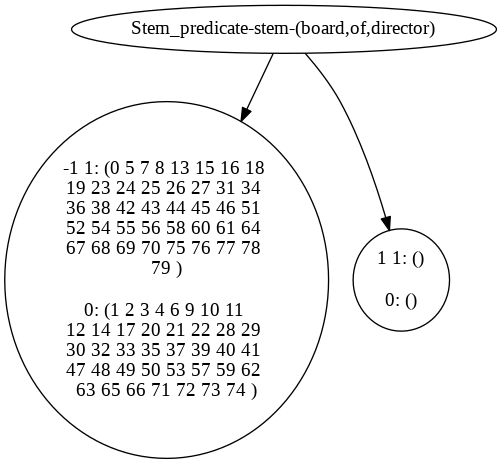



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_105_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(java,programm)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


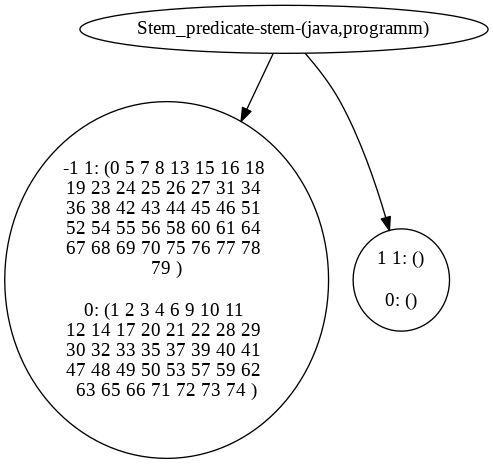



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_106_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(softwar,architect)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


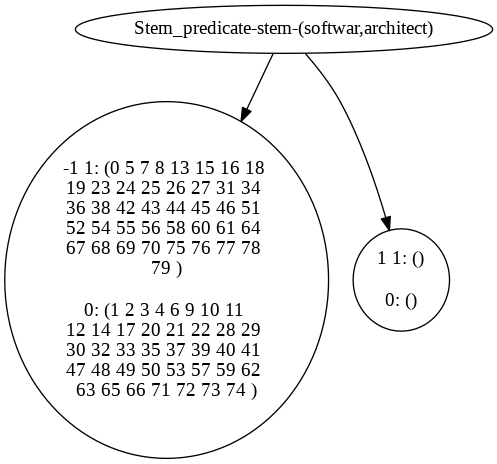



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_107_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(user,experi)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


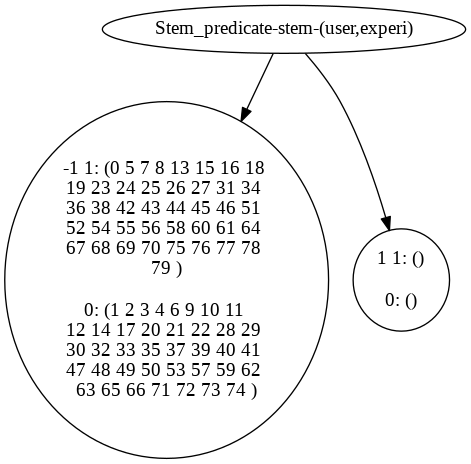



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_108_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(market,research)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


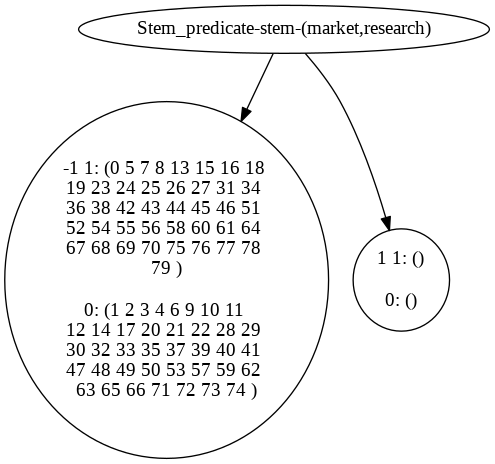



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_109_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(startup)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


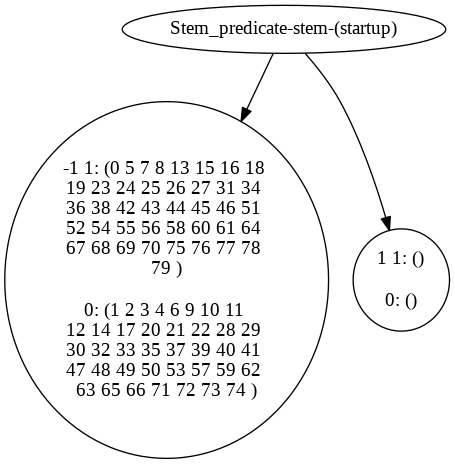



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_110_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(it,organ)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (67 )

0: ()
"]
//
} } 


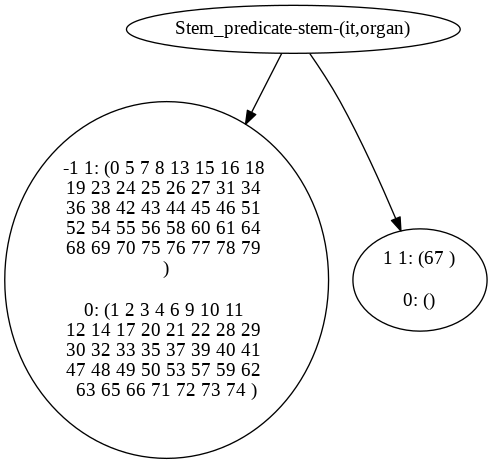



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_111_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(softwar,vendor)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


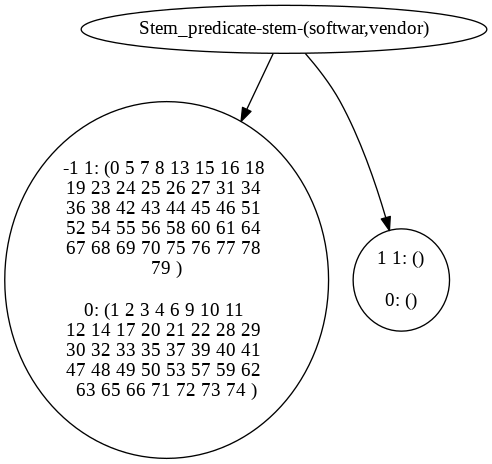



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_112_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(technolog,solut)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


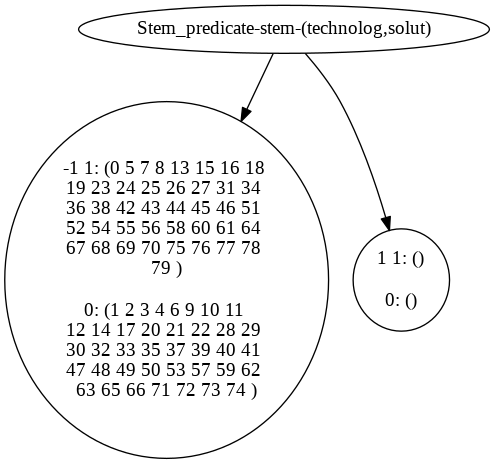



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_113_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(framework)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 43 44 51 52 54 55 
56 58 60 61 64 67 68 69 
70 75 76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (42 45 46 )

0: ()
"]
//
} } 


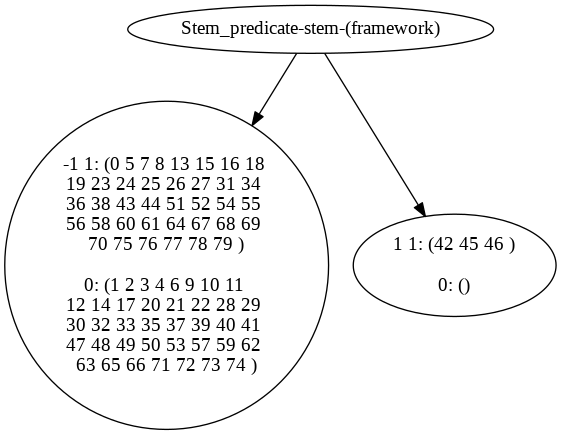



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_114_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(librari)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


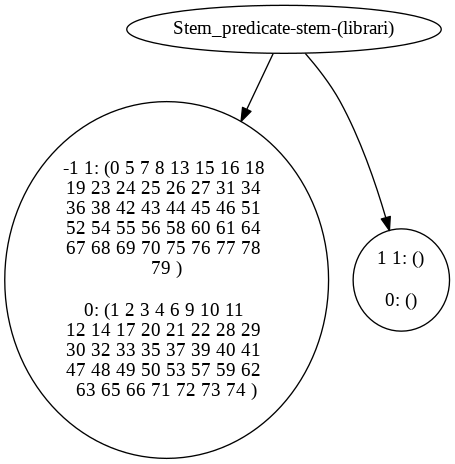



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_115_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(system)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 46 52 54 
55 56 58 60 61 64 68 69 
76 77 78 79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (45 51 67 70 75 )

0: ()
"]
//
} } 


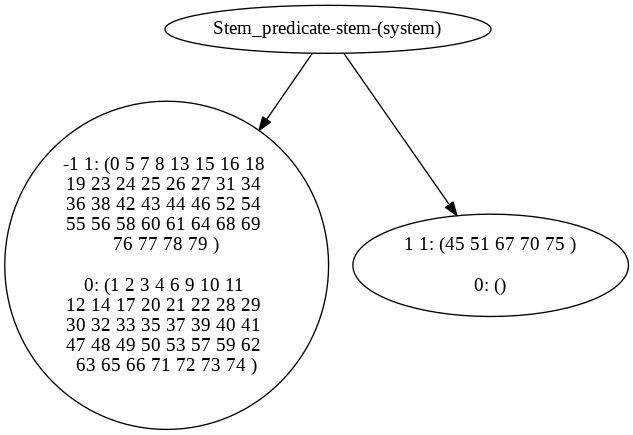



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_116_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(parallel,softwar)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


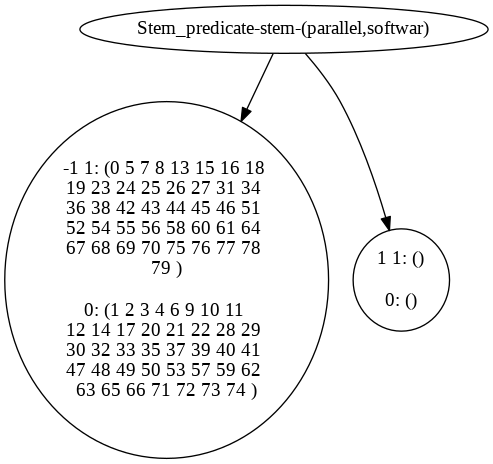



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_117_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(product,architect)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 56 58 60 61 64 67 
68 69 70 75 76 77 78 79 
)

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: (55 )

0: ()
"]
//
} } 


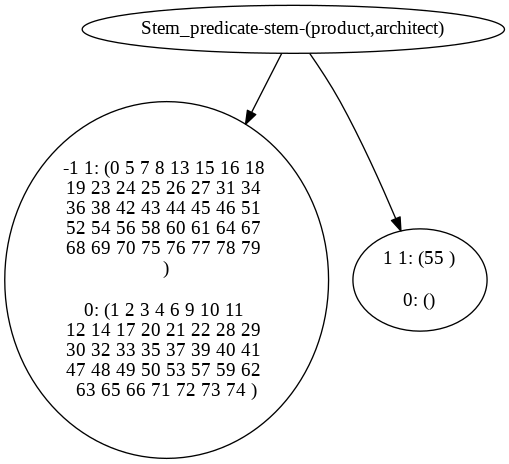



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_118_dot_file
digraph "rule" { 
// presize: 3, after_size: 3, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(program,languag)"]
1->2
1->3
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
52 54 55 56 58 60 61 64 
67 68 69 70 75 76 77 78 
79 )

0: (1 2 3 4 6 9 10 11 
12 14 17 20 21 22 28 29 
30 32 33 35 37 39 40 41 
47 48 49 50 53 57 59 62 
63 65 66 71 72 73 74 )
"]
3 [label="1 1: ()

0: ()
"]
//
} } 


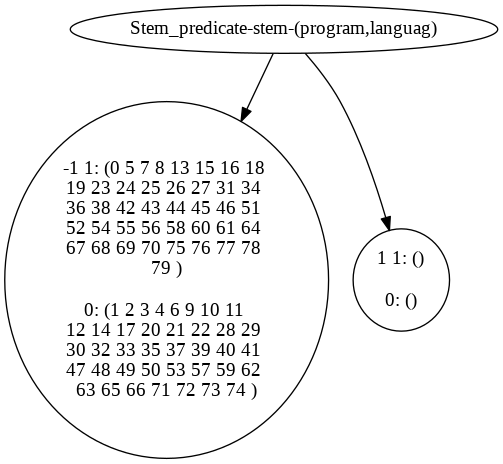



../../rbbm_src/gpt_experiment_results_folders_vary_uq/_20240201114658/20240201114658_tree_information_gain_119_dot_file
digraph "rule" { 
// presize: 3, after_size: 5, deleted: False factor: 0.0 reverse_cnt:0
1 [label="Stem_predicate-stem-(offic)"]
1->2
1->4
2 [label="-1 1: (0 5 7 8 13 15 16 18 
19 23 24 25 26 27 31 34 
36 38 42 43 44 45 46 51 
54 56 58 60 61 64 67 68 
69 70 75 76 77 78 79 )

0: (1 3 4 6 9 14 17 20 
21 22 28 29 30 32 33 35 
37 39 40 41 47 48 49 50 
53 57 59 62 63 65 66 71 
72 73 74 )
"]
4 [color=blue, label="keyword_predicate-word-(architect)"]
4->5
4->6
5 [color=blue, label="0 0: (2 10 11 12 )

1: ()
"]
6 [color=blue, label="1 0: ()

1: (52 55 )
"]
//
} } 


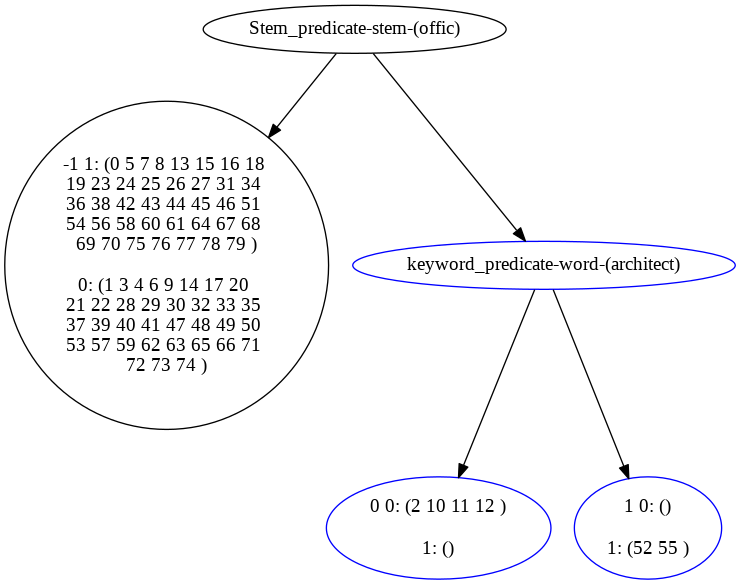

In [142]:
df_user_input = show_trees(dir4+'_20240201114658/')